<a href="https://colab.research.google.com/github/bethnan87/bethnan87.github.io/blob/master/Copy_of_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Climate Change Earth Surface Temperature Analysis
##by Jiasin Claire Lua, Bethany Hellerich, and Eric Bryan 

This project analyzes global temperature change trends and patterns with the goal to identify regions most affected by climate change and predict future temperature trends. 

These analyses enable enformed decision-making regarding climate change mitigation and adaptation strategies. 

This notebook can be run to show our process, modeling, and results. 

For our project, there will only be 1 deliverable, which is this colab, as we have chosen to submit an annotated notebook.

# 1. Library and Setup Jargon
Section 1 sets up the notebook by loading the libraries and downloading the Berkeley Climate Data set.

## 1.1 Install packages

Here, we install our Python packages using pip: 

* pandas: a library for data manipulation and 
analysis.
* pandasql: a package that allows SQL queries to be run on pandas dataframes.
* kaggle: a package for working with the Kaggle API to download and upload datasets.
* country_converter: a package that provides functionality to convert between different country name formats.
* pycountry: a package that provides data and functions for working with ISO country codes.
* seaborn: a library for creating statistical graphics in Python.
* plotly: a library for creating interactive data visualizations.
* statsmodels: a library for statistical modeling and analysis.
* sklearn: a library for machine learning in Python.
* pmdarima: a package that provides auto-ARIMA functionality for time series forecasting.
* s2sphere: a package for spherical geometry operations and spatial indexing on the sphere. It is a Python port of the S2 Geometry Library.

In [ ]:
# Install packages
!pip install pandas
!pip install pandasql
!pip install kaggle

!pip install country_converter
!pip install pycountry
!pip install seaborn
!pip install plotly
!pip install statsmodels
!pip install scikit-learn
!pip install pmdarima
!pip install s2sphere

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in

In [ ]:
# Import libs
import pandas as pd
import pandasql as sql
import numpy as np

## 1.2 Download Climate Dataset

Our Climate Change: Earth Surface Temperature data source is from Kaggle and can be found [here](https://www.kaggle.com/datasets/berkeleyearth/climate-change-earth-surface-temperature-data). 

In [ ]:
# setup kaggle.json keys from Kaggle
# need to download kaggle.json first and upload it to runtime files
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# Download dataset
!kaggle datasets download -d berkeleyearth/climate-change-earth-surface-temperature-data
!unzip climate-change-earth-surface-temperature-data.zip

 96% 81.0M/84.7M [00:02<00:00, 36.6MB/s]
100% 84.7M/84.7M [00:03<00:00, 29.1MB/s]
Archive:  climate-change-earth-surface-temperature-data.zip
  inflating: GlobalLandTemperaturesByCity.csv  
  inflating: GlobalLandTemperaturesByCountry.csv  
  inflating: GlobalLandTemperaturesByMajorCity.csv  
  inflating: GlobalLandTemperaturesByState.csv  
  inflating: GlobalTemperatures.csv  


In [ ]:
# Download dataset
!kaggle datasets download -d prashant808/global-gdp-dataset-2021
!unzip global-gdp-dataset-2021.zip

100% 74.0k/74.0k [00:00<00:00, 659kB/s]
100% 74.0k/74.0k [00:00<00:00, 657kB/s]
Archive:  global-gdp-dataset-2021.zip
  inflating: API_NY.GDP.MKTP.CD_DS2_en_csv_v2_4413598.csv  


# 2. Data Wrangling, Cleaning and Shaping
This section performs data preprocessing so that the data will be in a suitable condition to be used for analysis.

## 2.1 Create Panda Dataframes

This code is reading multiple CSV files related to global land and temperature data. The data is being read using the Pandas library and stored in different dataframes.

In [ ]:
# For hosted 
TempsByCity = pd.read_csv('/content/GlobalLandTemperaturesByCity.csv')
TempsByMajorCity = pd.read_csv('/content/GlobalLandTemperaturesByMajorCity.csv')
TempsByState = pd.read_csv('/content/GlobalLandTemperaturesByState.csv')
Temps = pd.read_csv('/content/GlobalTemperatures.csv')
TempsByCountry = pd.read_csv('/content/GlobalLandTemperaturesByCountry.csv')

# for local
# TempsByCity = pd.read_csv('~/GlobalLandTemperaturesByCity.csv')
# TempsByMajorCity = pd.read_csv('~/GlobalLandTemperaturesByMajorCity.csv')
# TempsByState = pd.read_csv('~/GlobalLandTemperaturesByState.csv')
# Temps = pd.read_csv('~/GlobalTemperatures.csv')
# TempsByCountry = pd.read_csv('~/GlobalLandTemperaturesByCountry.csv')

## 2.2 Preview data

Here we want to preview the data by eyeball it to get a sense of what the data looks like. We can see the results of our dataframes from the previous section - a preview of temperature by city, country, major city, state, and overall temperatures. 

In [ ]:
TempsByCity.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude
0,1743-11-01,6.068,1.737,Århus,Denmark,57.05N,10.33E
1,1743-12-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
2,1744-01-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
3,1744-02-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
4,1744-03-01,NaN,NaN,Århus,Denmark,57.05N,10.33E


In [ ]:
TempsByCity['Country'].unique()

array(['Denmark', 'Turkey', 'Kazakhstan', 'China', 'Spain', 'Germany',
       'Nigeria', 'Iran', 'Russia', 'Canada', "Côte D'Ivoire",
       'United Kingdom', 'Saudi Arabia', 'Japan', 'United States',
       'India', 'Benin', 'United Arab Emirates', 'Mexico', 'Venezuela',
       'Ghana', 'Ethiopia', 'Australia', 'Yemen', 'Indonesia', 'Morocco',
       'Pakistan', 'France', 'Libya', 'Burma', 'Brazil', 'South Africa',
       'Syria', 'Egypt', 'Algeria', 'Netherlands', 'Malaysia', 'Portugal',
       'Ecuador', 'Italy', 'Uzbekistan', 'Philippines', 'Madagascar',
       'Chile', 'Belgium', 'El Salvador', 'Romania', 'Peru', 'Colombia',
       'Tanzania', 'Tunisia', 'Turkmenistan', 'Israel', 'Eritrea',
       'Paraguay', 'Greece', 'New Zealand', 'Vietnam', 'Cameroon', 'Iraq',
       'Afghanistan', 'Argentina', 'Azerbaijan', 'Moldova', 'Mali',
       'Congo (Democratic Republic Of The)', 'Thailand',
       'Central African Republic', 'Bosnia And Herzegovina', 'Bangladesh',
       'Switzerland'

In [ ]:
TempsByCountry.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
0,1743-11-01,4.384,2.294,Åland
1,1743-12-01,NaN,NaN,Åland
2,1744-01-01,NaN,NaN,Åland
3,1744-02-01,NaN,NaN,Åland
4,1744-03-01,NaN,NaN,Åland


In [ ]:
TempsByMajorCity.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude
0,1849-01-01,26.704,1.435,Abidjan,Côte D'Ivoire,5.63N,3.23W
1,1849-02-01,27.434,1.362,Abidjan,Côte D'Ivoire,5.63N,3.23W
2,1849-03-01,28.101,1.612,Abidjan,Côte D'Ivoire,5.63N,3.23W
3,1849-04-01,26.140,1.387,Abidjan,Côte D'Ivoire,5.63N,3.23W
4,1849-05-01,25.427,1.200,Abidjan,Côte D'Ivoire,5.63N,3.23W


In [ ]:
TempsByState.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,State,Country
0,1855-05-01,25.544,1.171,Acre,Brazil
1,1855-06-01,24.228,1.103,Acre,Brazil
2,1855-07-01,24.371,1.044,Acre,Brazil
3,1855-08-01,25.427,1.073,Acre,Brazil
4,1855-09-01,25.675,1.014,Acre,Brazil


In [ ]:
Temps.head()

,dt,LandAverageTemperature,LandAverageTemperatureUncertainty,LandMaxTemperature,LandMaxTemperatureUncertainty,LandMinTemperature,LandMinTemperatureUncertainty,LandAndOceanAverageTemperature,LandAndOceanAverageTemperatureUncertainty
0,1750-01-01,3.034,3.574,NaN,NaN,NaN,NaN,NaN,NaN
1,1750-02-01,3.083,3.702,NaN,NaN,NaN,NaN,NaN,NaN
2,1750-03-01,5.626,3.076,NaN,NaN,NaN,NaN,NaN,NaN
3,1750-04-01,8.490,2.451,NaN,NaN,NaN,NaN,NaN,NaN
4,1750-05-01,11.573,2.072,NaN,NaN,NaN,NaN,NaN,NaN


## 2.3 Data Preprocessing

In this section, we will ensure clean and pre-process the data so that data will be in a suitable format for us to visualize and model. Here are the data preprocessing steps that are done in this section


*   Convert data to the correct datatime format
*   Data splitting into columns
*   Handle missing data by dropping instances with no ISO3 code
*   Add country mapping
*   Drop duplicates

You can follow through the comments in each of the code section below to understand the type of data preprocessing that we are doing.

Clean up date type, and split date into columns

In [ ]:
# Convert the 'dt' column to a datetime data type
TempsByCity['dt'] = pd.to_datetime(TempsByCity['dt'])
TempsByCountry['dt'] = pd.to_datetime(TempsByCountry['dt'])
TempsByMajorCity['dt'] = pd.to_datetime(TempsByMajorCity['dt'])
TempsByState['dt'] = pd.to_datetime(TempsByState['dt'])
Temps['dt'] = pd.to_datetime(Temps['dt'])

In [ ]:
# Add columns for year, month, and day to each DataFrame
TempsByCity['year'] = TempsByCity['dt'].dt.year
TempsByCity['month'] = TempsByCity['dt'].dt.month
TempsByCity['day'] = TempsByCity['dt'].dt.day

TempsByCountry['year'] = TempsByCountry['dt'].dt.year
TempsByCountry['month'] = TempsByCountry['dt'].dt.month
TempsByCountry['day'] = TempsByCountry['dt'].dt.day

TempsByMajorCity['year'] = TempsByMajorCity['dt'].dt.year
TempsByMajorCity['month'] = TempsByMajorCity['dt'].dt.month
TempsByMajorCity['day'] = TempsByMajorCity['dt'].dt.day

TempsByState['year'] = TempsByState['dt'].dt.year
TempsByState['month'] = TempsByState['dt'].dt.month
TempsByState['day'] = TempsByState['dt'].dt.day

Temps['year'] = Temps['dt'].dt.year
Temps['month'] = Temps['dt'].dt.month
Temps['day'] = Temps['dt'].dt.day

This code imports the Pandas library and the country_converter library using the alias coco. Then, it initializes a new instance of the CountryConverter class and assigns it to the variable cc.

The next line extracts the unique countries from a Pandas DataFrame called TempsByCountry and assigns them to the variable unique_countries.

The code then creates a dictionary called iso3_dict, where the keys are the unique countries from TempsByCountry, and the values are the corresponding ISO3 codes. The ISO3 codes are obtained by using the CountryConverter instance cc to convert the country names to ISO3 codes, and the resulting ISO3 code is assigned as the value in the dictionary. If the country name cannot be converted to an ISO3 code, then the value is set to None.

In [ ]:
import pandas as pd
import country_converter as coco

cc = coco.CountryConverter()
unique_countries = TempsByCountry['Country'].unique()
iso3_dict = {country: cc.convert(names=[country], to='ISO3') if cc.convert(names=[country], to='ISO3') != "not found" else None for country in unique_countries}

Fix the data for those countries that cannot be found or are not countries in some way (the Virgin Islands), and drop rows that are insignificant (ie. things that are not countries, but are territories or continents).

In [ ]:
# Virgin Island needs to be handled specially 
iso3_dict["Virgin Islands"] = "VIR"

# Drop rows with no Iso3 code because they are either a continent or small US islands
TempsByCountry['Iso3'] = TempsByCountry['Country'].map(iso3_dict)
TempsByCountry = TempsByCountry.dropna(subset=['Iso3'])
print(TempsByCountry['Country'].unique())

['Åland' 'Afghanistan' 'Albania' 'Algeria' 'American Samoa' 'Andorra'
 'Angola' 'Anguilla' 'Antarctica' 'Antigua And Barbuda' 'Argentina'
 'Armenia' 'Aruba' 'Australia' 'Austria' 'Azerbaijan' 'Bahamas' 'Bahrain'
 'Bangladesh' 'Barbados' 'Belarus' 'Belgium' 'Belize' 'Benin' 'Bhutan'
 'Bolivia' 'Bonaire, Saint Eustatius And Saba' 'Bosnia And Herzegovina'
 'Botswana' 'Brazil' 'British Virgin Islands' 'Bulgaria' 'Burkina Faso'
 'Burma' 'Burundi' "Côte D'Ivoire" 'Cambodia' 'Cameroon' 'Canada'
 'Cape Verde' 'Cayman Islands' 'Central African Republic' 'Chad' 'Chile'
 'China' 'Christmas Island' 'Colombia' 'Comoros'
 'Congo (Democratic Republic Of The)' 'Congo' 'Costa Rica' 'Croatia'
 'Cuba' 'Curaçao' 'Cyprus' 'Czech Republic' 'Denmark (Europe)' 'Denmark'
 'Djibouti' 'Dominica' 'Dominican Republic' 'Ecuador' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Estonia' 'Ethiopia'
 'Falkland Islands (Islas Malvinas)' 'Faroe Islands'
 'Federated States Of Micronesia' 'Fiji' 'Finland' 'France (Eu

The following code is performing data manipulation on the TempsByCountry DataFrame to identify and count the number of rows for each country with other countries having the same ISO3 code.

First, the DataFrame is grouped by 'Country' and 'Iso3', and the number of rows for each group is counted using the size() function. The resulting DataFrame is then reset to include a new column 'num_rows' with the count of rows for each group.

Next, a list of ISO3 codes with more than one corresponding country is generated by filtering the 'grouped' DataFrame to include only those groups where the length of the group is greater than one. The resulting list is stored in duplicate_iso3.

The 'grouped' DataFrame is then filtered to include only countries with duplicate ISO3 codes using the isin() function to identify which rows match the duplicate_iso3 list. The resulting DataFrame is stored in country_counts_duplicates.

Finally, the country_counts_duplicates DataFrame is grouped by 'Iso3' and 'Country' and the sum of the 'num_rows' column is computed for each group using the sum() function. The resulting DataFrame is then renamed to 'Iso3', 'Country', and 'num_rows', and the output is displayed using the display() function.

In [ ]:
# Group the dataframe by 'Country' and 'Iso3' and count the number of rows for each group
grouped = TempsByCountry.groupby(['Country', 'Iso3']).size().reset_index(name='num_rows')

# Get a list of ISO3 codes with more than one corresponding country
duplicate_iso3 = grouped.groupby(['Iso3']).filter(lambda x: len(x) > 1)['Iso3'].unique()

# Filter the grouped dataframe to only include countries with duplicate ISO3 codes
country_counts_duplicates = grouped[grouped['Country'].notna() &
                                     grouped['Country'].ne('') &
                                     grouped['Iso3'].isin(duplicate_iso3)]

# Count the number of rows for each country that has another country with the same ISO3 code
country_counts_duplicates = country_counts_duplicates.groupby(['Iso3', 'Country']).sum().reset_index()

# Rename the columns
country_counts_duplicates.columns = ['Iso3', 'Country', 'num_rows']

# Print the number of rows for each country with other countries having the same ISO3 code
display(country_counts_duplicates)

,Iso3,Country,num_rows
0,DNK,Denmark,2289
1,DNK,Denmark (Europe),3239
2,FRA,France,3239
3,FRA,France (Europe),3239
4,GBR,United Kingdom,3239
5,GBR,United Kingdom (Europe),3239
6,NLD,Netherlands,3239
7,NLD,Netherlands (Europe),3239
8,PSE,Gaza Strip,2460
9,PSE,Palestina,2049


Deep dive into duplicate iso3 countries

In [ ]:
# Remove "Gaza Strip" and "Palestina" from the list of duplicate countries
duplicate_countries = country_counts_duplicates[~country_counts_duplicates['Country'].isin(['Gaza Strip', 'Palestina'])]['Country'].unique()

# Group the dataframe by 'Country'
grouped = TempsByCountry.groupby('Country')

# Print the last 15 rows of each country in country_counts_duplicates, sorted by date in ascending order
for name, group in grouped:
    if name in duplicate_countries:
        print('\n', name)
        group = group.sort_values(by='dt', ascending=True)
        display(group.tail(15))



 Denmark


,dt,AverageTemperature,AverageTemperatureUncertainty,Country,year,month,day,Iso3
144767,2012-07-01,0.636,1.167,Denmark,2012,7,1,DNK
144768,2012-08-01,-1.869,1.422,Denmark,2012,8,1,DNK
144769,2012-09-01,-8.641,1.009,Denmark,2012,9,1,DNK
144770,2012-10-01,-17.445,0.738,Denmark,2012,10,1,DNK
144771,2012-11-01,-23.973,0.883,Denmark,2012,11,1,DNK
144772,2012-12-01,-26.439,1.416,Denmark,2012,12,1,DNK
144773,2013-01-01,-26.332,0.986,Denmark,2013,1,1,DNK
144774,2013-02-01,-29.123,0.854,Denmark,2013,2,1,DNK
144775,2013-03-01,-23.937,1.050,Denmark,2013,3,1,DNK
144776,2013-04-01,-20.195,1.054,Denmark,2013,4,1,DNK



 Denmark (Europe)


,dt,AverageTemperature,AverageTemperatureUncertainty,Country,year,month,day,Iso3
142478,2012-07-01,16.612,0.341,Denmark (Europe),2012,7,1,DNK
142479,2012-08-01,17.223,0.344,Denmark (Europe),2012,8,1,DNK
142480,2012-09-01,13.546,0.222,Denmark (Europe),2012,9,1,DNK
142481,2012-10-01,8.862,0.252,Denmark (Europe),2012,10,1,DNK
142482,2012-11-01,6.099,0.254,Denmark (Europe),2012,11,1,DNK
142483,2012-12-01,0.178,0.339,Denmark (Europe),2012,12,1,DNK
142484,2013-01-01,0.272,0.240,Denmark (Europe),2013,1,1,DNK
142485,2013-02-01,-0.118,0.251,Denmark (Europe),2013,2,1,DNK
142486,2013-03-01,-0.311,0.410,Denmark (Europe),2013,3,1,DNK
142487,2013-04-01,5.673,0.312,Denmark (Europe),2013,4,1,DNK



 France


,dt,AverageTemperature,AverageTemperatureUncertainty,Country,year,month,day,Iso3
187577,2012-07-01,19.711,0.318,France,2012,7,1,FRA
187578,2012-08-01,21.327,0.419,France,2012,8,1,FRA
187579,2012-09-01,17.573,0.365,France,2012,9,1,FRA
187580,2012-10-01,14.465,0.280,France,2012,10,1,FRA
187581,2012-11-01,10.891,0.230,France,2012,11,1,FRA
187582,2012-12-01,8.783,0.339,France,2012,12,1,FRA
187583,2013-01-01,7.235,0.387,France,2013,1,1,FRA
187584,2013-02-01,6.385,0.243,France,2013,2,1,FRA
187585,2013-03-01,9.041,0.308,France,2013,3,1,FRA
187586,2013-04-01,12.320,0.240,France,2013,4,1,FRA



 France (Europe)


,dt,AverageTemperature,AverageTemperatureUncertainty,Country,year,month,day,Iso3
184338,2012-07-01,18.709,0.312,France (Europe),2012,7,1,FRA
184339,2012-08-01,20.633,0.442,France (Europe),2012,8,1,FRA
184340,2012-09-01,15.964,0.371,France (Europe),2012,9,1,FRA
184341,2012-10-01,12.122,0.281,France (Europe),2012,10,1,FRA
184342,2012-11-01,7.743,0.224,France (Europe),2012,11,1,FRA
184343,2012-12-01,5.243,0.290,France (Europe),2012,12,1,FRA
184344,2013-01-01,3.413,0.445,France (Europe),2013,1,1,FRA
184345,2013-02-01,2.435,0.211,France (Europe),2013,2,1,FRA
184346,2013-03-01,5.542,0.290,France (Europe),2013,3,1,FRA
184347,2013-04-01,9.610,0.214,France (Europe),2013,4,1,FRA



 Netherlands


,dt,AverageTemperature,AverageTemperatureUncertainty,Country,year,month,day,Iso3
370538,2012-07-01,17.456,0.282,Netherlands,2012,7,1,NLD
370539,2012-08-01,18.848,0.258,Netherlands,2012,8,1,NLD
370540,2012-09-01,14.721,0.195,Netherlands,2012,9,1,NLD
370541,2012-10-01,10.843,0.208,Netherlands,2012,10,1,NLD
370542,2012-11-01,7.182,0.208,Netherlands,2012,11,1,NLD
370543,2012-12-01,4.808,0.305,Netherlands,2012,12,1,NLD
370544,2013-01-01,2.186,0.221,Netherlands,2013,1,1,NLD
370545,2013-02-01,1.992,0.269,Netherlands,2013,2,1,NLD
370546,2013-03-01,2.559,0.226,Netherlands,2013,3,1,NLD
370547,2013-04-01,8.005,0.197,Netherlands,2013,4,1,NLD



 Netherlands (Europe)


,dt,AverageTemperature,AverageTemperatureUncertainty,Country,year,month,day,Iso3
367299,2012-07-01,17.190,0.283,Netherlands (Europe),2012,7,1,NLD
367300,2012-08-01,18.618,0.259,Netherlands (Europe),2012,8,1,NLD
367301,2012-09-01,14.390,0.192,Netherlands (Europe),2012,9,1,NLD
367302,2012-10-01,10.446,0.208,Netherlands (Europe),2012,10,1,NLD
367303,2012-11-01,6.715,0.209,Netherlands (Europe),2012,11,1,NLD
367304,2012-12-01,4.313,0.305,Netherlands (Europe),2012,12,1,NLD
367305,2013-01-01,1.649,0.218,Netherlands (Europe),2013,1,1,NLD
367306,2013-02-01,1.439,0.261,Netherlands (Europe),2013,2,1,NLD
367307,2013-03-01,2.012,0.236,Netherlands (Europe),2013,3,1,NLD
367308,2013-04-01,7.571,0.193,Netherlands (Europe),2013,4,1,NLD



 United Kingdom


,dt,AverageTemperature,AverageTemperatureUncertainty,Country,year,month,day,Iso3
554865,2012-07-01,13.750,0.267,United Kingdom,2012,7,1,GBR
554866,2012-08-01,15.152,0.287,United Kingdom,2012,8,1,GBR
554867,2012-09-01,12.055,0.278,United Kingdom,2012,9,1,GBR
554868,2012-10-01,8.686,0.284,United Kingdom,2012,10,1,GBR
554869,2012-11-01,6.601,0.238,United Kingdom,2012,11,1,GBR
554870,2012-12-01,4.845,0.309,United Kingdom,2012,12,1,GBR
554871,2013-01-01,4.354,0.370,United Kingdom,2013,1,1,GBR
554872,2013-02-01,3.773,0.294,United Kingdom,2013,2,1,GBR
554873,2013-03-01,3.351,0.382,United Kingdom,2013,3,1,GBR
554874,2013-04-01,6.789,0.340,United Kingdom,2013,4,1,GBR



 United Kingdom (Europe)


,dt,AverageTemperature,AverageTemperatureUncertainty,Country,year,month,day,Iso3
551626,2012-07-01,14.431,0.268,United Kingdom (Europe),2012,7,1,GBR
551627,2012-08-01,15.761,0.244,United Kingdom (Europe),2012,8,1,GBR
551628,2012-09-01,12.509,0.246,United Kingdom (Europe),2012,9,1,GBR
551629,2012-10-01,8.828,0.312,United Kingdom (Europe),2012,10,1,GBR
551630,2012-11-01,6.513,0.227,United Kingdom (Europe),2012,11,1,GBR
551631,2012-12-01,4.678,0.282,United Kingdom (Europe),2012,12,1,GBR
551632,2013-01-01,3.959,0.440,United Kingdom (Europe),2013,1,1,GBR
551633,2013-02-01,3.384,0.287,United Kingdom (Europe),2013,2,1,GBR
551634,2013-03-01,2.990,0.405,United Kingdom (Europe),2013,3,1,GBR
551635,2013-04-01,6.635,0.332,United Kingdom (Europe),2013,4,1,GBR


Finally, in the following code, the missing temperature data for each country in the TempsByCountry dataframe is being analyzed.

First, the dataframe is grouped by country, and the number of missing values in the 'AverageTemperature' column is counted for each group. The resulting series is then sorted by the number of missing values in descending order.

Next, a function is defined to count the number of missing values and return the time range for the missing data. This function is applied to each group using the groupby() method, and the resulting series is then split into multiple rows and reset the index.

Finally, the resulting dataframe is renamed to have more descriptive column names. Everything is so clean now! 

In [ ]:
# Drop duplicates in Europe
# Data from Denmark looks off, they are too cold in summer. Denmark (Europe) has a larger dataset and looks more reliable
# We will keep all country with (Europe) posfix and then drop the posfix

# Convert the Country column to a string type
TempsByCountry['Country'] = TempsByCountry['Country']

# Filter the dataframe to keep only the countries with the '(Europe)' postfix
TempsByCountry = TempsByCountry[~TempsByCountry['Country'].isin(['Denmark', 'France', 'United Kingdom', 'Netherlands'])]

# Drop the '(Europe)' postfix from the country names
TempsByCountry.loc[TempsByCountry['Country'].str.endswith('(Europe)'), 'Country'] = TempsByCountry['Country'].str[:-8]
print(TempsByCountry['Country'].unique())


['Åland' 'Afghanistan' 'Albania' 'Algeria' 'American Samoa' 'Andorra'
 'Angola' 'Anguilla' 'Antarctica' 'Antigua And Barbuda' 'Argentina'
 'Armenia' 'Aruba' 'Australia' 'Austria' 'Azerbaijan' 'Bahamas' 'Bahrain'
 'Bangladesh' 'Barbados' 'Belarus' 'Belgium' 'Belize' 'Benin' 'Bhutan'
 'Bolivia' 'Bonaire, Saint Eustatius And Saba' 'Bosnia And Herzegovina'
 'Botswana' 'Brazil' 'British Virgin Islands' 'Bulgaria' 'Burkina Faso'
 'Burma' 'Burundi' "Côte D'Ivoire" 'Cambodia' 'Cameroon' 'Canada'
 'Cape Verde' 'Cayman Islands' 'Central African Republic' 'Chad' 'Chile'
 'China' 'Christmas Island' 'Colombia' 'Comoros'
 'Congo (Democratic Republic Of The)' 'Congo' 'Costa Rica' 'Croatia'
 'Cuba' 'Curaçao' 'Cyprus' 'Czech Republic' 'Denmark ' 'Djibouti'
 'Dominica' 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador'
 'Equatorial Guinea' 'Eritrea' 'Estonia' 'Ethiopia'
 'Falkland Islands (Islas Malvinas)' 'Faroe Islands'
 'Federated States Of Micronesia' 'Fiji' 'Finland' 'France '
 'French Guiana' 'F

Check for missing temperature entry

In [ ]:
# Group the dataframe by 'Country', and count the number of missing values in the 'AverageTemperature' column for each group
missing_temps_by_country = TempsByCountry.groupby('Country')['AverageTemperature'].apply(lambda x: x.isna().sum())

# Sort the resulting Series by the number of missing values in descending order
missing_temps_by_country = missing_temps_by_country.sort_values(ascending=False)

# Print the resulting Series
display(missing_temps_by_country)


Country
Reunion                     1039
Mauritius                   1039
Seychelles                   958
Madagascar                   958
Comoros                      958
                            ... 
Cuba                           0
Mexico                         0
Turks And Caicas Islands       0
Costa Rica                     0
Cayman Islands                 0
Name: AverageTemperature, Length: 230, dtype: int64

In [ ]:
# Define a function to count missing values and return the time range for the missing data
def count_missing_with_dates(x):
    missing_ranges = []
    missing_start = None
    for i, row in x.iterrows():
        if pd.isna(row['AverageTemperature']):
            if missing_start is None:
                missing_start = row['dt']
        elif missing_start is not None:
            missing_end = row['dt'] - pd.Timedelta(days=1)
            missing_ranges.append((missing_start.strftime('%Y-%m-%d'), missing_end.strftime('%Y-%m-%d')))
            missing_start = None
    if missing_start is not None:
        missing_end = x.loc[x.last_valid_index(), 'dt'].strftime('%Y-%m-%d')
        missing_ranges.append((missing_start.strftime('%Y-%m-%d'), missing_end))
    return pd.Series({'NumMissing': len(missing_ranges), 'MissingRanges': missing_ranges})

# Group the dataframe by 'Country', and count the number of missing values and the time range for the missing data for each group
missing_data_by_country = TempsByCountry.groupby('Country').apply(count_missing_with_dates)

# Split the 'MissingRanges' column into multiple rows, and reset the index
missing_data_by_country = missing_data_by_country.explode('MissingRanges').reset_index()

# Rename the columns
missing_data_by_country = missing_data_by_country.rename(columns={'NumMissing': 'NumMissingPeriods', 'MissingRanges': 'MissingRange'})


In [ ]:
# Print the resulting dataframe
display(missing_data_by_country[['Country', 'NumMissingPeriods', 'MissingRange']].head(100))

,Country,NumMissingPeriods,MissingRange
0,Afghanistan,8,"(1838-05-01, 1838-05-31)"
1,Afghanistan,8,"(1838-12-01, 1839-12-31)"
2,Afghanistan,8,"(1840-10-01, 1840-10-31)"
3,Afghanistan,8,"(1841-02-01, 1841-02-28)"
4,Afghanistan,8,"(1841-10-01, 1841-10-31)"
...,...,...,...
95,Australia,3,"(1854-02-01, 1854-04-30)"
96,Australia,3,"(1855-01-01, 1855-01-31)"
97,Australia,3,"(2013-09-01, 2013-09-01)"
98,Austria,9,"(1743-12-01, 1744-03-31)"


In [ ]:
TempsByCity.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude,year,month,day
0,1743-11-01,6.068,1.737,Århus,Denmark,57.05N,10.33E,1743,11,1
1,1743-12-01,NaN,NaN,Århus,Denmark,57.05N,10.33E,1743,12,1
2,1744-01-01,NaN,NaN,Århus,Denmark,57.05N,10.33E,1744,1,1
3,1744-02-01,NaN,NaN,Århus,Denmark,57.05N,10.33E,1744,2,1
4,1744-03-01,NaN,NaN,Århus,Denmark,57.05N,10.33E,1744,3,1


In [ ]:
TempsByCountry.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,Country,year,month,day,Iso3
0,1743-11-01,4.384,2.294,Åland,1743,11,1,ALA
1,1743-12-01,NaN,NaN,Åland,1743,12,1,ALA
2,1744-01-01,NaN,NaN,Åland,1744,1,1,ALA
3,1744-02-01,NaN,NaN,Åland,1744,2,1,ALA
4,1744-03-01,NaN,NaN,Åland,1744,3,1,ALA


In [ ]:
TempsByMajorCity.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude,year,month,day
0,1849-01-01,26.704,1.435,Abidjan,Côte D'Ivoire,5.63N,3.23W,1849,1,1
1,1849-02-01,27.434,1.362,Abidjan,Côte D'Ivoire,5.63N,3.23W,1849,2,1
2,1849-03-01,28.101,1.612,Abidjan,Côte D'Ivoire,5.63N,3.23W,1849,3,1
3,1849-04-01,26.140,1.387,Abidjan,Côte D'Ivoire,5.63N,3.23W,1849,4,1
4,1849-05-01,25.427,1.200,Abidjan,Côte D'Ivoire,5.63N,3.23W,1849,5,1


In [ ]:
TempsByState.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,State,Country,year,month,day
0,1855-05-01,25.544,1.171,Acre,Brazil,1855,5,1
1,1855-06-01,24.228,1.103,Acre,Brazil,1855,6,1
2,1855-07-01,24.371,1.044,Acre,Brazil,1855,7,1
3,1855-08-01,25.427,1.073,Acre,Brazil,1855,8,1
4,1855-09-01,25.675,1.014,Acre,Brazil,1855,9,1


In [ ]:
Temps.head()

,dt,LandAverageTemperature,LandAverageTemperatureUncertainty,LandMaxTemperature,LandMaxTemperatureUncertainty,LandMinTemperature,LandMinTemperatureUncertainty,LandAndOceanAverageTemperature,LandAndOceanAverageTemperatureUncertainty,year,month,day
0,1750-01-01,3.034,3.574,NaN,NaN,NaN,NaN,NaN,NaN,1750,1,1
1,1750-02-01,3.083,3.702,NaN,NaN,NaN,NaN,NaN,NaN,1750,2,1
2,1750-03-01,5.626,3.076,NaN,NaN,NaN,NaN,NaN,NaN,1750,3,1
3,1750-04-01,8.490,2.451,NaN,NaN,NaN,NaN,NaN,NaN,1750,4,1
4,1750-05-01,11.573,2.072,NaN,NaN,NaN,NaN,NaN,NaN,1750,5,1


In [ ]:
# create boolean mask for missing data in any temperature-related column
missing_mask = Temps[['LandAverageTemperature']].isnull().any(axis=1)

# index DataFrame using mask to return rows with missing data
missing_data = Temps[missing_mask]

# select 'dt' column and print its values
print(missing_data['dt'])


10   1750-11-01
16   1751-05-01
18   1751-07-01
21   1751-10-01
22   1751-11-01
23   1751-12-01
25   1752-02-01
28   1752-05-01
29   1752-06-01
30   1752-07-01
31   1752-08-01
32   1752-09-01
Name: dt, dtype: datetime64[ns]


Drop Entry before year 1753

In [ ]:
# select only rows from 1753 onwards
Temps = Temps.loc[Temps['dt'] >= '1753-01-01']

# verify that the earliest date in the DataFrame is now '1753-01-01'
print(Temps['dt'].min())


1753-01-01 00:00:00


# 3. Visualizing Data

## 3.1 Global - Average temperature over time: Line Plot
To find global average temperatures, we filter the data and group it by year, and then calculate the mean temperature and uncertainty for each year. Below is a line plot of global temperature over time, and a trend line that uses quadratic regression. 

In [ ]:
Temps.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3156 entries, 36 to 3191
Data columns (total 12 columns):
 #   Column                                     Non-Null Count  Dtype         
---  ------                                     --------------  -----         
 0   dt                                         3156 non-null   datetime64[ns]
 1   LandAverageTemperature                     3156 non-null   float64       
 2   LandAverageTemperatureUncertainty          3156 non-null   float64       
 3   LandMaxTemperature                         1992 non-null   float64       
 4   LandMaxTemperatureUncertainty              1992 non-null   float64       
 5   LandMinTemperature                         1992 non-null   float64       
 6   LandMinTemperatureUncertainty              1992 non-null   float64       
 7   LandAndOceanAverageTemperature             1992 non-null   float64       
 8   LandAndOceanAverageTemperatureUncertainty  1992 non-null   float64       
 9   year              

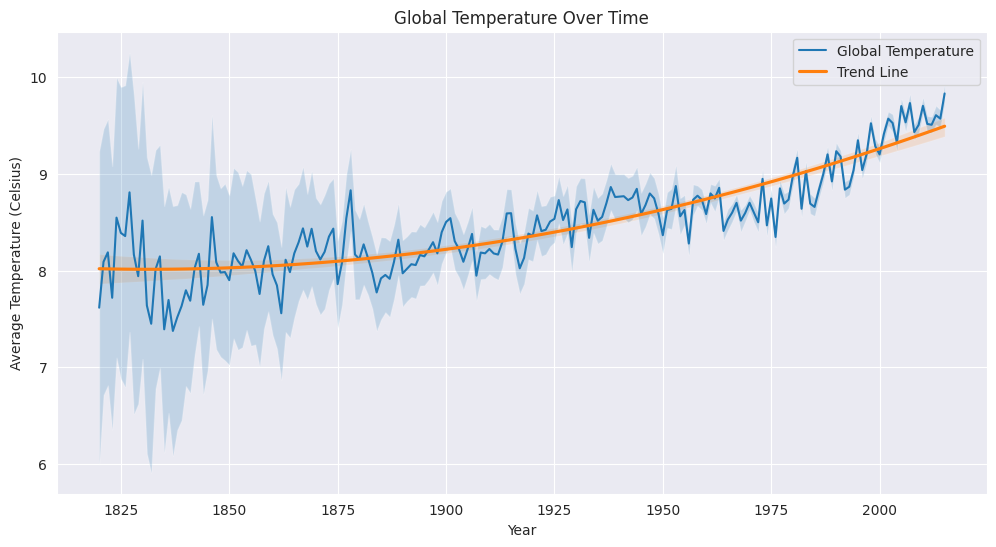

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the data to only include years from 1850 onwards
global_temps = Temps[Temps['year'] >= 1820]

# Group the data by year and calculate the mean temperature and uncertainty for each year
global_temps = global_temps.groupby('year')[['LandAverageTemperature', 'LandAverageTemperatureUncertainty']].mean().reset_index()

# Create a line plot of the global temperatures over time
sns.set_style('darkgrid')
plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y='LandAverageTemperature', data=global_temps, label='Global Temperature')

# Add a trend line to the plot using quadratic regression
sns.regplot(x='year', y='LandAverageTemperature', data=global_temps, scatter=False, label='Trend Line', order=2)

# Add the confidence interval using the LandAverageTemperatureUncertainty column
plt.fill_between(global_temps['year'], global_temps['LandAverageTemperature'] - global_temps['LandAverageTemperatureUncertainty'], global_temps['LandAverageTemperature'] + global_temps['LandAverageTemperatureUncertainty'], alpha=0.2)

# Add labels to the plot
plt.xlabel('Year')
plt.ylabel('Average Temperature (Celsius)')
plt.title('Global Temperature Over Time')

# Display the plot
plt.legend()
plt.show()


## 3.2 Global - Temperature Anomalies Over Time
This code create a scatterplot with the temperature anomaly on the y-axis and the year on the x-axis. The plot shows the temperature anomalies for each year, relative to the long-term average temperature. The plot can help identify years with unusually high or low temperatures, which may be of interest in climate analysis.

<ipython-input-32-b6ac1df0476b>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  global_temps['TemperatureAnomaly'] = global_temps['LandAverageTemperature'] - long_term_avg


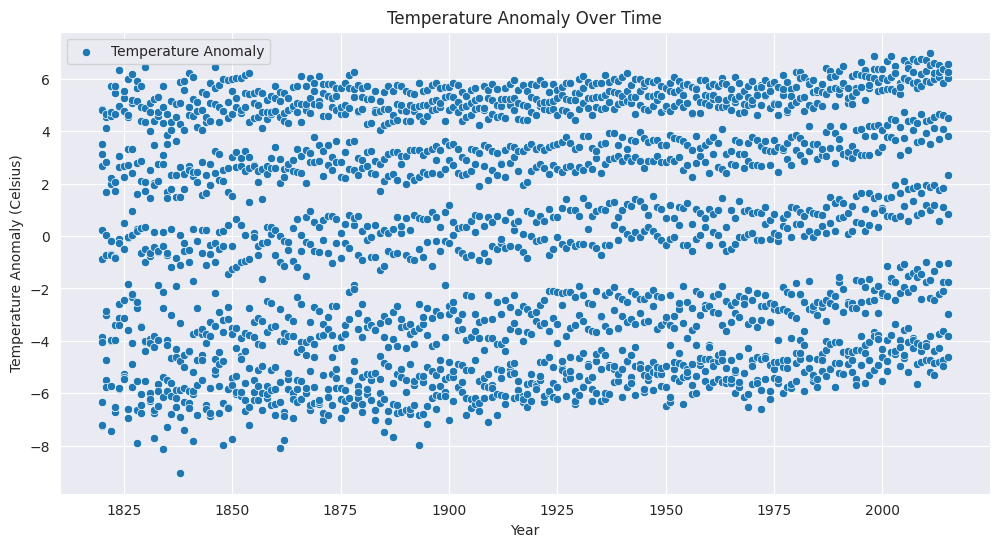

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the data to only include years from 1850 onwards
global_temps = Temps[Temps['year'] >= 1820].copy()

# Calculate the long-term average temperature
long_term_avg = global_temps['LandAverageTemperature'].mean()

# Calculate the temperature anomaly for each year
global_temps['TemperatureAnomaly'] = global_temps['LandAverageTemperature'] - long_term_avg

# Create a scatterplot of temperature anomalies over time
sns.set_style('darkgrid')
plt.figure(figsize=(12, 6))
sns.scatterplot(x='year', y='TemperatureAnomaly', data=global_temps, label='Temperature Anomaly')

# Add labels to the plot
plt.xlabel('Year')
plt.ylabel('Temperature Anomaly (Celsius)')
plt.title('Temperature Anomaly Over Time')

# Display the plot
plt.legend()
plt.show()

## 3.3 United States - Average temperature over time: Line Plot
To find the average temperature of one country, we filter the data to include only temperatures from that country, and calculate the mean temperature from each year. Below is a line plot of the country (in this case, the United States - but you're welcome to try another country!) temperature data over time.

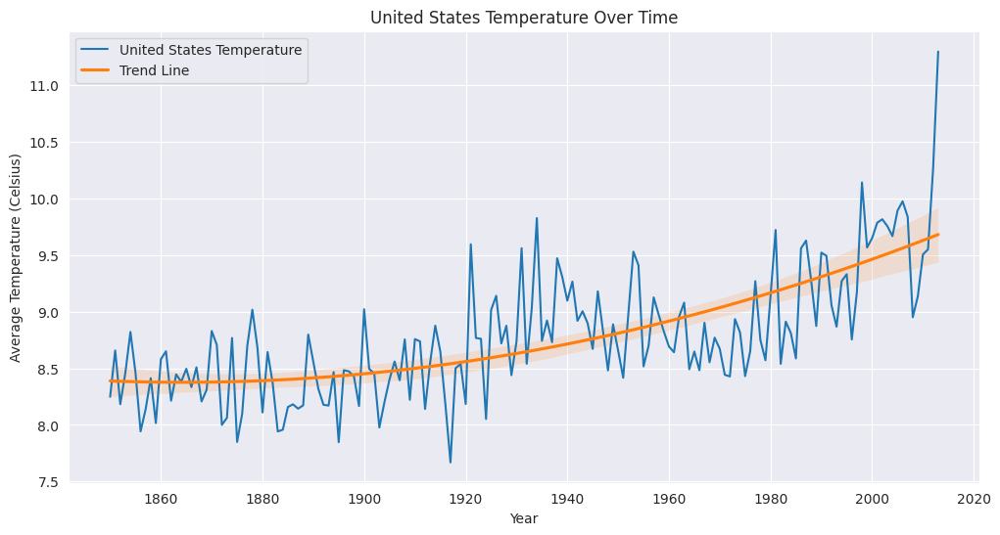

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select the country you want to plot data for
country_name = 'United States'

# Filter the data to only include temperatures in the selected country and years from 1850 onwards
country_temps = TempsByCountry[(TempsByCountry['Country'] == country_name) & (TempsByCountry['year'] >= 1850)]

# Group the data by year and calculate the mean temperature for each year
country_temps = country_temps.groupby('year')['AverageTemperature'].mean().reset_index()

# Create a line plot of the country temperatures over time
sns.set_style('darkgrid')
plt.figure(figsize=(12, 6))
plt.plot(country_temps['year'], country_temps['AverageTemperature'], label=f'{country_name} Temperature')

# Add a trend line to the plot using linear regression
sns.regplot(x='year', y='AverageTemperature', data=country_temps, scatter=False, label='Trend Line', order=2)

# Add labels to the plot
plt.xlabel('Year')
plt.ylabel('Average Temperature (Celsius)')
plt.title(f'{country_name} Temperature Over Time')

# Display the plot
plt.legend()
plt.show()


##3.4 United States - Average temperature by decade: Heatmap

This code creates a heatmap that shows the average temperature for each decade, with warmer temperatures shown in red and cooler temperatures shown in blue. The values are annotated in the heatmap, and a color bar is included to show the range of temperatures.



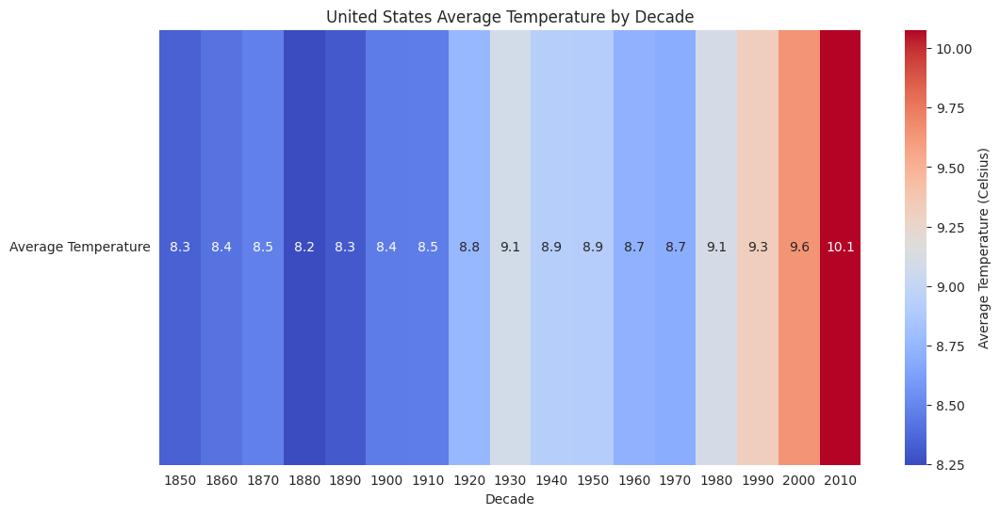

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select the country you want to plot data for
country_name = 'United States'

# Filter the data to only include temperatures in the selected country and years from 1850 onwards
country_temps = TempsByCountry[(TempsByCountry['Country'] == country_name) & (TempsByCountry['year'] >= 1850)].copy()

# Group the data by decade and calculate the mean temperature for each decade
country_temps.loc[:, 'decade'] = (country_temps['year'] // 10) * 10
decade_temps = country_temps.groupby('decade')['AverageTemperature'].mean().reset_index()

# Create a DataFrame for the heatmap
heatmap_data = pd.DataFrame(index=decade_temps['decade'], columns=['Average Temperature'])
heatmap_data['Average Temperature'] = decade_temps['AverageTemperature'].values

# Create a heatmap of average temperatures by decade
sns.set_style('darkgrid')
plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data.T, cmap='coolwarm', annot=True, fmt='.1f', cbar_kws={'label': 'Average Temperature (Celsius)'}, xticklabels=True)

# Add labels to the plot
plt.xlabel('Decade')
plt.yticks(rotation=0)
plt.title(f'{country_name} Average Temperature by Decade')

# Display the plot
plt.show()


##3.5 By individual US state - Average temperature over time: Choropleth Map
This code is creating a choropleth map using Plotly Express to display the US temperature data over time. It starts by loading a state code lookup table from a CSV file hosted on GitHub. The lookup table is then merged with the temperature data to associate each state with its temperature values.

The temperature data is filtered to only include US states and years from 1850 onwards. The filtered data is then grouped by state and year, and the mean temperature is calculated for each group.

The two-letter state codes are then added to the temperature data DataFrame by merging with the state codes lookup table. The DataFrame is renamed to replace the 'Postal' column with 'state_code'.

Finally, Plotly Express is used to create the choropleth map. The map is set to show the temperature data over time with each frame representing a different year. The color of each state is determined by its temperature value, and the state name is displayed when hovering over the state. The map is set to the 'USA-states' location mode and a 'scope' of 'usa'. The title of the map is set to 'US Temperature over Time'. The map is then displayed using the show() method.

In [ ]:
import plotly.express as px
import pandas as pd

# Load the state code lookup table
state_codes = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_usa_states.csv')

# Merge the state codes with the temperature data
us_temps = pd.merge(TempsByState, state_codes, left_on='State', right_on='State')

# Filter the data to only include years from 1850 onwards and US states
us_temps = us_temps[(us_temps['year'] >= 1850) & (us_temps['Country'] == 'United States')]

# Group the data by state and year and calculate the mean temperature for each group
us_temps = us_temps.groupby(['State', 'year'])['AverageTemperature'].mean().reset_index()

# Add the two-letter state codes to the us_temps DataFrame
us_temps = pd.merge(us_temps, state_codes[['State', 'Postal']], on='State')
us_temps = us_temps.rename(columns={'Postal': 'state_code'})

# Create a choropleth map showing the US temperature data over time
fig = px.choropleth(us_temps, 
                    locations='state_code', 
                    locationmode='USA-states', 
                    color='AverageTemperature',
                    hover_name='State', 
                    animation_frame='year',
                    scope='usa',
                    title='US Temperature over Time',
                    width=1000, height=600)

# Display the map
fig.show()


##3.6 Global: Temperature over time on 3D Interactive Globe
Below, we use choropleth and plotly to create a 3D interactive map that uses the average temperature for each year grouped by country. 

In [ ]:
import plotly.express as px

# Filter the data to only include years from 1850 onwards
yearly_temps = TempsByCountry[TempsByCountry['year'] >= 1850]

# Group the data by year and calculate the mean temperature for each year
yearly_temps = yearly_temps.groupby(['Country', 'year'])['AverageTemperature'].mean().reset_index()

# Create a 3D interactive globe showing the global temperature data over time
fig = px.choropleth(yearly_temps, 
                    locations='Country', 
                    locationmode='country names', 
                    color='AverageTemperature',
                    hover_name='Country', 
                    animation_frame='year',
                    projection='natural earth',
                    title='Global Temperature over Time',
                    width=1400, height=800)

fig.show()


In [ ]:
print("Temps")
Temps.info()
print("TempsByCountry")
TempsByCountry.info()
print("TempsByCity")
TempsByCity.info()

Temps
<class 'pandas.core.frame.DataFrame'>
Int64Index: 3156 entries, 36 to 3191
Data columns (total 12 columns):
 #   Column                                     Non-Null Count  Dtype         
---  ------                                     --------------  -----         
 0   dt                                         3156 non-null   datetime64[ns]
 1   LandAverageTemperature                     3156 non-null   float64       
 2   LandAverageTemperatureUncertainty          3156 non-null   float64       
 3   LandMaxTemperature                         1992 non-null   float64       
 4   LandMaxTemperatureUncertainty              1992 non-null   float64       
 5   LandMinTemperature                         1992 non-null   float64       
 6   LandMinTemperatureUncertainty              1992 non-null   float64       
 7   LandAndOceanAverageTemperature             1992 non-null   float64       
 8   LandAndOceanAverageTemperatureUncertainty  1992 non-null   float64       
 9   year        

Cities with highest temperature increase  

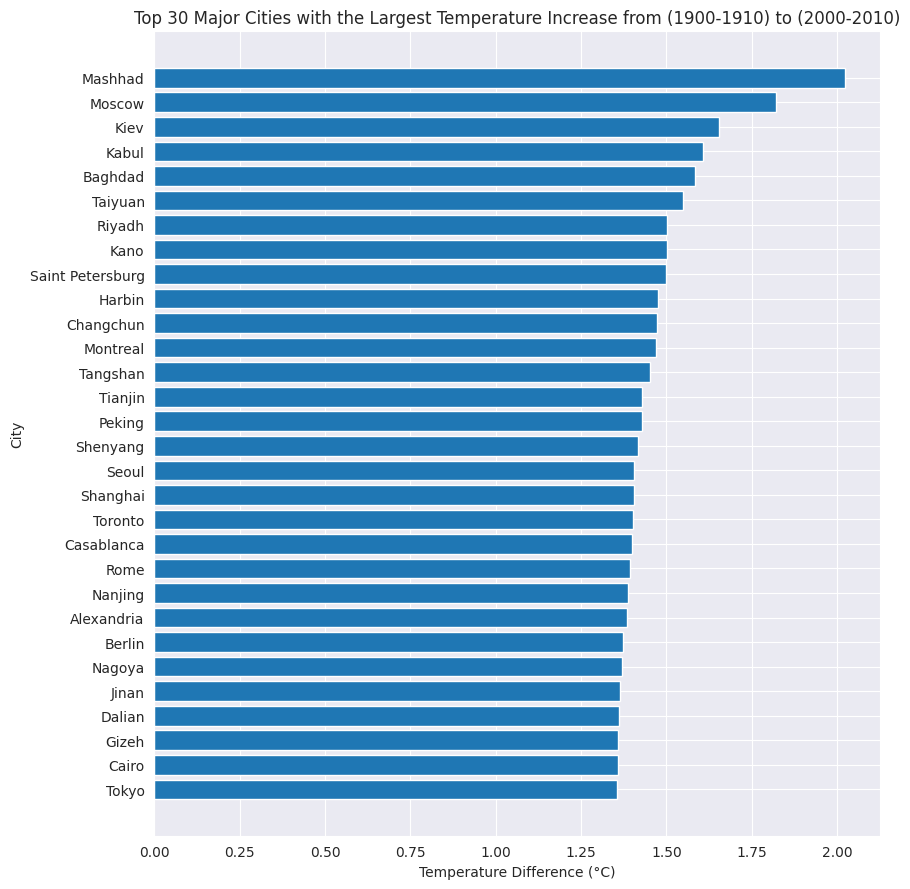

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter the data for major cities in the United States
major_cities_data = TempsByMajorCity

# Select relevant columns from the subset DataFrame
data = major_cities_data[['dt', 'year', 'City', 'AverageTemperature']]

# Drop rows with missing values
data = data.dropna()

# Filter data for the periods of interest
period_1900_1910 = (data['year'] >= 1900) & (data['year'] <= 1910)
period_2000_2010 = (data['year'] >= 2000) & (data['year'] <= 2010)

# Calculate the mean temperatures for the periods
mean_1900_1910 = data[period_1900_1910].groupby('City')['AverageTemperature'].mean()
mean_2000_2010 = data[period_2000_2010].groupby('City')['AverageTemperature'].mean()

# Calculate the temperature difference between the periods
temperature_diff = mean_2000_2010 - mean_1900_1910

# Sort the temperature differences in descending order and select the top 30 major cities
top_30_cities = temperature_diff.sort_values(ascending=False).head(30)

# Plot the chart in inverse order
plt.figure(figsize=(9, 9))
plt.barh(top_30_cities.index[::-1], top_30_cities.values[::-1])
plt.xlabel('Temperature Difference (°C)')
plt.ylabel('City')
plt.title('Top 30 Major Cities with the Largest Temperature Increase from (1900-1910) to (2000-2010)')
plt.tight_layout()
plt.show()


Cities with lowest temperature increase

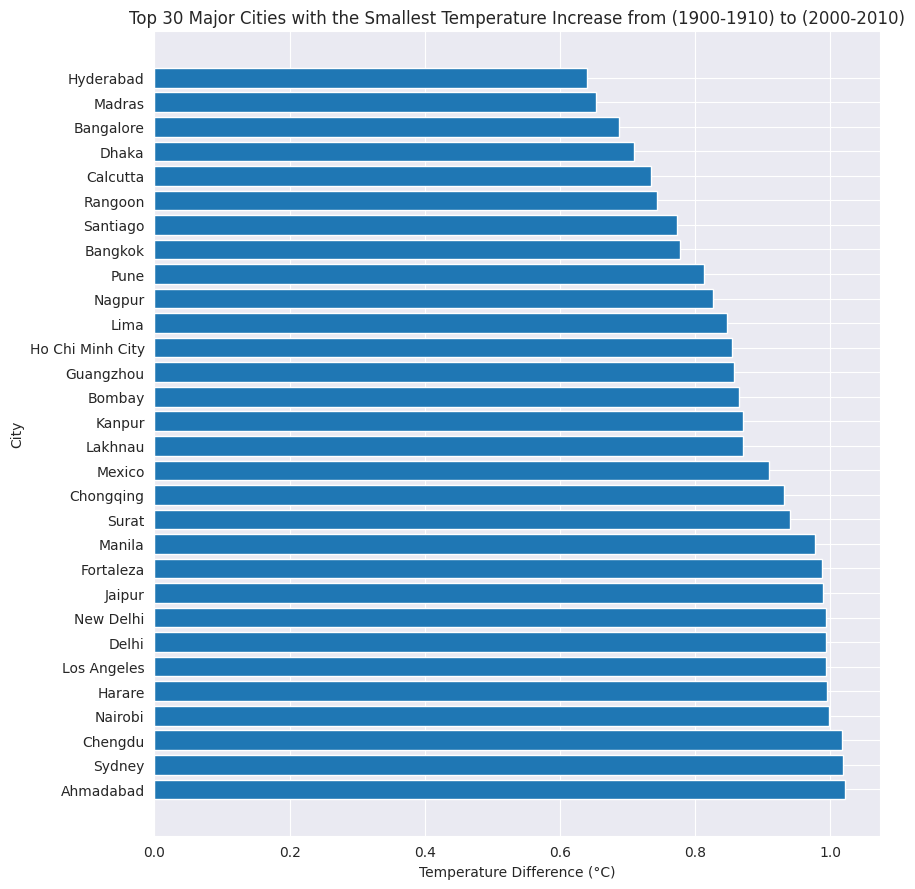

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

major_cities_data = TempsByMajorCity

# Select relevant columns from the subset DataFrame
data = major_cities_data[['dt', 'year', 'City', 'AverageTemperature']]

# Drop rows with missing values
data = data.dropna()

# Filter data for the periods of interest
period_1900_1910 = (data['year'] >= 1900) & (data['year'] <= 1910)
period_2000_2010 = (data['year'] >= 2000) & (data['year'] <= 2010)

# Calculate the mean temperatures for the periods
mean_1900_1910 = data[period_1900_1910].groupby('City')['AverageTemperature'].mean()
mean_2000_2010 = data[period_2000_2010].groupby('City')['AverageTemperature'].mean()

# Calculate the temperature difference between the periods
temperature_diff = mean_2000_2010 - mean_1900_1910

# Sort the temperature differences in ascending order and select the top 50 major cities
top_30_cities = temperature_diff.sort_values().head(30)

# Plot the chart
plt.figure(figsize=(9, 9))
plt.barh(top_30_cities.index[::-1], top_30_cities.values[::-1])
plt.xlabel('Temperature Difference (°C)')
plt.ylabel('City')
plt.title('Top 30 Major Cities with the Smallest Temperature Increase from (1900-1910) to (2000-2010)')
plt.tight_layout()
plt.show()


# 4. Prediction

In this section, we will attempt to predict future trends based on current data. In quality projects, it often takes a few iterations to find the correct model. In our project, we want to demonstrate the **process** which our team undertook to find the right model. As such, we will show the models that we tried, and did not work. But we learn from each model that failed in order to iterate towards finding the most suitable mode.

## 4.1 Predicting Global Temperature

### 4.1.1 ARIMA prediction for global temperature 
The given code demonstrates the use of ARIMA model from the statsmodels package to predict temperature data. Then, mean squared error (MSE) is calculated to evaluate the model. 

ARIMA does not work because we have seasonal data.

Empty DataFrame
Columns: [dt, LandAverageTemperature]
Index: []


/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



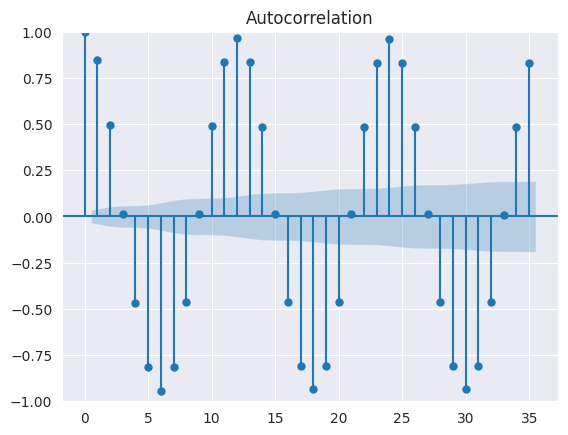

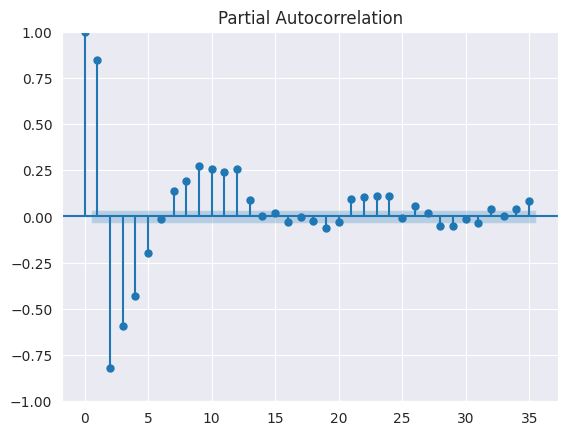

Mean Squared Error: 40.70307145163456


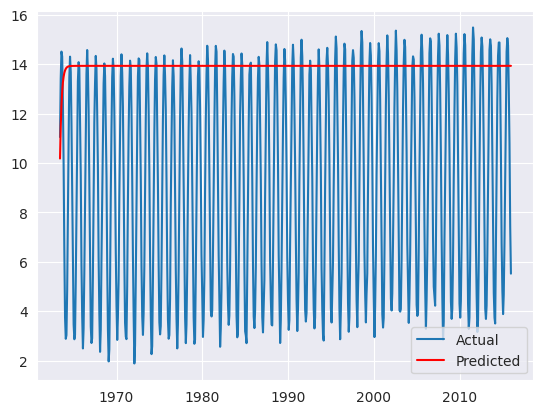

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error

# Assuming you have already read the data into a DataFrame called 'Temps'
data = Temps[['dt', 'LandAverageTemperature']]

# create boolean mask for missing data
missing_mask = data['LandAverageTemperature'].isnull()

# index DataFrame using mask to return rows with missing data
missing_data = data[missing_mask]

# print missing data
print(missing_data)


# Drop missing values
data = data.dropna()

# Set 'dt' as the index and resample to monthly data
data.set_index('dt', inplace=True)
data = data.resample('M').mean()

# Determine the optimal parameters for ARIMA using ACF and PACF plots
plot_acf(data)
plot_pacf(data)
plt.show()

# Set the optimal parameters for the ARIMA model (p, d, q)
p = 1
d = 1
q = 0

# Split the data into training and testing sets
train_data = data[:int(0.8*len(data))]
test_data = data[int(0.8*len(data)):]

# Fit the ARIMA model to the data
model = ARIMA(train_data, order=(p, d, q))
model_fit = model.fit()

# Make predictions
predictions = model_fit.forecast(steps=len(test_data))

# Calculate the mean squared error
mse = mean_squared_error(test_data, predictions)
print(f'Mean Squared Error: {mse}')

# Visualize the results
plt.plot(test_data, label='Actual')
plt.plot(predictions, label='Predicted', color='r')
plt.legend()
plt.show()


### 4.1.2 Seasonal ARIMA prediction for global temperature

Next, we try Seasonal ARIMA. The model is a SARIMA model with the optimal parameters chosen for the given dataset. The model is fit on the training data, and predictions are made on the test data. The mean squared error (MSE) is calculated between the actual and predicted values, and the results are visualized in a plot.

Mean Squared Error: 0.18571505772862026


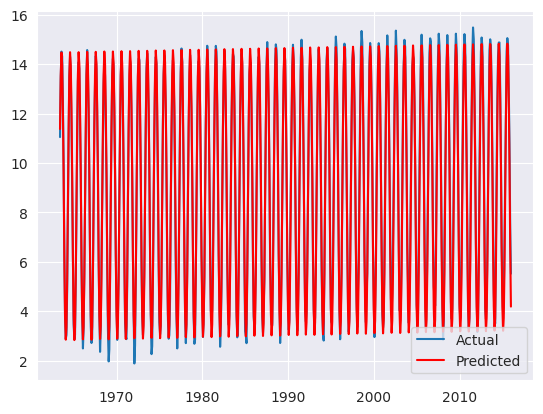

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error

# Assuming you have already read the data into a DataFrame called 'Temps'
data = Temps[['dt', 'LandAverageTemperature']]

# Drop missing values
data = data.dropna()

# Set 'dt' as the index and resample to monthly data
data.set_index('dt', inplace=True)
data = data.resample('M').mean()

# Set the optimal parameters for the SARIMA model (p, d, q) and seasonal parameters (P, D, Q, s)
# parameters from previous auto arima runs
p, d, q = 0, 1, 1
P, D, Q, s = 2, 0, 2, 12

# Split the data into training and testing sets
train_data = data[:int(0.8*len(data))]
test_data = data[int(0.8*len(data)):]

# Fit the SARIMA model to the data
model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, s))
model_fit = model.fit()

# Make predictions
predictions = model_fit.forecast(steps=len(test_data))

# Calculate the mean squared error
mse = mean_squared_error(test_data, predictions)
print(f'Mean Squared Error: {mse}')

# Visualize the results
plt.plot(test_data, label='Actual')
plt.plot(predictions, label='Predicted', color='r')
plt.legend()
plt.show()


In [ ]:
import pmdarima as pm

# Fit auto_arima model
auto_model = pm.auto_arima(train_data,
                           seasonal=True,
                           m=12,  # Seasonal period, set to 12 for monthly data
                           suppress_warnings=True,
                           stepwise=True,  # Enable stepwise search for faster computation
                           trace=True)  # Display the search process

# Print the best parameters
print(auto_model.summary())

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=6477.099, Time=16.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=11701.796, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=1.46 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=10056.580, Time=1.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=11699.799, Time=0.08 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=7290.637, Time=8.81 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=inf, Time=10.57 sec
 ARIMA(2,1,2)(2,0,1)[12] intercept   : AIC=inf, Time=44.86 sec
 ARIMA(2,1,2)(1,0,2)[12] intercept   : AIC=6897.659, Time=28.33 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=7291.520, Time=7.28 sec
 ARIMA(2,1,2)(0,0,2)[12] intercept   : AIC=7263.727, Time=24.94 sec
 ARIMA(2,1,2)(2,0,0)[12] intercept   : AIC=inf, Time=23.10 sec
 ARIMA(2,1,2)(2,0,2)[12] intercept   : AIC=6521.786, Time=34.28 sec
 ARIMA(1,1,2)(1,0,1)[12] intercept   : AIC=6628.012, Time=9.11 sec
 ARIMA(2,1,1)(1,0,1)[12] inte

2 1 2
1 0 1 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Mean Squared Error: 0.3163179990548501


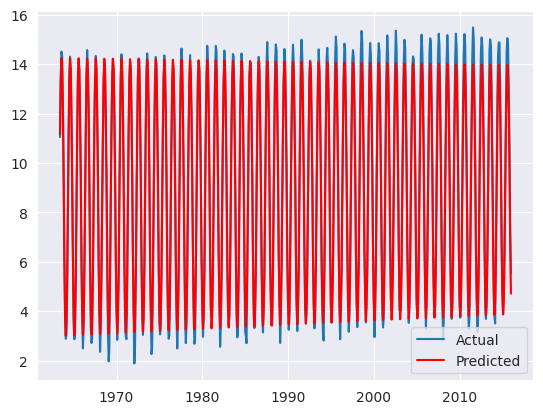

In [ ]:
# Get the SARIMA orders from the auto_arima model
p, d, q = auto_model.order
P, D, Q, s = auto_model.seasonal_order
print(p, d, q)
print(P, D, Q, s)

# Fit the SARIMA model to the data
model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, s))
model_fit = model.fit()

# Make predictions
predictions = model_fit.forecast(steps=len(test_data))

# Calculate the mean squared error
mse = mean_squared_error(test_data, predictions)
print(f'Mean Squared Error: {mse}')

# Visualize the results
plt.plot(test_data, label='Actual')
plt.plot(predictions, label='Predicted', color='r')
plt.legend()
plt.show()

###4.1.3 Box-Cox Transformation SARIMA

The Box-Cox Transformation is beneficial for seasonal weather temperature data because it helps stabilize seasonal variation, handle heteroscedasticity, normalize the distribution, and enhance forecast accuracy. It achieves these improvements by making seasonal patterns more consistent, stabilizing the variance, approximating a normal distribution, and aligning with the assumptions of the SARIMA model. By doing so, it improves the accuracy of forecasts for future time periods. However, the effectiveness of the transformation depends on the specific data characteristics and patterns.

Mean Squared Error: 0.1732637500979199


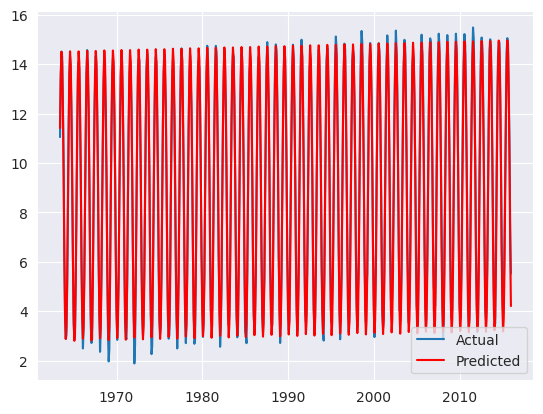

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
from scipy.stats import boxcox
from scipy.special import inv_boxcox

# Assuming you have already read the data into a DataFrame called 'Temps'
data = Temps[['dt', 'LandAverageTemperature']]

# Drop missing values
data = data.dropna()

# Set 'dt' as the index and resample to monthly data
data.set_index('dt', inplace=True)
data = data.resample('M').mean()

# Split the data into training and testing sets
train_data = data[:int(0.8*len(data))]
test_data = data[int(0.8*len(data)):]

# positive adjustment
k = abs(train_data['LandAverageTemperature'].min()) + 0.1

# Apply Box-Cox transformation to the training data
train_data_bc, bc_lambda = boxcox(train_data['LandAverageTemperature'] + k)

# Set the optimal parameters for the SARIMA model (p, d, q) and seasonal parameters (P, D, Q, s)
# parameters from auto arima below
p, d, q = 0, 1, 1
P, D, Q, s = 2, 0, 2, 12

# Fit the SARIMA model to the data
model = SARIMAX(train_data_bc, order=(p, d, q), seasonal_order=(P, D, Q, s))
model_fit = model.fit()

# Make predictions on the transformed data
predictions_bc = model_fit.forecast(steps=len(test_data))

# Reverse the Box-Cox transformation for the predictions
predictions = inv_boxcox(predictions_bc, bc_lambda) - k

# Calculate the mean squared error
mse = mean_squared_error(test_data, predictions)
print(f'Mean Squared Error: {mse}')

# Visualize the results
plt.plot(test_data, label='Actual')
plt.plot(test_data.index, predictions, label='Predicted', color='r')
plt.legend()
plt.show()


##4.4 Predicting Temperature of Major Cities

###4.4.1 Define three loss functions 
In the below Custom Loss functions, we define three functions as subclasses of the PyTorch nn.Module class.

The first loss function, RMSELoss, calculates the root mean squared error between the predicted and target values. It first calculates the mean squared error (MSE) using the PyTorch nn.MSELoss() function and then takes the square root of the MSE to obtain the RMSE. 

The second loss function, SMAPELoss, calculates the symmetric mean absolute percentage error between the predicted and target values.It first calculates the absolute difference between the predicted and target values using the PyTorch torch.abs() function. Then, it calculates the sum of the absolute values of the predicted and target values plus a small epsilon value (1e-7) to avoid division by zero. It then calculates the mean of the absolute differences divided by the sum of the absolute values and multiplies the result by 2 to obtain the symmetric mean absolute percentage error. 

The third loss function, MeanCubicError, calculates the mean cubic error between the predicted and target values. It first calculates the cubic error between the predicted and target values using the PyTorch torch.pow() function. It then takes the absolute value of the cubic error and calculates the mean of the absolute values. 

In [ ]:
import torch.nn as nn

class RMSELoss(nn.Module):
    def __init__(self):
        super(RMSELoss, self).__init__()

    def forward(self, predicted, target):
        mse = nn.MSELoss()(predicted, target)
        rmse = torch.sqrt(mse)
        return rmse

class SMAPELoss(nn.Module):
    def __init__(self):
        super(SMAPELoss, self).__init__()

    def forward(self, predicted, target):
        epsilon = 1e-7  # small value to avoid division by zero
        absolute_diff = torch.abs(predicted - target)
        sum_values = torch.abs(predicted) + torch.abs(target) + epsilon
        smape = 2.0 * torch.mean(absolute_diff / sum_values)
        return smape

class MeanCubicError(nn.Module):
    def __init__(self):
        super(MeanCubicError, self).__init__()

    def forward(self, predicted, target):
        error = torch.pow(predicted - target, 3)
        loss = torch.mean(torch.abs(error))
        return loss


###4.4.2 Train and evaluate
In the code below, the train function takes the model, train_loader, criterion (loss function), optimizer, and device as input. It sets the model to training mode, iterates through each batch in the train_loader, zeros out the optimizer gradients, and performs a forward pass to calculate the outputs and loss. It then performs a backward pass to compute the gradients, updates the optimizer, and accumulates the loss. Finally, it returns the average loss per sample in the dataset.

The evaluate function takes the model, test_loader, criterion, and device as input. It sets the model to evaluation mode, iterates through each batch in the test_loader, performs a forward pass to calculate the outputs and loss, and accumulates the loss. 

In [ ]:
# Training function
def train(model, train_loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    for X, y in train_loader:
        X, y = X.to(device), y.to(device)

        # Zero the gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(X)
        loss = criterion(outputs, y.view(-1, 1))

        # Backward pass
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * X.size(0)
    return running_loss / len(train_loader.dataset)

# Evaluation function
def evaluate(model, test_loader, criterion, device):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for X, y in test_loader:
            X, y = X.to(device), y.to(device)

            outputs = model(X)
            loss = criterion(outputs, y.view(-1, 1))

            running_loss += loss.item() * X.size(0)
    return running_loss / len(test_loader.dataset)

###4.4.3 Map and evaluate functions
In the code below, we use the function 'get_s2_cells' to define map latitude and longitude coordinates to the S2 cells which are used to divide the surface of the earth into regions. Next, we process and remove missing values and restrict the data, calculating the mean and standard deviation. The lat and long values are converted into direction indicators, with N and E represented by 1 and S and W represented by 0. We use LabelEncoder to transform the 'City' variable into numerical values, and apply MinMaxScalar to normalize them. We sort the data by city and date, and display the list of the first 20 unique city names. 

In [ ]:
import pandas as pd
import numpy as np
import s2sphere
from sklearn.preprocessing import LabelEncoder, MinMaxScaler

# Map latitude and longitude to S2 cells
def get_s2_cells(latitude, longitude, levels):
    tokens = []
    for level in levels:
        cell = s2sphere.CellId.from_lat_lng(s2sphere.LatLng.from_degrees(latitude, longitude))
        parent_cell = cell.parent(level)
        token = parent_cell.to_token()
        tokens.append(int(token, 16))
    return tokens

processed_data = TempsByMajorCity[['dt', 'year', 'month', 'Country', 'Latitude', 'Longitude', 'AverageTemperature', 'City']].dropna().loc[TempsByMajorCity['year'] >= 1900]

# Calculate the mean and standard deviation of the temperatures
mean_temp = processed_data['AverageTemperature'].mean()
std_temp = processed_data['AverageTemperature'].std()

print("Mean temperature:", mean_temp)
print("Standard deviation of temperature:", std_temp)

# Extract direction indicators
processed_data.loc[:, 'Latitude_Direction'] = np.where(processed_data['Latitude'].str.contains('N'), 1, 0)
processed_data.loc[:, 'Longitude_Direction'] = np.where(processed_data['Longitude'].str.contains('E'), 1, 0)

processed_data.loc[:, 'Latitude_Signed'] = processed_data['Latitude'].apply(lambda x: -float(x[:-1]) if x.endswith('S') else float(x[:-1]))
processed_data.loc[:, 'Longitude_Signed'] = processed_data['Longitude'].apply(lambda x: -float(x[:-1]) if x.endswith('W') else float(x[:-1]))

# Clean 'Latitude' and 'Longitude' columns
processed_data['Latitude_Value'] = processed_data['Latitude'].str.replace('N', '').str.replace('S', '')
processed_data['Longitude_Value'] = processed_data['Longitude'].str.replace('E', '').str.replace('W', '')

# Group data by city and calculate S2 cells for each city
grouped_cities = processed_data.groupby('City').first().reset_index()

# Define the levels for each S2 cell
cell_levels = list(range(7))

# Create new columns for S2 cells
for i in range(7):
    grouped_cities[f'S2_Cell_{i}'] = np.nan

# Fill S2 cell values for each city
for idx, row in grouped_cities.iterrows():
    tokens = get_s2_cells(row['Latitude_Signed'], row['Longitude_Signed'], cell_levels)
    for i, token in enumerate(tokens):
        grouped_cities.at[idx, f'S2_Cell_{i}'] = token

# Merge the S2 cell values back to the original data
processed_data = pd.merge(processed_data, grouped_cities[['City'] + [f'S2_Cell_{i}' for i in range(7)]], on='City', how='left')

# Create an instance of LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the "City" variable
processed_data.loc[:, 'City_Encoded'] = label_encoder.fit_transform(processed_data['City'])

# Normalize numerical variables
scaler = MinMaxScaler()
processed_data[['year', 'month', 'City_Encoded', 'Latitude_Direction', 'Longitude_Direction', 'Latitude_Value', 'Longitude_Value', 'S2_Cell_0', 'S2_Cell_1', 'S2_Cell_2', 'S2_Cell_3', 'S2_Cell_4', 'S2_Cell_5', 'S2_Cell_6', 'AverageTemperature']] = scaler.fit_transform(processed_data[['year', 'month', 'City_Encoded', 'Latitude_Direction', 'Longitude_Direction', 'Latitude_Value', 'Longitude_Value', 'S2_Cell_0', 'S2_Cell_1', 'S2_Cell_2', 'S2_Cell_3', 'S2_Cell_4', 'S2_Cell_5', 'S2_Cell_6', 'AverageTemperature']])

# Sort data by city, date
processed_data = processed_data.sort_values(by=['City', 'dt'])

# Count the number of unique cities
unique_cities = processed_data['City'].nunique()
print("Number of unique cities:", unique_cities)
print(processed_data['City'].unique())
display(processed_data.head(20))

Mean temperature: 19.01292419743855
Standard deviation of temperature: 9.658290600710512
Number of unique cities: 100
['Abidjan' 'Addis Abeba' 'Ahmadabad' 'Aleppo' 'Alexandria' 'Ankara'
 'Baghdad' 'Bangalore' 'Bangkok' 'Belo Horizonte' 'Berlin' 'Bogotá'
 'Bombay' 'Brasília' 'Cairo' 'Calcutta' 'Cali' 'Cape Town' 'Casablanca'
 'Changchun' 'Chengdu' 'Chicago' 'Chongqing' 'Dakar' 'Dalian'
 'Dar Es Salaam' 'Delhi' 'Dhaka' 'Durban' 'Faisalabad' 'Fortaleza' 'Gizeh'
 'Guangzhou' 'Harare' 'Harbin' 'Ho Chi Minh City' 'Hyderabad' 'Ibadan'
 'Istanbul' 'Izmir' 'Jaipur' 'Jakarta' 'Jiddah' 'Jinan' 'Kabul' 'Kano'
 'Kanpur' 'Karachi' 'Kiev' 'Kinshasa' 'Lagos' 'Lahore' 'Lakhnau' 'Lima'
 'London' 'Los Angeles' 'Luanda' 'Madras' 'Madrid' 'Manila' 'Mashhad'
 'Melbourne' 'Mexico' 'Mogadishu' 'Montreal' 'Moscow' 'Nagoya' 'Nagpur'
 'Nairobi' 'Nanjing' 'New Delhi' 'New York' 'Paris' 'Peking' 'Pune'
 'Rangoon' 'Rio De Janeiro' 'Riyadh' 'Rome' 'Saint Petersburg' 'Salvador'
 'Santiago' 'Santo Domingo' 'Seoul' 'Sh

,dt,year,month,Country,Latitude,Longitude,AverageTemperature,City,Latitude_Direction,Longitude_Direction,...,Latitude_Value,Longitude_Value,S2_Cell_0,S2_Cell_1,S2_Cell_2,S2_Cell_3,S2_Cell_4,S2_Cell_5,S2_Cell_6,City_Encoded
0,1900-01-01,0.00000,0.000000,Côte D'Ivoire,5.63N,3.23W,0.806518,Abidjan,1.0,0.0,...,0.081217,0.021281,0.0,0.055556,0.093333,0.100334,0.101751,0.101126,0.101121,0.0
1,1900-02-01,0.00000,0.090909,Côte D'Ivoire,5.63N,3.23W,0.839105,Abidjan,1.0,0.0,...,0.081217,0.021281,0.0,0.055556,0.093333,0.100334,0.101751,0.101126,0.101121,0.0
2,1900-03-01,0.00000,0.181818,Côte D'Ivoire,5.63N,3.23W,0.848006,Abidjan,1.0,0.0,...,0.081217,0.021281,0.0,0.055556,0.093333,0.100334,0.101751,0.101126,0.101121,0.0
3,1900-04-01,0.00000,0.272727,Côte D'Ivoire,5.63N,3.23W,0.837414,Abidjan,1.0,0.0,...,0.081217,0.021281,0.0,0.055556,0.093333,0.100334,0.101751,0.101126,0.101121,0.0
4,1900-05-01,0.00000,0.363636,Côte D'Ivoire,5.63N,3.23W,0.822765,Abidjan,1.0,0.0,...,0.081217,0.021281,0.0,0.055556,0.093333,0.100334,0.101751,0.101126,0.101121,0.0
5,1900-06-01,0.00000,0.454545,Côte D'Ivoire,5.63N,3.23W,0.798586,Abidjan,1.0,0.0,...,0.081217,0.021281,0.0,0.055556,0.093333,0.100334,0.101751,0.101126,0.101121,0.0
6,1900-07-01,0.00000,0.545455,Côte D'Ivoire,5.63N,3.23W,0.783399,Abidjan,1.0,0.0,...,0.081217,0.021281,0.0,0.055556,0.093333,0.100334,0.101751,0.101126,0.101121,0.0
7,1900-08-01,0.00000,0.636364,Côte D'Ivoire,5.63N,3.23W,0.772346,Abidjan,1.0,0.0,...,0.081217,0.021281,0.0,0.055556,0.093333,0.100334,0.101751,0.101126,0.101121,0.0
8,1900-09-01,0.00000,0.727273,Côte D'Ivoire,5.63N,3.23W,0.797771,Abidjan,1.0,0.0,...,0.081217,0.021281,0.0,0.055556,0.093333,0.100334,0.101751,0.101126,0.101121,0.0
9,1900-10-01,0.00000,0.818182,Côte D'Ivoire,5.63N,3.23W,0.810606,Abidjan,1.0,0.0,...,0.081217,0.021281,0.0,0.055556,0.093333,0.100334,0.101751,0.101126,0.101121,0.0


###4.4.4 Recurrent Neural Network (RNN)
The code below consists of functions to plot the actual and predicted temperatures for a particular city, calculate the Mean Squared Error (MSE) between the actual and predicted temperatures, and denormalize the predicted temperatures to their original scale. Additionally, we use Recurrent Neural Network (RNN) models that deal with sequences of temperature data.
The plot_predictions and plot_actual_predictions functions take the city name, the trained model, the testing dataset, and the device on which the computation is being performed as input arguments. These functions first extract the temperature data for the given city from the testing dataset and create a PyTorch DataLoader object. Then, the actual and predicted temperatures are computed using the get_predictions function, which takes the model, the DataLoader object, and the device as input arguments. Finally, the actual and predicted temperatures are plotted on a graph using Matplotlib, and the MSE is calculated and printed. The plot_actual_predictions function additionally denormalizes the predicted and actual temperatures before plotting them.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from sklearn.metrics import mean_squared_error
from torch.utils.data import DataLoader

def plot_predictions(city, model, test_df, device):
    city_test_df = test_df[test_df['City'] == city]
    city_test_dataset = TemperatureDataset(city_test_df)
    city_test_loader = DataLoader(city_test_dataset, batch_size=128, shuffle=False)

    def get_predictions(model, data_loader, device):
        model.eval()
        predictions = []
        with torch.no_grad():
            for X, _ in data_loader:
                X = X.to(device)
                outputs = model(X)
                predictions.extend(outputs.view(-1).cpu().numpy())
        return np.array(predictions)

    city_predictions = get_predictions(model, city_test_loader, device)
    city_actual_temps = city_test_df['AverageTemperature'].values

    # Create a time axis for the plot
    time_axis = pd.to_datetime(city_test_df['dt']).values

    plt.figure(figsize=(12, 6))
    plt.plot(time_axis, city_actual_temps, label='Actual Temperature')
    plt.plot(time_axis, city_predictions, label='Predicted Temperature')
    plt.xlabel('Time')
    plt.ylabel('Normalized Temperature')
    plt.title(f'{city}: Predicted vs. Actual Temperature')
    plt.legend()
    plt.show()

    mse = mean_squared_error(city_actual_temps, city_predictions)
    print(f"Mean Squared Error (MSE) for {city}: {mse:.4f}")

def plot_actual_predictions(city, model, test_df, device):
    city_test_df = test_df[test_df['City'] == city]
    city_test_dataset = TemperatureDataset(city_test_df)
    city_test_loader = DataLoader(city_test_dataset, batch_size=128, shuffle=False)

    def get_denormalized_predictions(model, data_loader, device, mean, std):
        model.eval()
        predictions = []
        with torch.no_grad():
            for X, _ in data_loader:
                X = X.to(device)
                outputs = model(X)
                denormalized_outputs = (outputs.view(-1).cpu().numpy() * std) + mean
                predictions.extend(denormalized_outputs)
        return np.array(predictions)

    city_predictions = get_denormalized_predictions(model, city_test_loader, device, mean_temp, std_temp)
    
    # Denormalize the actual temperatures
    city_actual_temps = (city_test_df['AverageTemperature'].values * std_temp) + mean_temp

    # Create a time axis for the plot
    time_axis = pd.to_datetime(city_test_df['dt']).values

    plt.figure(figsize=(12, 6))
    plt.plot(time_axis, city_actual_temps, label='Actual Temperature')
    plt.plot(time_axis, city_predictions, label='Predicted Temperature')
    plt.xlabel('Time')
    plt.ylabel('Temperature')
    plt.title(f'{city}: Predicted vs. Actual Temperature')
    plt.legend()
    plt.show()

    mse = mean_squared_error(city_actual_temps, city_predictions)
    print(f"Mean Squared Error (MSE) for {city}: {mse:.4f}")


def plot_predictions_rnn(city, model, test_df, device, sequence_length):
    city_test_df = test_df[test_df['City'] == city]
    city_test_dataset = TemperatureDataset(city_test_df, sequence_length)
    city_test_loader = DataLoader(city_test_dataset, batch_size=128, shuffle=False)

    def get_predictions(model, data_loader, device):
        model.eval()
        predictions = []
        with torch.no_grad():
            for X, _ in data_loader:
                X = X.to(device)
                outputs = model(X)
                predictions.extend(outputs.view(-1).cpu().numpy())
        return np.array(predictions)

    city_predictions = get_predictions(model, city_test_loader, device)
    city_actual_temps = city_test_df['AverageTemperature'].iloc[sequence_length:].values

    # Create a time axis for the plot
    time_axis = pd.to_datetime(city_test_df['dt']).iloc[sequence_length:].values

    plt.figure(figsize=(12, 6))
    plt.plot(time_axis, city_actual_temps, label='Actual Temperature')
    plt.plot(time_axis, city_predictions, label='Predicted Temperature')
    plt.xlabel('Time')
    plt.ylabel('Normalized Temperature')
    plt.title(f'{city}: Predicted vs. Actual Temperature')
    plt.legend()
    plt.show()

    mse = mean_squared_error(city_actual_temps, city_predictions)
    print(f"Mean Squared Error (MSE) for {city}: {mse:.4f}")

def plot_actual_predictions_rnn(city, model, test_df, device, sequence_length):
    city_test_df = test_df[test_df['City'] == city]
    city_test_dataset = TemperatureDataset(city_test_df, sequence_length)
    city_test_loader = DataLoader(city_test_dataset, batch_size=128, shuffle=False)

    def get_predictions(model, data_loader, device):
        model.eval()
        predictions = []
        with torch.no_grad():
            for X, _ in data_loader:
                X = X.to(device)
                outputs = model(X)
                predictions.extend(outputs.view(-1).cpu().numpy())
        return np.array(predictions)

    city_predictions_normalized = get_predictions(model, city_test_loader, device)

    # Denormalize the predicted temperatures
    city_predictions = city_predictions_normalized * std_temp + mean_temp
    
    # Denormalize the actual temperatures
    city_actual_temps_normalized = city_test_df['AverageTemperature'].iloc[sequence_length:].values
    city_actual_temps = city_actual_temps_normalized * std_temp + mean_temp

    # Create a time axis for the plot
    time_axis = pd.to_datetime(city_test_df['dt']).iloc[sequence_length:].values

    plt.figure(figsize=(12, 6))
    plt.plot(time_axis, city_actual_temps, label='Actual Temperature')
    plt.plot(time_axis, city_predictions, label='Predicted Temperature')
    plt.xlabel('Time')
    plt.ylabel('Temperature')
    plt.title(f'{city}: Predicted vs. Actual Temperature')
    plt.legend()
    plt.show()

    mse = mean_squared_error(city_actual_temps, city_predictions)
    print(f"Mean Squared Error (MSE) for {city}: {mse:.4f}")


plt_cities = ['Singapore', 'Tokyo', 'London', 'New York', 'São Paulo', 'Bangalore', 'Shanghai', 'Baghdad', 'Sydney']

Import Shared Lib

In [ ]:
import torch.optim as optim
from torch.utils.data import Dataset

##4.5 Additional Neural Network Models 

###4.5.1 Feedforward Neural Network (V1)- Latitude and Longitude with Direction

In the code below, we prepare our dataset of temperature values to be used to train a V1 Feedforward neural network model to predict the average temperature. The data is first split into training and testing sets based on time, where the training data includes temperature values before 2000 and the testing data includes temperature values after 2000. Then, a custom PyTorch dataset class, TemperatureDataset, is defined, which takes in a Pandas DataFrame and extracts specific columns that are relevant for training the model, such as year, month, latitude, longitude, and average temperature. 

The TemperatureDataset class also converts the data to NumPy arrays and PyTorch tensors, which can be processed by the neural network.
After the dataset is prepared, a neural network model, TemperatureNet, is defined using the PyTorch nn.Module class. The neural network consists of five fully connected layers, each with a different number of units, and uses the ReLU activation function. The model is then initialized and the loss function and optimizer are defined. 

The model is then trained using the training dataset with a batch size of 128 and a learning rate of 0.001. The training loop runs for 20 epochs and prints out the train and test losses for each epoch. The results of the training process are stored in train_losses and test_losses lists for later analysis.

In [ ]:
data = processed_data.copy()

# Split data into train and test sets based on time
split_date = pd.to_datetime('2000-01-01')
train_df = data[data['dt'] < split_date]
test_df = data[data['dt'] >= split_date]

class TemperatureDataset(Dataset):
    def __init__(self, dataframe):
        self.dataframe = dataframe[['year', 'month', 'Latitude_Value', 'Longitude_Value', 'Latitude_Direction', 'Longitude_Direction', 'AverageTemperature']].values.astype(np.float32)

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        features = self.dataframe[idx, :-1]
        target = self.dataframe[idx, -1]
        X = torch.tensor(features, dtype=torch.float)
        y = torch.tensor(target, dtype=torch.float)
        return X, y


# Create datasets and dataloaders
train_dataset = TemperatureDataset(train_df)
test_dataset = TemperatureDataset(test_df)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

# Define neural network
class TemperatureNet(nn.Module):
    def __init__(self):
        super(TemperatureNet, self).__init__()
        self.layer1 = nn.Linear(6, 12)
        self.layer2 = nn.Linear(12, 24)
        self.layer3 = nn.Linear(24, 48)
        self.layer4 = nn.Linear(48, 24)
        self.layer5 = nn.Linear(24, 1)

    def forward(self, x):
        x = torch.relu(self.layer1(x))
        x = torch.relu(self.layer2(x))
        x = torch.relu(self.layer3(x))
        x = torch.relu(self.layer4(x))
        x = self.layer5(x)
        return x

# Initialize the model, loss function, and optimizer
model = TemperatureNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Train and evaluate the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device.type)
model = model.to(device)

n_epochs = 20
train_losses, test_losses = [], []

for epoch in range(n_epochs):
    train_loss = train(model, train_loader, criterion, optimizer, device)
    test_loss = evaluate(model, test_loader, criterion, device)

    train_losses.append(train_loss)
    test_losses.append(test_loss)

    print(f"Epoch: {epoch + 1}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}")


cuda
Epoch: 1, Train Loss: 0.0198, Test Loss: 0.0036
Epoch: 2, Train Loss: 0.0029, Test Loss: 0.0028
Epoch: 3, Train Loss: 0.0025, Test Loss: 0.0024
Epoch: 4, Train Loss: 0.0023, Test Loss: 0.0024
Epoch: 5, Train Loss: 0.0021, Test Loss: 0.0021
Epoch: 6, Train Loss: 0.0019, Test Loss: 0.0020
Epoch: 7, Train Loss: 0.0018, Test Loss: 0.0019
Epoch: 8, Train Loss: 0.0017, Test Loss: 0.0017
Epoch: 9, Train Loss: 0.0016, Test Loss: 0.0016
Epoch: 10, Train Loss: 0.0015, Test Loss: 0.0014
Epoch: 11, Train Loss: 0.0014, Test Loss: 0.0014
Epoch: 12, Train Loss: 0.0012, Test Loss: 0.0013
Epoch: 13, Train Loss: 0.0011, Test Loss: 0.0011
Epoch: 14, Train Loss: 0.0011, Test Loss: 0.0012
Epoch: 15, Train Loss: 0.0010, Test Loss: 0.0011
Epoch: 16, Train Loss: 0.0010, Test Loss: 0.0011
Epoch: 17, Train Loss: 0.0010, Test Loss: 0.0013
Epoch: 18, Train Loss: 0.0010, Test Loss: 0.0010
Epoch: 19, Train Loss: 0.0010, Test Loss: 0.0010
Epoch: 20, Train Loss: 0.0009, Test Loss: 0.0010


Then, the actual temperature values and predicted temperature values are plotted on the same graph, with different colors to differentiate them. The x-axis of the graph represents time, and the y-axis represents temperature. By comparing the actual and predicted temperature values over time, we can evaluate the performance of the neural network model in predicting the temperature values for the given city.

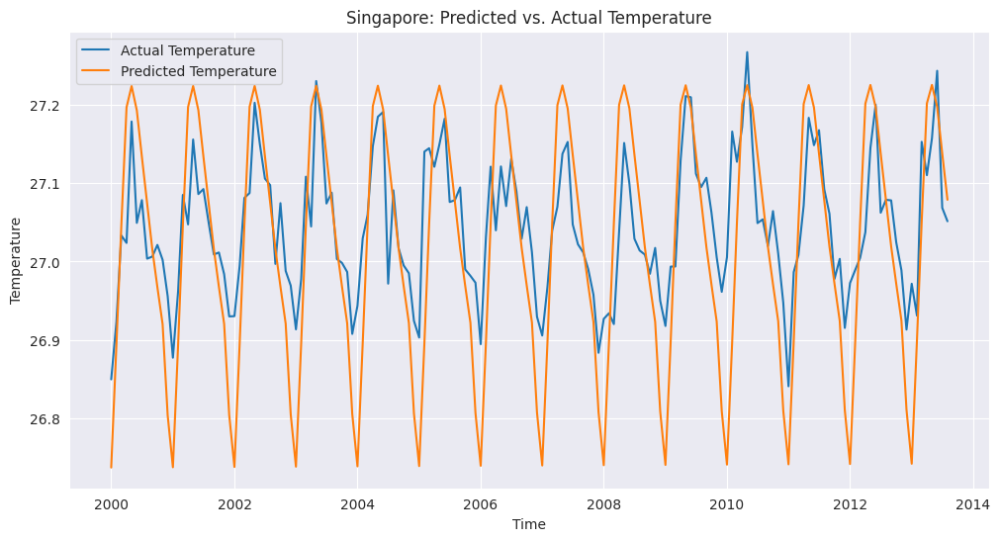

Mean Squared Error (MSE) for Singapore: 0.0094


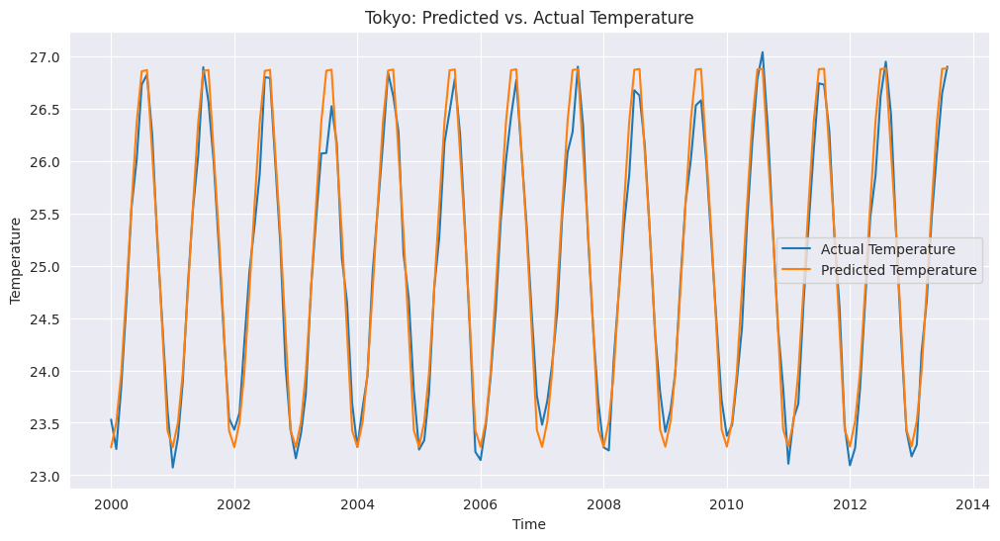

Mean Squared Error (MSE) for Tokyo: 0.0453


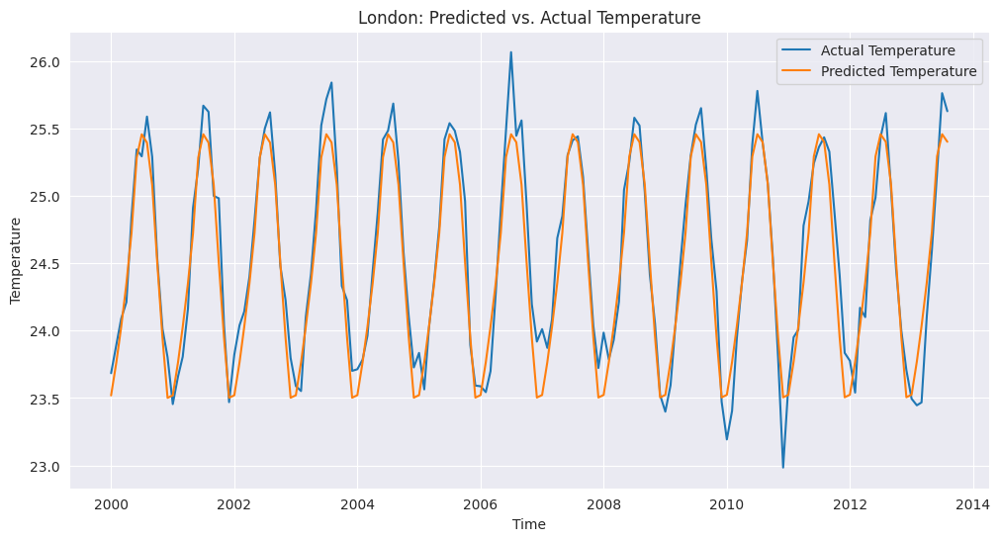

Mean Squared Error (MSE) for London: 0.0456


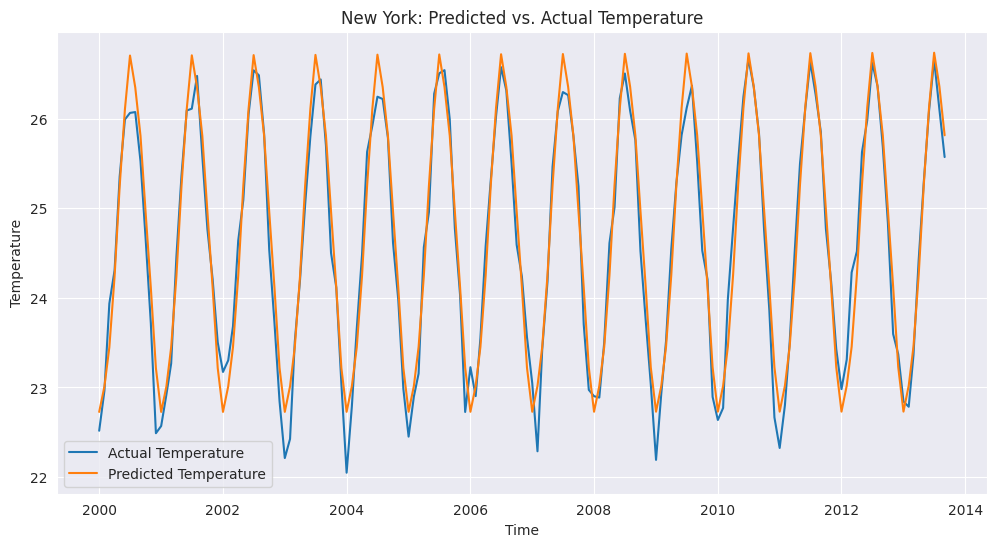

Mean Squared Error (MSE) for New York: 0.0832


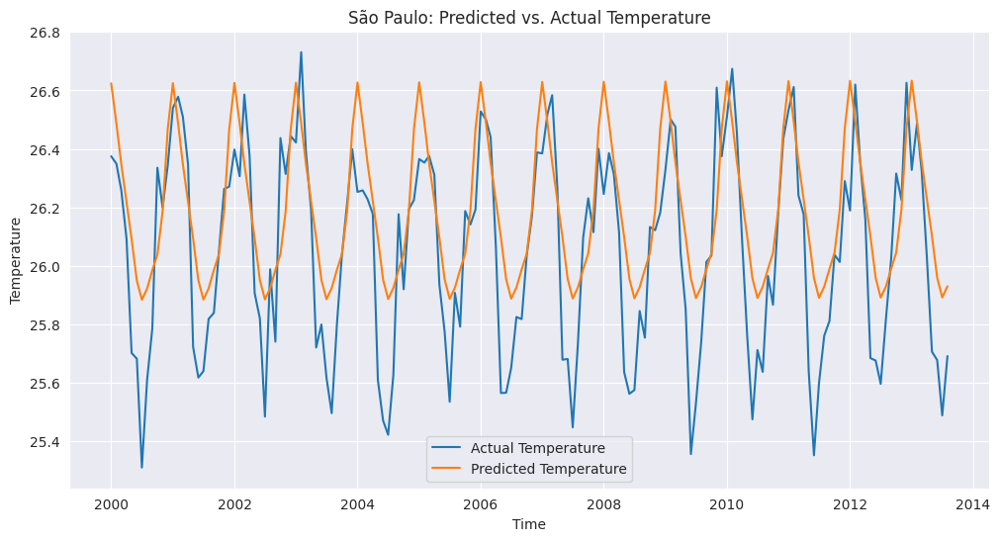

Mean Squared Error (MSE) for São Paulo: 0.0587


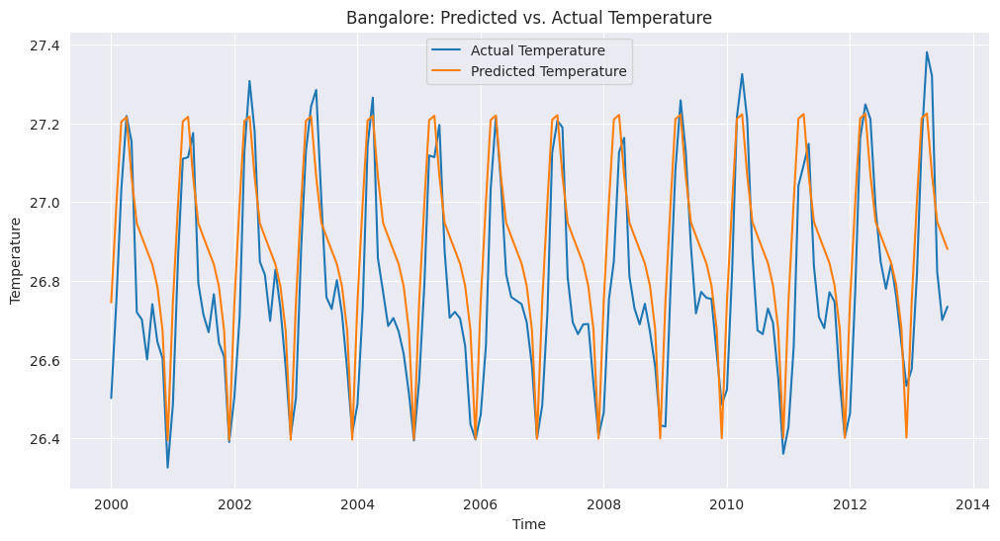

Mean Squared Error (MSE) for Bangalore: 0.0253


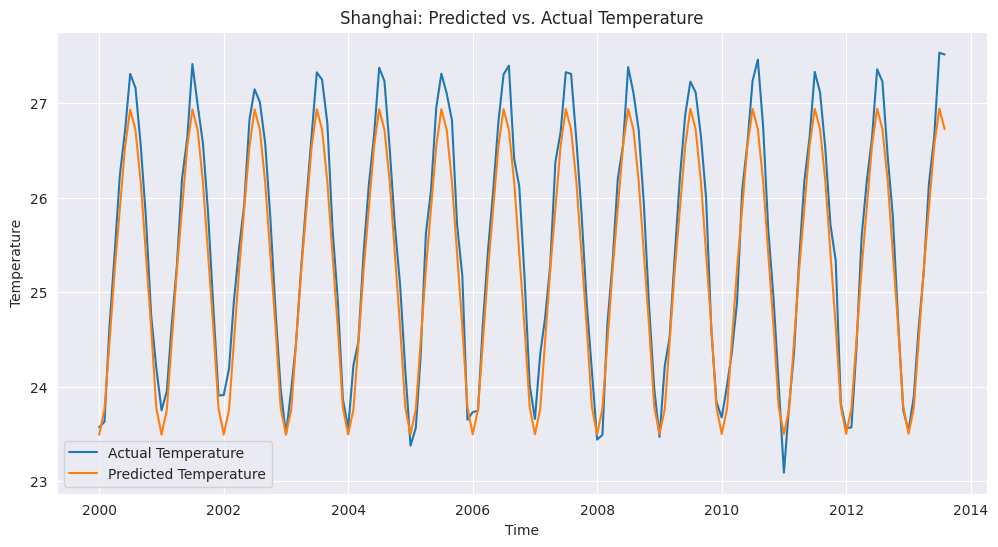

Mean Squared Error (MSE) for Shanghai: 0.1099


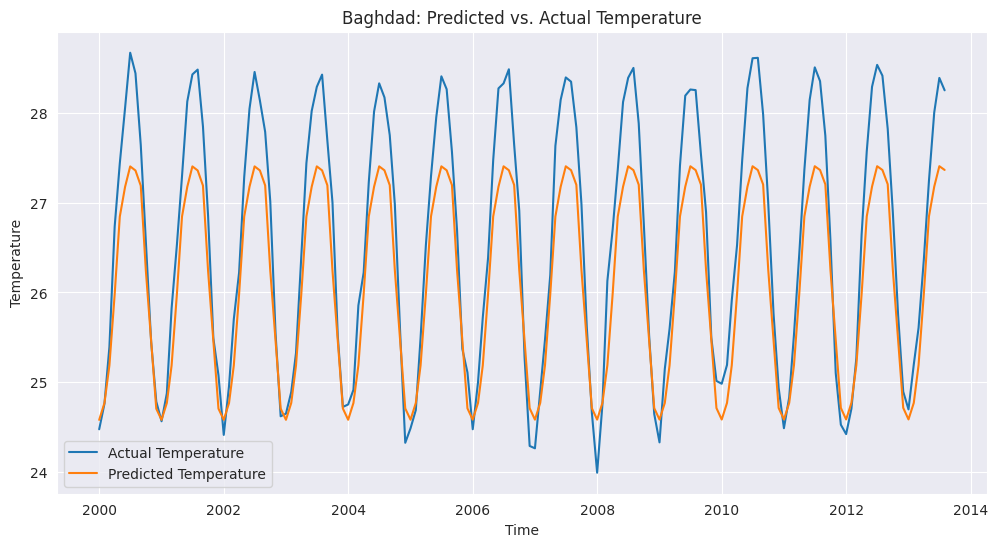

Mean Squared Error (MSE) for Baghdad: 0.3968


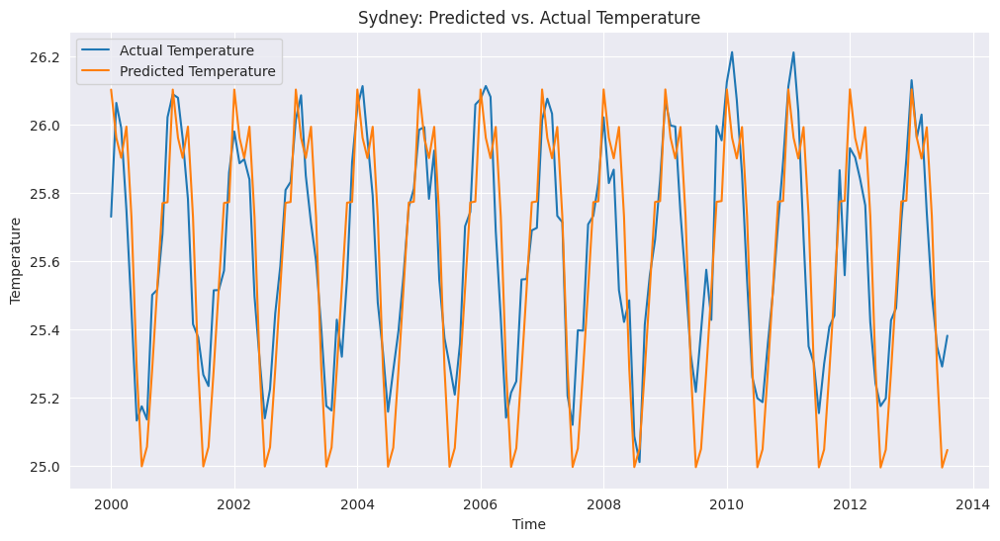

Mean Squared Error (MSE) for Sydney: 0.0294


In [ ]:
for city in plt_cities:
    plot_actual_predictions(city, model, test_df, device)

###4.5.2 Feedforward Neural Network - ReLU (V2) - Single set of latitude and longitude 

In the code below, we split our dataset into training and testing sets based on a date threshold, and create a custom dataset and data loaders for PyTorch. It defines a neural network model using PyTorch's nn.Module class, with five linear layers and ReLU activation functions. The model is then trained and evaluated using mean squared error as the loss function and the Adam optimizer. The device used for training is either the GPU or CPU depending on availability, and the training and testing losses are printed for each epoch.



In [ ]:
data = processed_data.copy()

# Split data into train and test sets based on time
split_date = pd.to_datetime('2000-01-01')
train_df = data[data['dt'] < split_date]
test_df = data[data['dt'] >= split_date]

class TemperatureDataset(Dataset):
    def __init__(self, dataframe):
        self.dataframe = dataframe[['year', 'month', 'Latitude_Signed', 'Longitude_Signed', 'AverageTemperature']].values.astype(np.float32)

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        features = self.dataframe[idx, :-1]
        target = self.dataframe[idx, -1]
        X = torch.tensor(features, dtype=torch.float)
        y = torch.tensor(target, dtype=torch.float)
        return X, y

# Create datasets and dataloaders
train_dataset = TemperatureDataset(train_df)
test_dataset = TemperatureDataset(test_df)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

class TemperatureNet(nn.Module):
    def __init__(self):
        super(TemperatureNet, self).__init__()
        self.layer1 = nn.Linear(4, 12)
        self.layer2 = nn.Linear(12, 24)
        self.layer3 = nn.Linear(24, 48)
        self.layer4 = nn.Linear(48, 24)
        self.layer5 = nn.Linear(24, 1)

    def forward(self, x):
        x = torch.relu(self.layer1(x))
        x = torch.relu(self.layer2(x))
        x = torch.relu(self.layer3(x))
        x = torch.relu(self.layer4(x))
        x = self.layer5(x)
        return x

# Initialize the model, loss function, and optimizer
model = TemperatureNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Train and evaluate the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device.type)
model = model.to(device)

n_epochs = 20
train_losses, test_losses = [], []

for epoch in range(n_epochs):
    train_loss = train(model, train_loader, criterion, optimizer, device)
    test_loss = evaluate(model, test_loader, criterion, device)

    train_losses.append(train_loss)
    test_losses.append(test_loss)

    print(f"Epoch: {epoch + 1}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}")


cuda
Epoch: 1, Train Loss: 0.0312, Test Loss: 0.0124
Epoch: 2, Train Loss: 0.0112, Test Loss: 0.0107
Epoch: 3, Train Loss: 0.0106, Test Loss: 0.0106
Epoch: 4, Train Loss: 0.0101, Test Loss: 0.0100
Epoch: 5, Train Loss: 0.0097, Test Loss: 0.0092
Epoch: 6, Train Loss: 0.0083, Test Loss: 0.0078
Epoch: 7, Train Loss: 0.0047, Test Loss: 0.0039
Epoch: 8, Train Loss: 0.0028, Test Loss: 0.0020
Epoch: 9, Train Loss: 0.0019, Test Loss: 0.0017
Epoch: 10, Train Loss: 0.0016, Test Loss: 0.0014
Epoch: 11, Train Loss: 0.0014, Test Loss: 0.0012
Epoch: 12, Train Loss: 0.0013, Test Loss: 0.0012
Epoch: 13, Train Loss: 0.0012, Test Loss: 0.0011
Epoch: 14, Train Loss: 0.0011, Test Loss: 0.0015
Epoch: 15, Train Loss: 0.0010, Test Loss: 0.0014
Epoch: 16, Train Loss: 0.0010, Test Loss: 0.0012
Epoch: 17, Train Loss: 0.0010, Test Loss: 0.0015
Epoch: 18, Train Loss: 0.0010, Test Loss: 0.0009
Epoch: 19, Train Loss: 0.0009, Test Loss: 0.0010
Epoch: 20, Train Loss: 0.0009, Test Loss: 0.0012


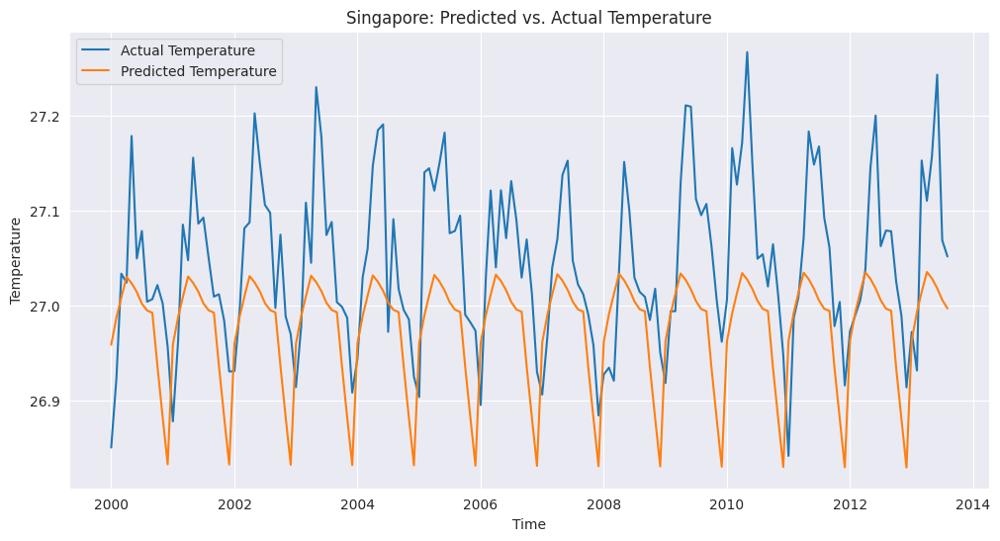

Mean Squared Error (MSE) for Singapore: 0.0095


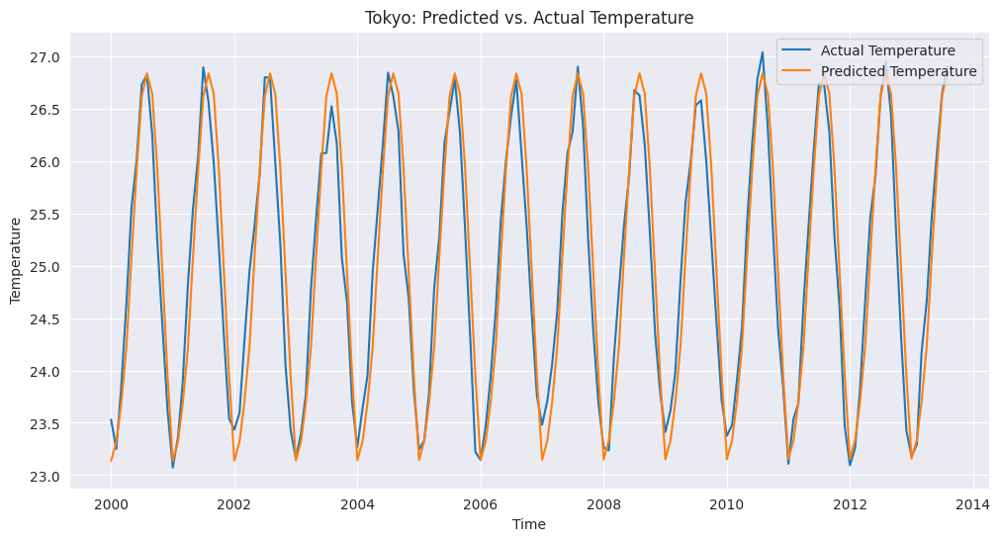

Mean Squared Error (MSE) for Tokyo: 0.1475


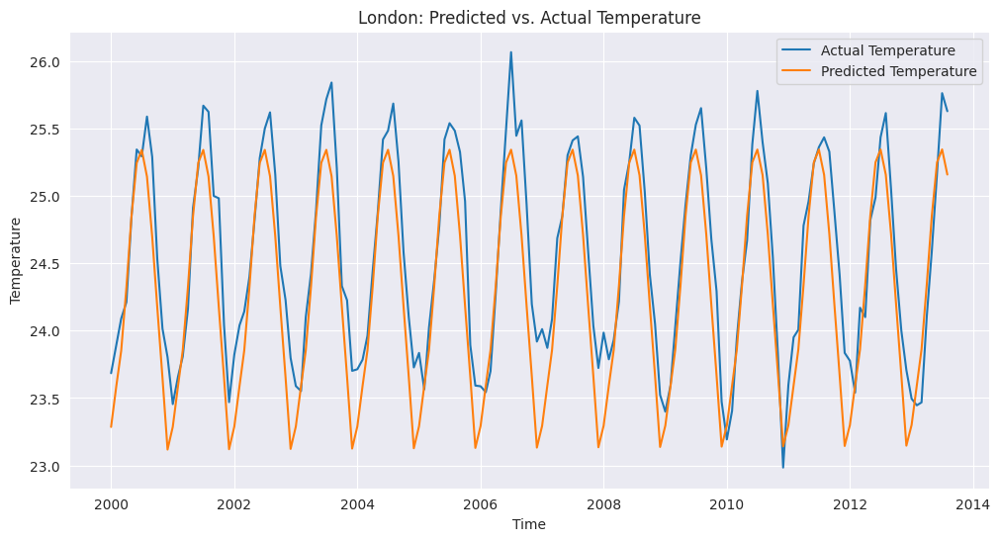

Mean Squared Error (MSE) for London: 0.1370


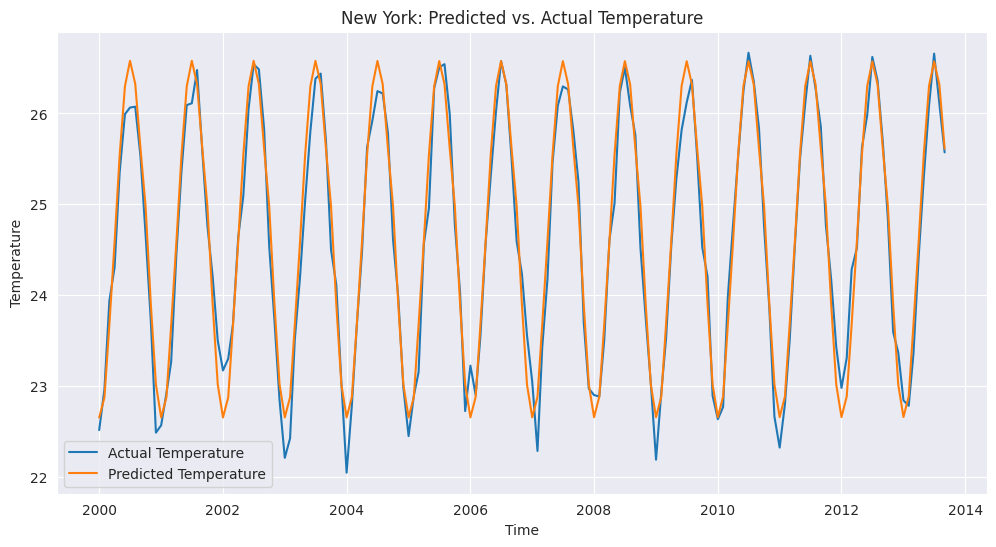

Mean Squared Error (MSE) for New York: 0.0748


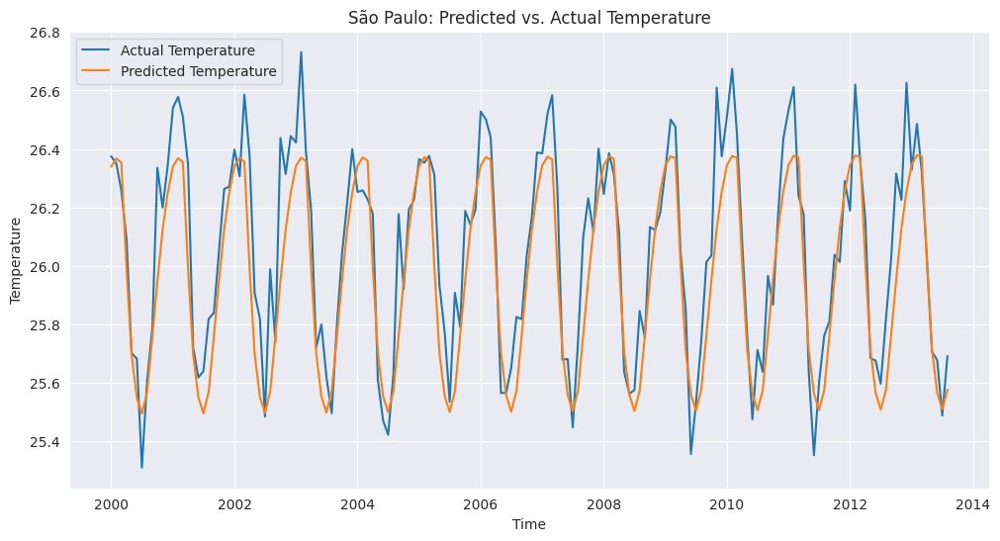

Mean Squared Error (MSE) for São Paulo: 0.0283


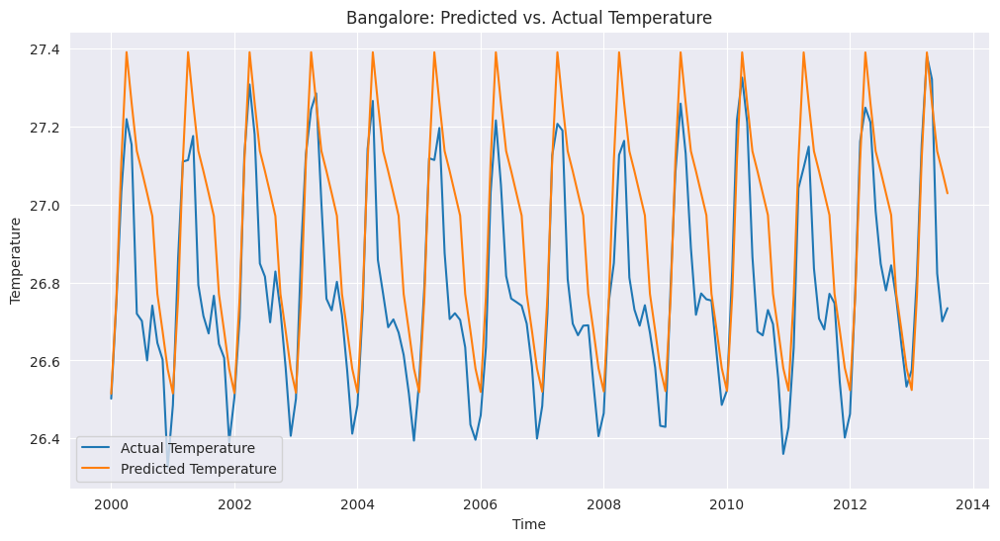

Mean Squared Error (MSE) for Bangalore: 0.0422


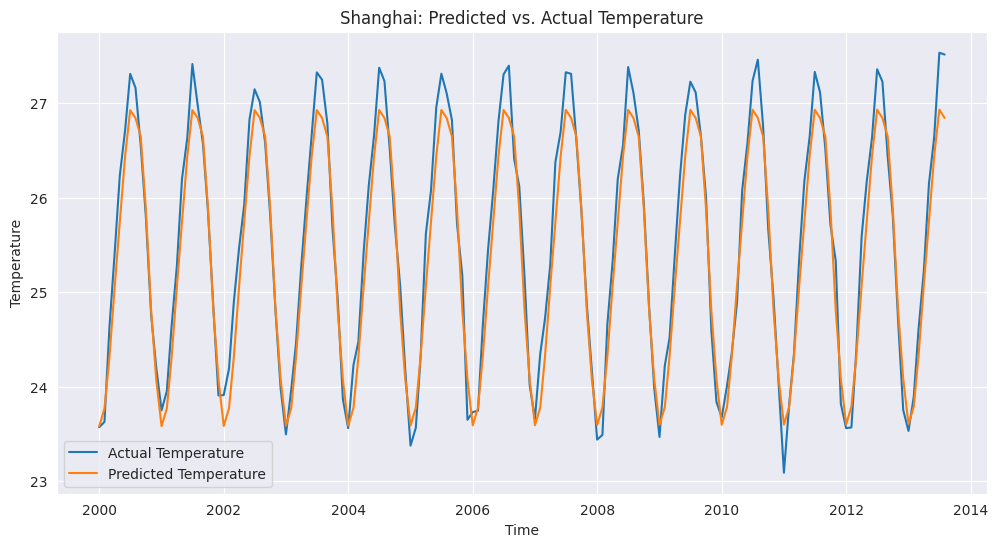

Mean Squared Error (MSE) for Shanghai: 0.0871


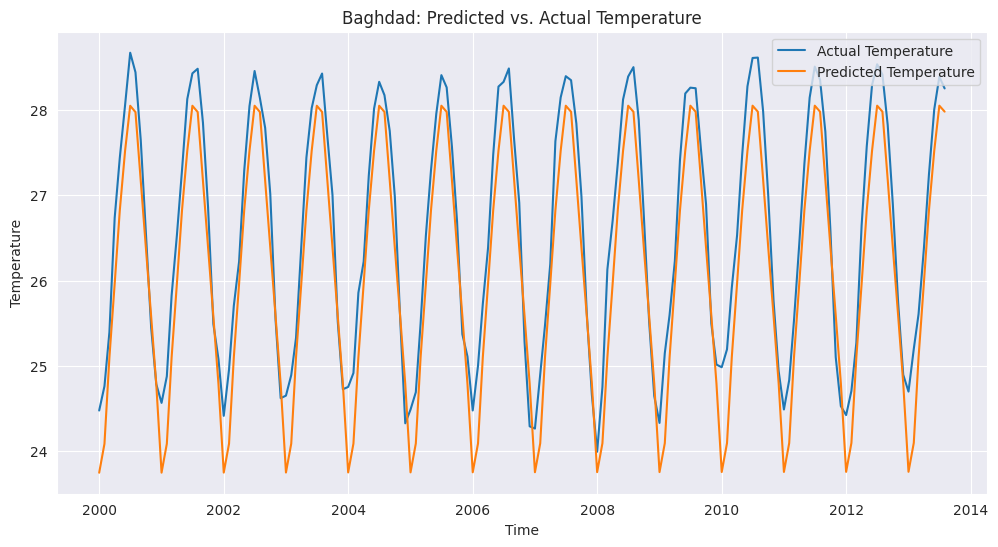

Mean Squared Error (MSE) for Baghdad: 0.3072


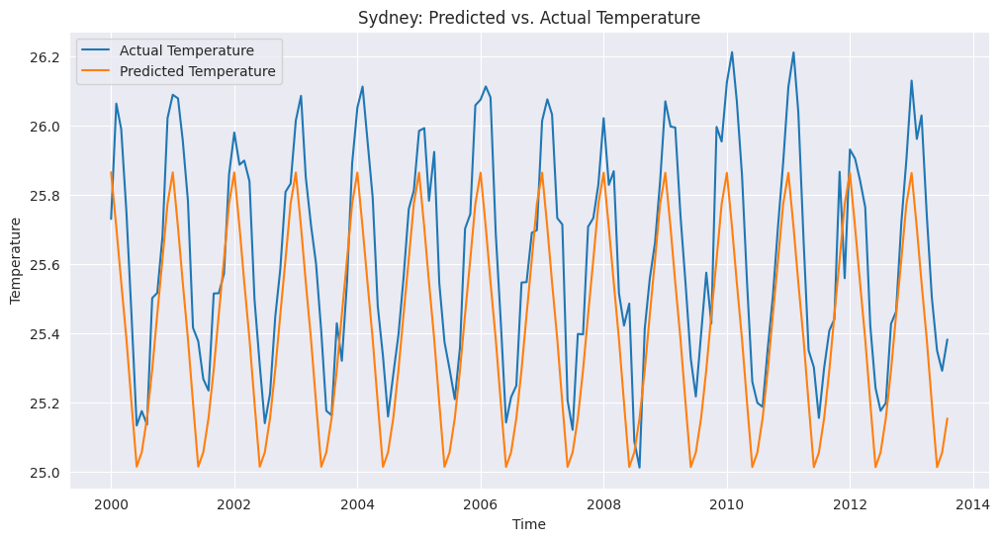

Mean Squared Error (MSE) for Sydney: 0.0674


In [ ]:
for city in plt_cities:
    plot_actual_predictions(city, model, test_df, device)

###4.5.3 Fully Connected Feedforward Neural Network (V3) - S2 Cell spatial indexing 
In the code below, we create S2 dataloaders for training and testing. We define our fully connected feed forward neural network in PyTorch's nn module with 5 linear layers and ReLU activation functions. The model is then trained using a mean squared error loss function and the Adam optimizer. The number of training epochs, device to use for training, and the train and test loss for each epoch are printed to the console.

S2 cells use spatial indexing to efficiently represent and query geographic locations on a sphere - this is helpful because the earth is a sphere, and we want to divide this geographic information in a logical and useful way using location-based data. Here, we convert latitude and longitude into S2 cell IDs. 


In [ ]:
data = processed_data.copy()

# Split data into train and test sets based on time
split_date = pd.to_datetime('2000-01-01')
train_df = data[data['dt'] < split_date]
test_df = data[data['dt'] >= split_date]

class TemperatureDataset(Dataset):
    def __init__(self, dataframe):
        self.dataframe = dataframe[['year', 'month', 'Latitude_Direction', 'Longitude_Direction', 'Latitude_Value', 'Longitude_Value', 'S2_Cell_0', 'S2_Cell_1', 'S2_Cell_2', 'S2_Cell_3', 'S2_Cell_4', 'S2_Cell_5', 'S2_Cell_6', 'AverageTemperature']].values.astype(np.float32)

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        features = self.dataframe[idx, :-1]
        target = self.dataframe[idx, -1]
        X = torch.tensor(features, dtype=torch.float)
        y = torch.tensor(target, dtype=torch.float)
        return X, y

# Create datasets and dataloaders
train_dataset = TemperatureDataset(train_df)
test_dataset = TemperatureDataset(test_df)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

class TemperatureNet(nn.Module):
    def __init__(self):
        super(TemperatureNet, self).__init__()
        self.layer1 = nn.Linear(13, 26)
        self.layer2 = nn.Linear(26, 52)
        self.layer3 = nn.Linear(52, 26)
        self.layer4 = nn.Linear(26, 13)
        self.layer5 = nn.Linear(13, 1)

    def forward(self, x):
        x = torch.relu(self.layer1(x))
        x = torch.relu(self.layer2(x))
        x = torch.relu(self.layer3(x))
        x = torch.relu(self.layer4(x))
        x = self.layer5(x)
        return x

# Initialize the model, loss function, and optimizer
model = TemperatureNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Train and evaluate the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device.type)
model = model.to(device)

n_epochs = 20
train_losses, test_losses = [], []

for epoch in range(n_epochs):
    train_loss = train(model, train_loader, criterion, optimizer, device)
    test_loss = evaluate(model, test_loader, criterion, device)

    train_losses.append(train_loss)
    test_losses.append(test_loss)

    print(f"Epoch: {epoch + 1}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}")


cuda
Epoch: 1, Train Loss: 0.0149, Test Loss: 0.0032
Epoch: 2, Train Loss: 0.0026, Test Loss: 0.0023
Epoch: 3, Train Loss: 0.0019, Test Loss: 0.0016
Epoch: 4, Train Loss: 0.0015, Test Loss: 0.0015
Epoch: 5, Train Loss: 0.0014, Test Loss: 0.0013
Epoch: 6, Train Loss: 0.0012, Test Loss: 0.0012
Epoch: 7, Train Loss: 0.0011, Test Loss: 0.0017
Epoch: 8, Train Loss: 0.0011, Test Loss: 0.0011
Epoch: 9, Train Loss: 0.0010, Test Loss: 0.0013
Epoch: 10, Train Loss: 0.0009, Test Loss: 0.0012
Epoch: 11, Train Loss: 0.0009, Test Loss: 0.0010
Epoch: 12, Train Loss: 0.0009, Test Loss: 0.0010
Epoch: 13, Train Loss: 0.0008, Test Loss: 0.0008
Epoch: 14, Train Loss: 0.0008, Test Loss: 0.0010
Epoch: 15, Train Loss: 0.0008, Test Loss: 0.0010
Epoch: 16, Train Loss: 0.0008, Test Loss: 0.0008
Epoch: 17, Train Loss: 0.0007, Test Loss: 0.0008
Epoch: 18, Train Loss: 0.0008, Test Loss: 0.0007
Epoch: 19, Train Loss: 0.0007, Test Loss: 0.0007
Epoch: 20, Train Loss: 0.0007, Test Loss: 0.0007


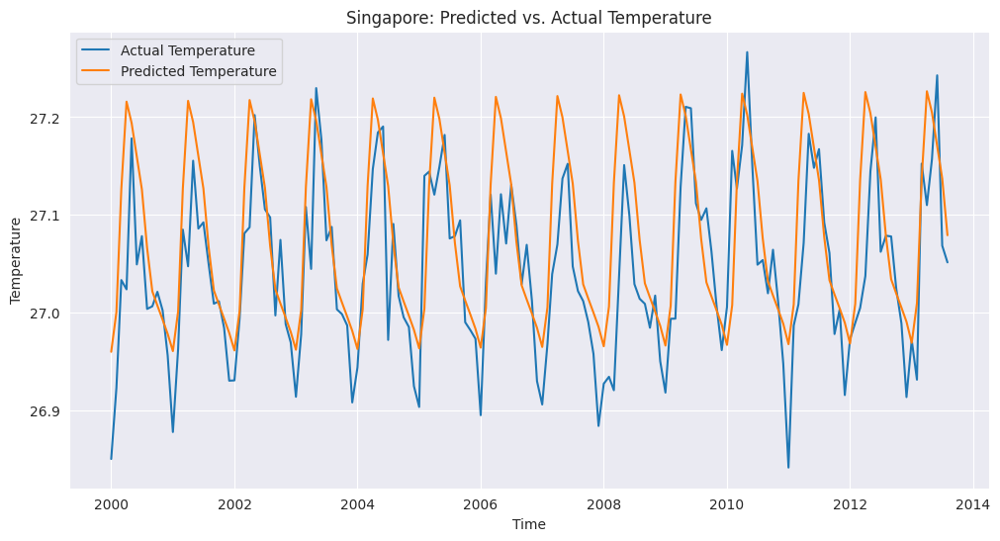

Mean Squared Error (MSE) for Singapore: 0.0048


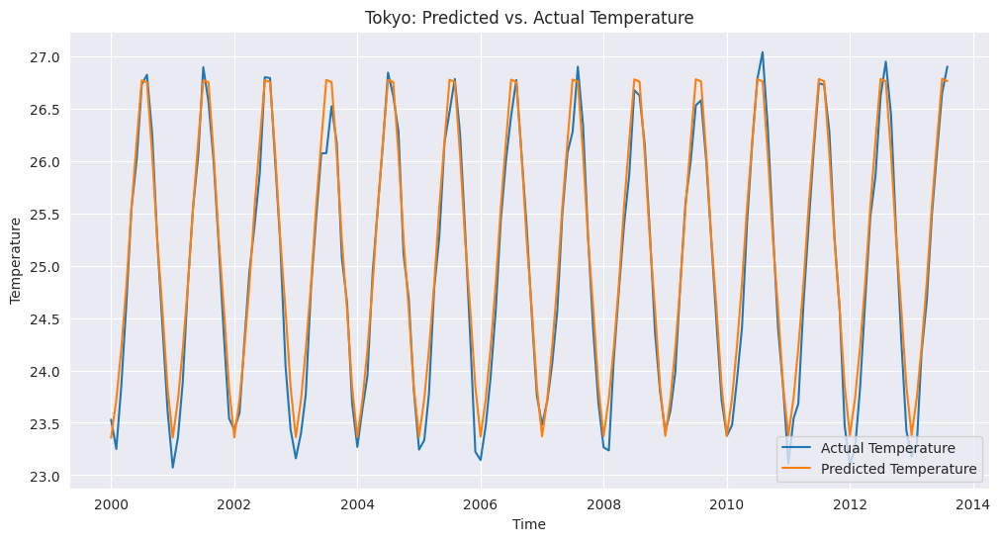

Mean Squared Error (MSE) for Tokyo: 0.0508


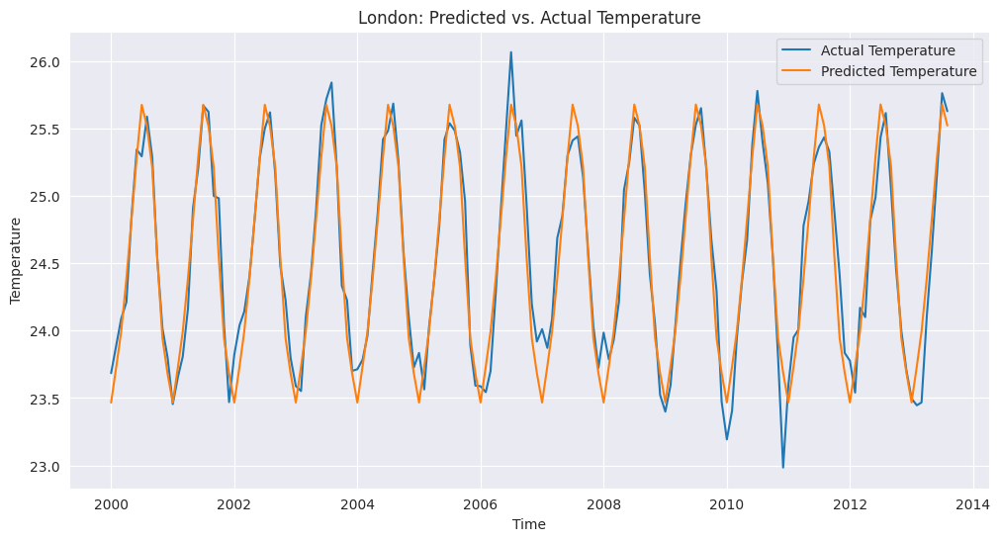

Mean Squared Error (MSE) for London: 0.0395


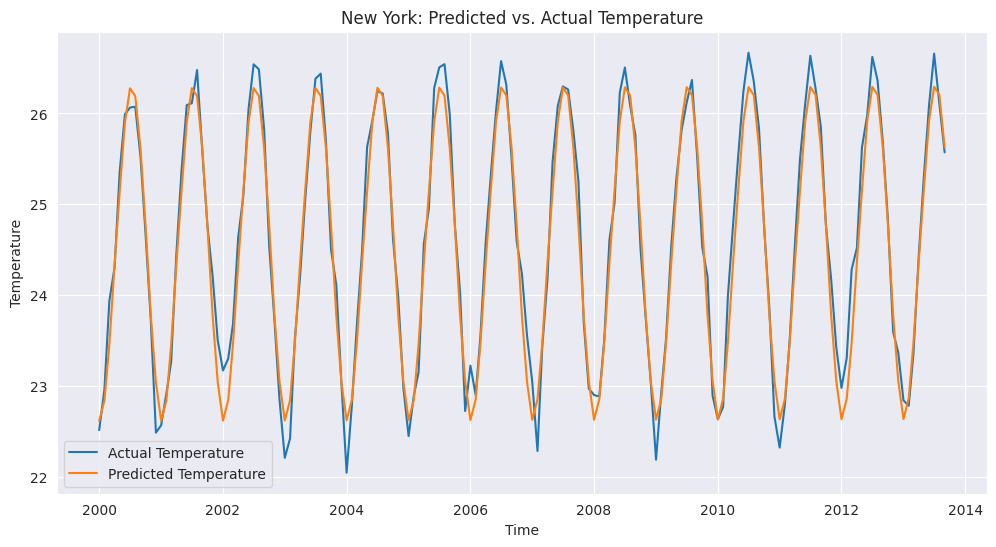

Mean Squared Error (MSE) for New York: 0.0673


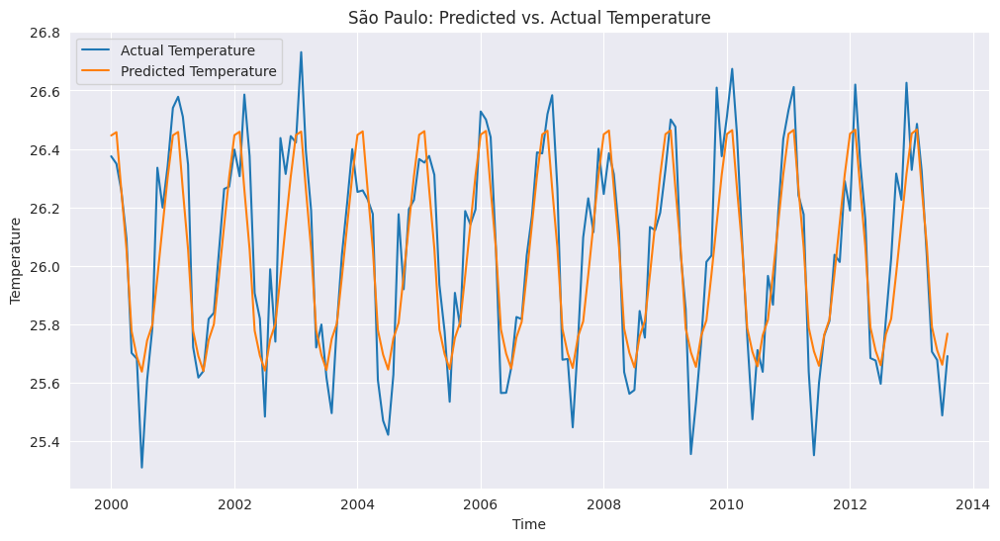

Mean Squared Error (MSE) for São Paulo: 0.0240


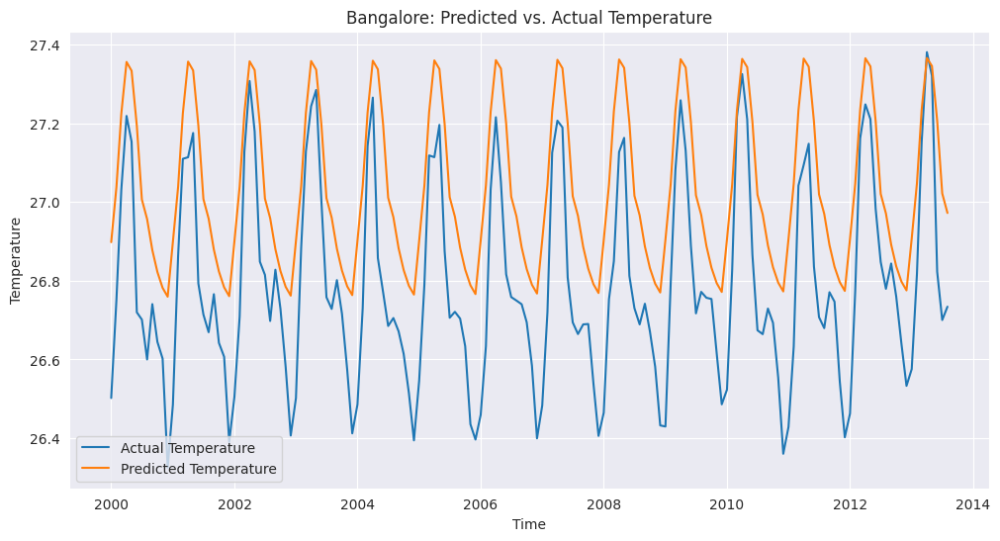

Mean Squared Error (MSE) for Bangalore: 0.0717


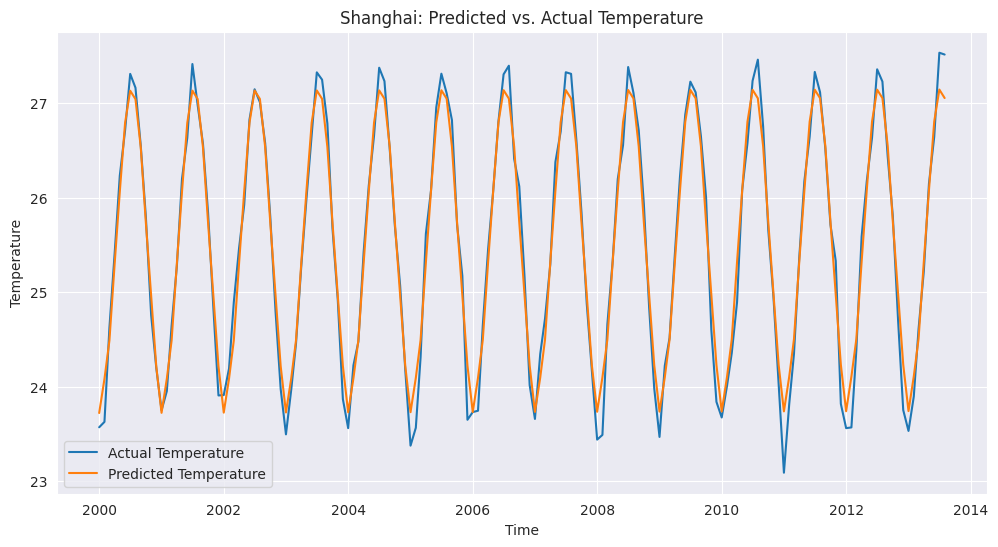

Mean Squared Error (MSE) for Shanghai: 0.0462


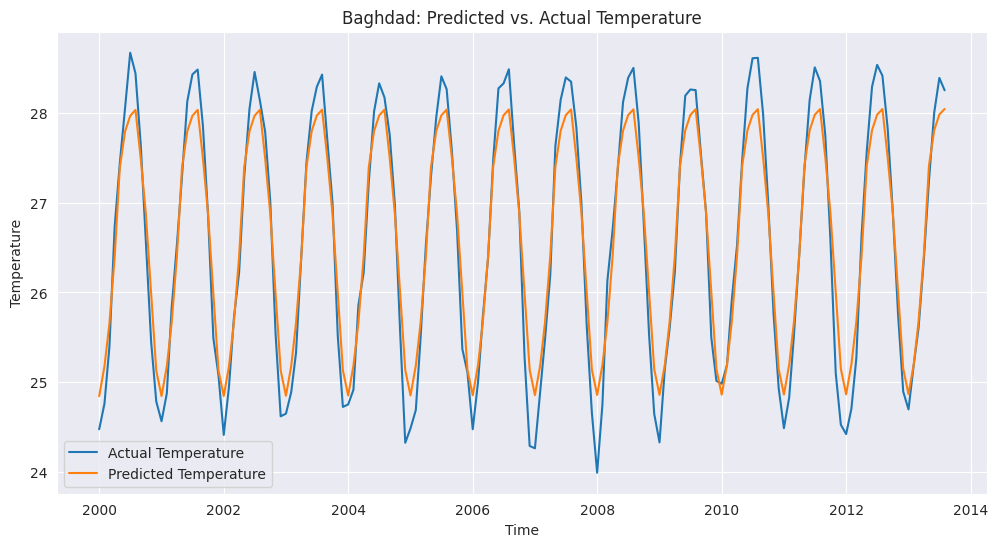

Mean Squared Error (MSE) for Baghdad: 0.1195


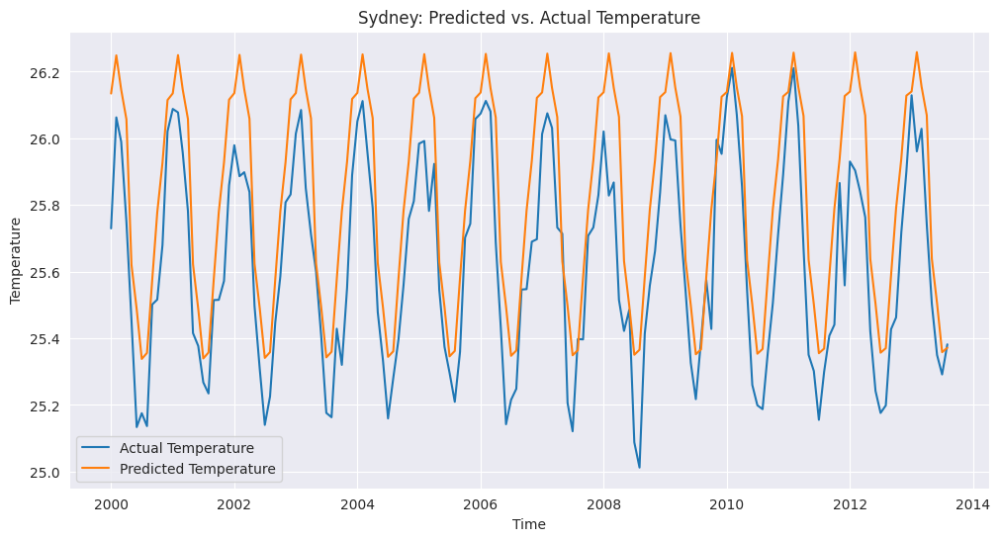

Mean Squared Error (MSE) for Sydney: 0.0498


In [ ]:
for city in plt_cities:
    plot_actual_predictions(city, model, test_df, device)

###4.5.4 Fully Connected Feedforward Neural Network (V4) - City data with S2 cell spatial indexing

In the code below, the dataset contains temperature information represented by latitude and longitude coordinates, as well as S2 cell information. The train and test sets are then used to create instances of a custom PyTorch Dataset class called TemperatureDataset, which extracts the relevant features and target variables from the input dataframe and converts them to PyTorch tensors. These datasets are then used to create dataloaders that can be used to feed batches of data to our neural network.


In [ ]:
data = processed_data.copy()

# Split data into train and test sets based on time
split_date = pd.to_datetime('2000-01-01')
train_df = data[data['dt'] < split_date]
test_df = data[data['dt'] >= split_date]

class TemperatureDataset(Dataset):
    def __init__(self, dataframe):
        self.dataframe = dataframe[['year', 'month', 'City_Encoded', 'Latitude_Direction', 'Longitude_Direction', 'Latitude_Value', 'Longitude_Value', 'S2_Cell_0', 'S2_Cell_1', 'S2_Cell_2', 'S2_Cell_3', 'S2_Cell_4', 'S2_Cell_5', 'S2_Cell_6', 'AverageTemperature']].values.astype(np.float32)

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        features = self.dataframe[idx, :-1]
        target = self.dataframe[idx, -1]
        X = torch.tensor(features, dtype=torch.float)
        y = torch.tensor(target, dtype=torch.float)
        return X, y


# Create datasets and dataloaders
train_dataset = TemperatureDataset(train_df)
test_dataset = TemperatureDataset(test_df)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

class TemperatureNet(nn.Module):
    def __init__(self):
        super(TemperatureNet, self).__init__()
        self.layer1 = nn.Linear(14, 26)
        self.layer2 = nn.Linear(26, 52)
        self.layer3 = nn.Linear(52, 26)
        self.layer4 = nn.Linear(26, 13)
        self.layer5 = nn.Linear(13, 1)

    def forward(self, x):
        x = torch.relu(self.layer1(x))
        x = torch.relu(self.layer2(x))
        x = torch.relu(self.layer3(x))
        x = torch.relu(self.layer4(x))
        x = self.layer5(x)
        return x

# Initialize the model, loss function, and optimizer
model = TemperatureNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Train and evaluate the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device.type)
model = model.to(device)

n_epochs = 20
train_losses, test_losses = [], []

for epoch in range(n_epochs):
    train_loss = train(model, train_loader, criterion, optimizer, device)
    test_loss = evaluate(model, test_loader, criterion, device)

    train_losses.append(train_loss)
    test_losses.append(test_loss)

    print(f"Epoch: {epoch + 1}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}")


cuda
Epoch: 1, Train Loss: 0.0326, Test Loss: 0.0102
Epoch: 2, Train Loss: 0.0052, Test Loss: 0.0031
Epoch: 3, Train Loss: 0.0024, Test Loss: 0.0022
Epoch: 4, Train Loss: 0.0019, Test Loss: 0.0017
Epoch: 5, Train Loss: 0.0016, Test Loss: 0.0015
Epoch: 6, Train Loss: 0.0014, Test Loss: 0.0014
Epoch: 7, Train Loss: 0.0012, Test Loss: 0.0013
Epoch: 8, Train Loss: 0.0011, Test Loss: 0.0011
Epoch: 9, Train Loss: 0.0010, Test Loss: 0.0010
Epoch: 10, Train Loss: 0.0009, Test Loss: 0.0012
Epoch: 11, Train Loss: 0.0009, Test Loss: 0.0009
Epoch: 12, Train Loss: 0.0008, Test Loss: 0.0008
Epoch: 13, Train Loss: 0.0008, Test Loss: 0.0010
Epoch: 14, Train Loss: 0.0008, Test Loss: 0.0010
Epoch: 15, Train Loss: 0.0008, Test Loss: 0.0008
Epoch: 16, Train Loss: 0.0008, Test Loss: 0.0010
Epoch: 17, Train Loss: 0.0007, Test Loss: 0.0008
Epoch: 18, Train Loss: 0.0007, Test Loss: 0.0007
Epoch: 19, Train Loss: 0.0007, Test Loss: 0.0007
Epoch: 20, Train Loss: 0.0007, Test Loss: 0.0008


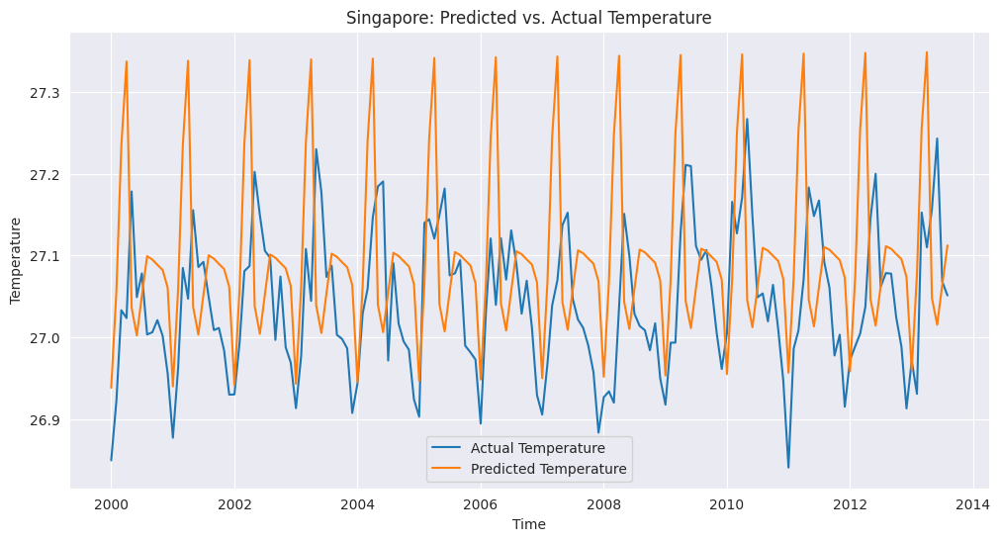

Mean Squared Error (MSE) for Singapore: 0.0174


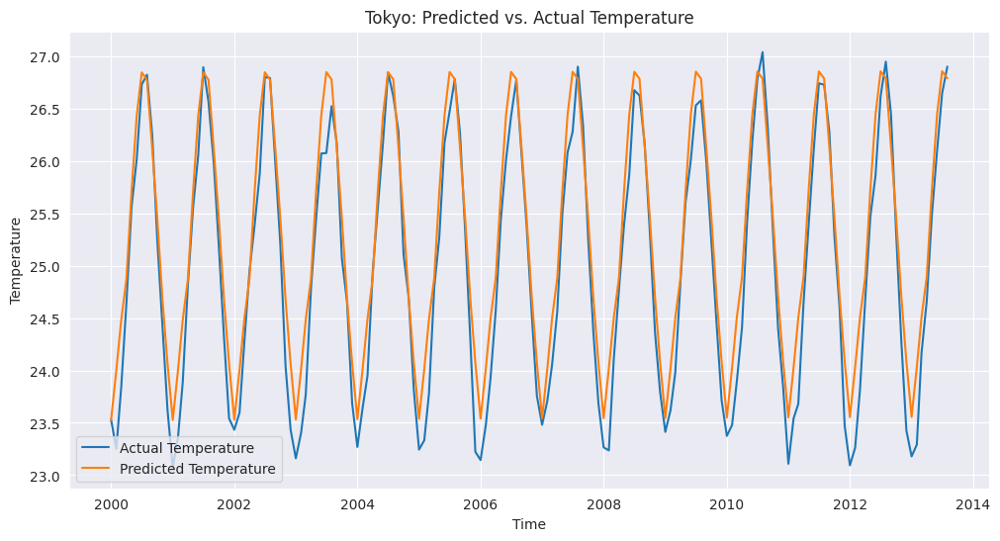

Mean Squared Error (MSE) for Tokyo: 0.1363


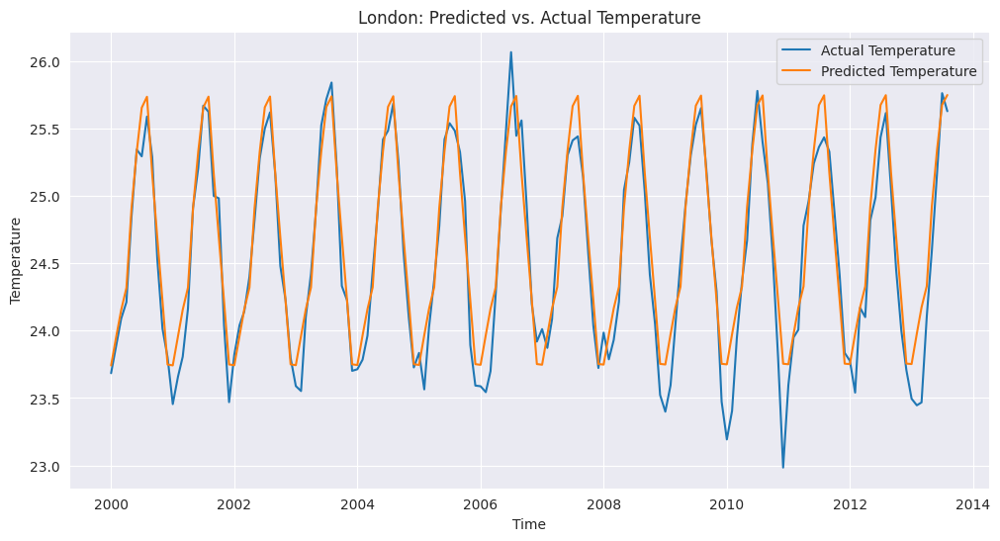

Mean Squared Error (MSE) for London: 0.0497


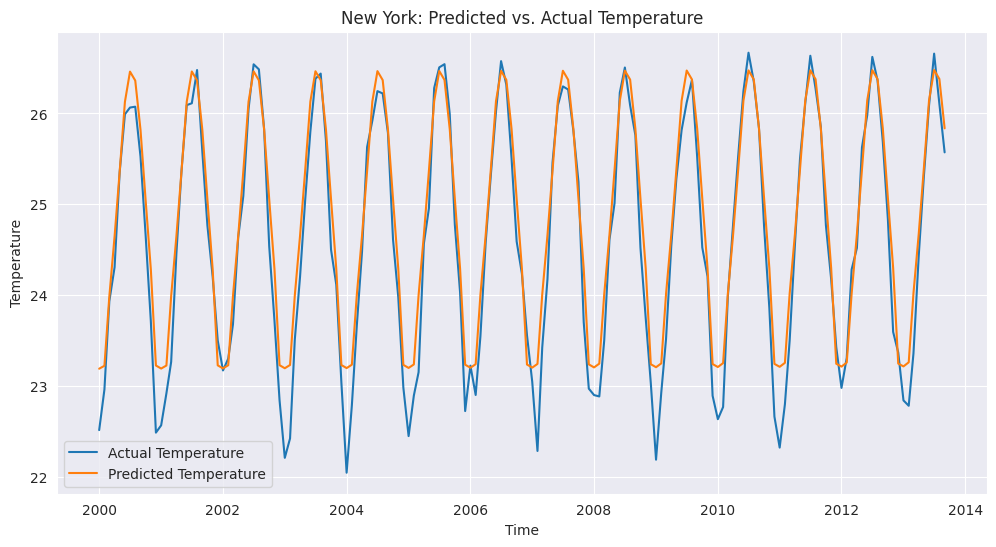

Mean Squared Error (MSE) for New York: 0.1348


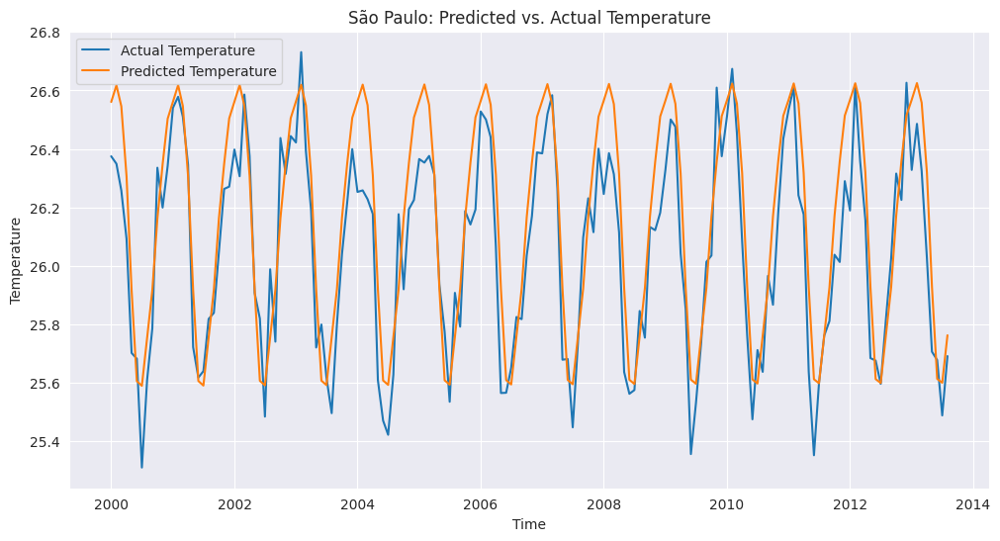

Mean Squared Error (MSE) for São Paulo: 0.0312


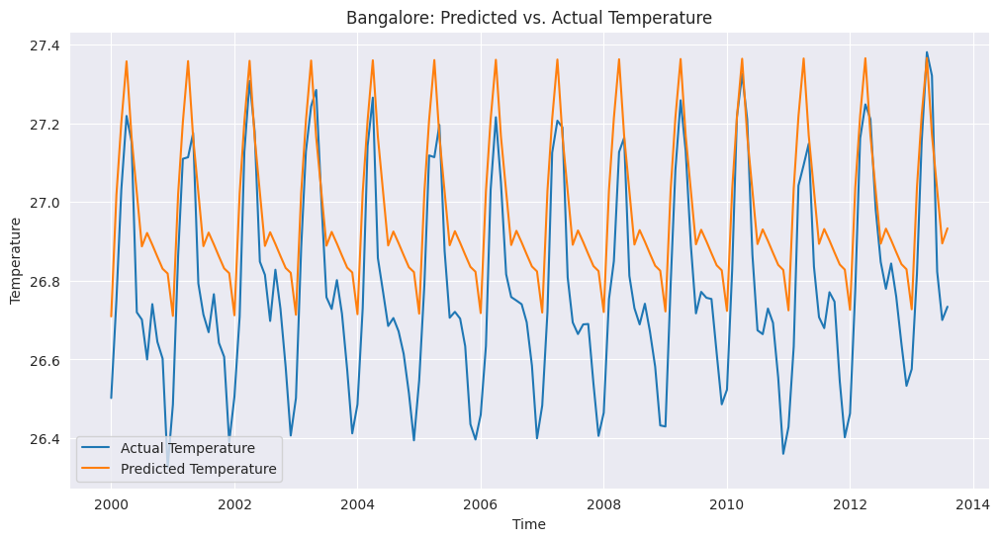

Mean Squared Error (MSE) for Bangalore: 0.0502


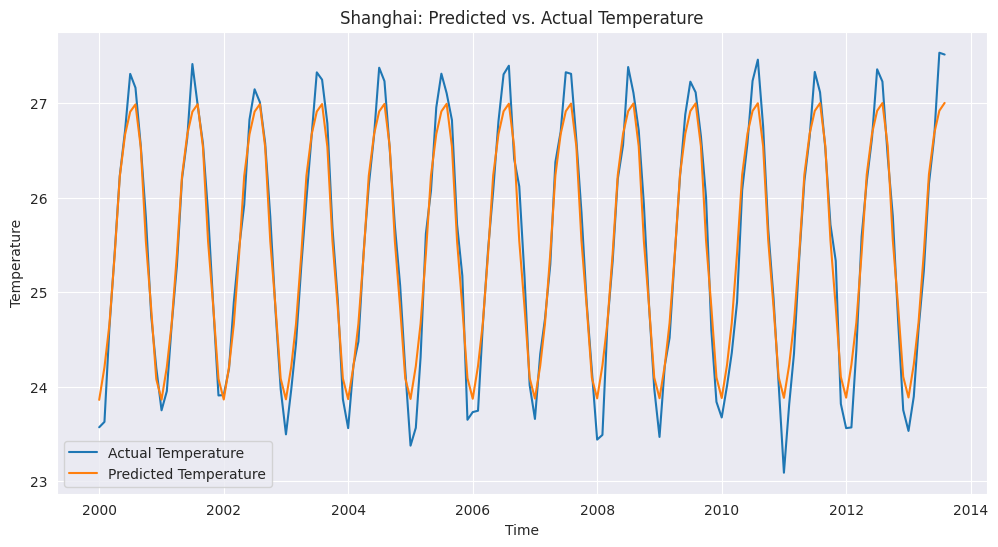

Mean Squared Error (MSE) for Shanghai: 0.0732


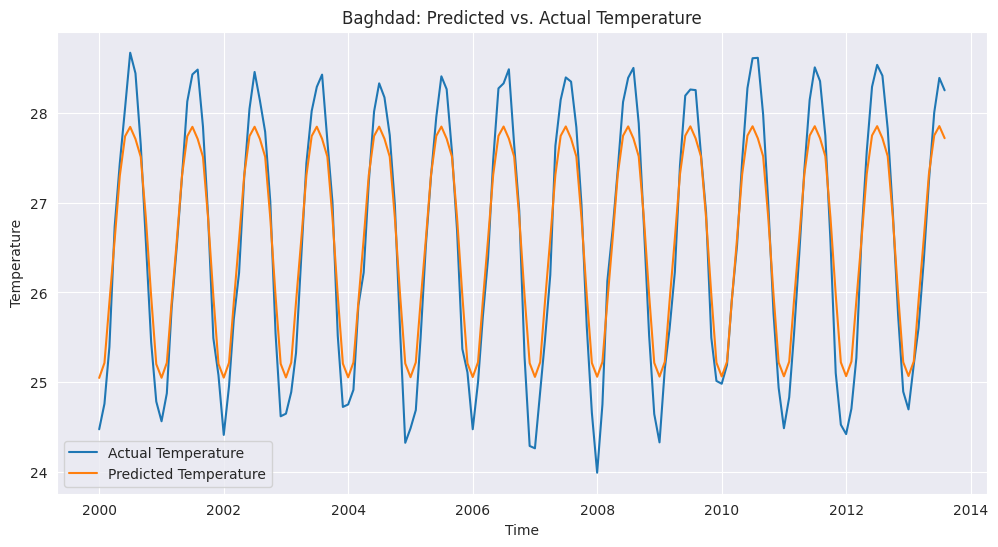

Mean Squared Error (MSE) for Baghdad: 0.1895


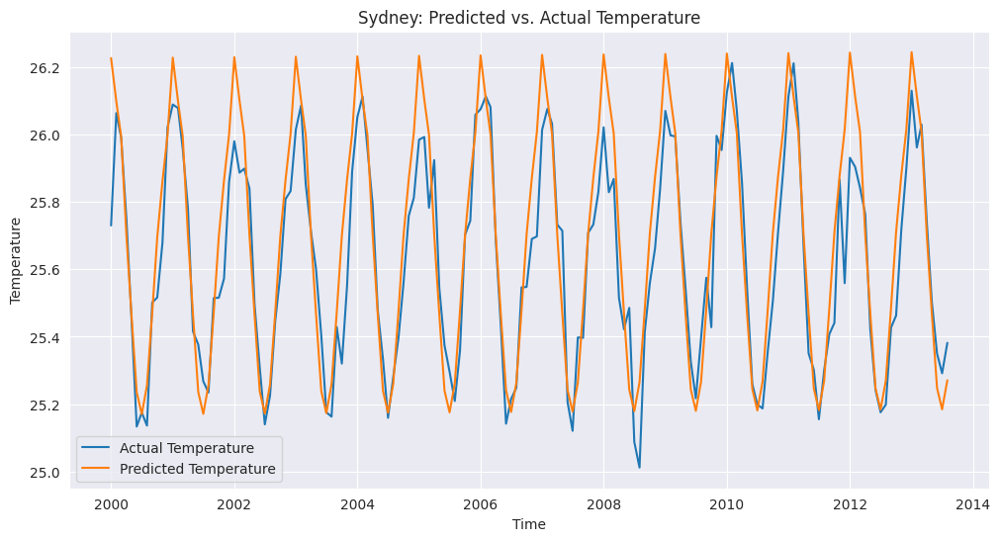

Mean Squared Error (MSE) for Sydney: 0.0202


In [ ]:
for city in plt_cities:
    plot_actual_predictions(city, model, test_df, device)

###4.5.5 Fully Connected Feedforward Neural Network (V5) - same as V4, but BIGGER

The code below is an example of what 4.4.8 contains, but a significantly larger model. 

In [ ]:
data = processed_data.copy()

# Split data into train and test sets based on time
split_date = pd.to_datetime('2000-01-01')
train_df = data[data['dt'] < split_date]
test_df = data[data['dt'] >= split_date]

class TemperatureDataset(Dataset):
    def __init__(self, dataframe):
        self.dataframe = dataframe[['year', 'month', 'City_Encoded', 'Latitude_Direction', 'Longitude_Direction', 'Latitude_Value', 'Longitude_Value', 'S2_Cell_0', 'S2_Cell_1', 'S2_Cell_2', 'S2_Cell_3', 'S2_Cell_4', 'S2_Cell_5', 'S2_Cell_6', 'AverageTemperature']].values.astype(np.float32)

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        features = self.dataframe[idx, :-1]
        target = self.dataframe[idx, -1]
        X = torch.tensor(features, dtype=torch.float)
        y = torch.tensor(target, dtype=torch.float)
        return X, y

# Create datasets and dataloaders
train_dataset = TemperatureDataset(train_df)
test_dataset = TemperatureDataset(test_df)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

class TemperatureNet(nn.Module):
    def __init__(self):
        super(TemperatureNet, self).__init__()
        self.layer1 = nn.Linear(14, 50)
        self.layer2 = nn.Linear(50, 100)
        self.layer3 = nn.Linear(100, 200)
        self.layer4 = nn.Linear(200, 100)
        self.layer5 = nn.Linear(100, 50)
        self.layer6 = nn.Linear(50, 1)

    def forward(self, x):
        x = torch.relu(self.layer1(x))
        x = torch.relu(self.layer2(x))
        x = torch.relu(self.layer3(x))
        x = torch.relu(self.layer4(x))
        x = torch.relu(self.layer5(x))
        x = self.layer6(x)
        return x

# Initialize the model, loss function, and optimizer
model = TemperatureNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Train and evaluate the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device.type)
model = model.to(device)

n_epochs = 20
train_losses, test_losses = [], []

for epoch in range(n_epochs):
    train_loss = train(model, train_loader, criterion, optimizer, device)
    test_loss = evaluate(model, test_loader, criterion, device)

    train_losses.append(train_loss)
    test_losses.append(test_loss)

    print(f"Epoch: {epoch + 1}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}")


cuda
Epoch: 1, Train Loss: 0.0169, Test Loss: 0.0027
Epoch: 2, Train Loss: 0.0016, Test Loss: 0.0012
Epoch: 3, Train Loss: 0.0011, Test Loss: 0.0010
Epoch: 4, Train Loss: 0.0009, Test Loss: 0.0013
Epoch: 5, Train Loss: 0.0008, Test Loss: 0.0007
Epoch: 6, Train Loss: 0.0007, Test Loss: 0.0008
Epoch: 7, Train Loss: 0.0007, Test Loss: 0.0006
Epoch: 8, Train Loss: 0.0006, Test Loss: 0.0006
Epoch: 9, Train Loss: 0.0006, Test Loss: 0.0007
Epoch: 10, Train Loss: 0.0006, Test Loss: 0.0005
Epoch: 11, Train Loss: 0.0005, Test Loss: 0.0006
Epoch: 12, Train Loss: 0.0005, Test Loss: 0.0006
Epoch: 13, Train Loss: 0.0005, Test Loss: 0.0006
Epoch: 14, Train Loss: 0.0005, Test Loss: 0.0005
Epoch: 15, Train Loss: 0.0005, Test Loss: 0.0004
Epoch: 16, Train Loss: 0.0004, Test Loss: 0.0006
Epoch: 17, Train Loss: 0.0004, Test Loss: 0.0005
Epoch: 18, Train Loss: 0.0004, Test Loss: 0.0005
Epoch: 19, Train Loss: 0.0004, Test Loss: 0.0004
Epoch: 20, Train Loss: 0.0004, Test Loss: 0.0004


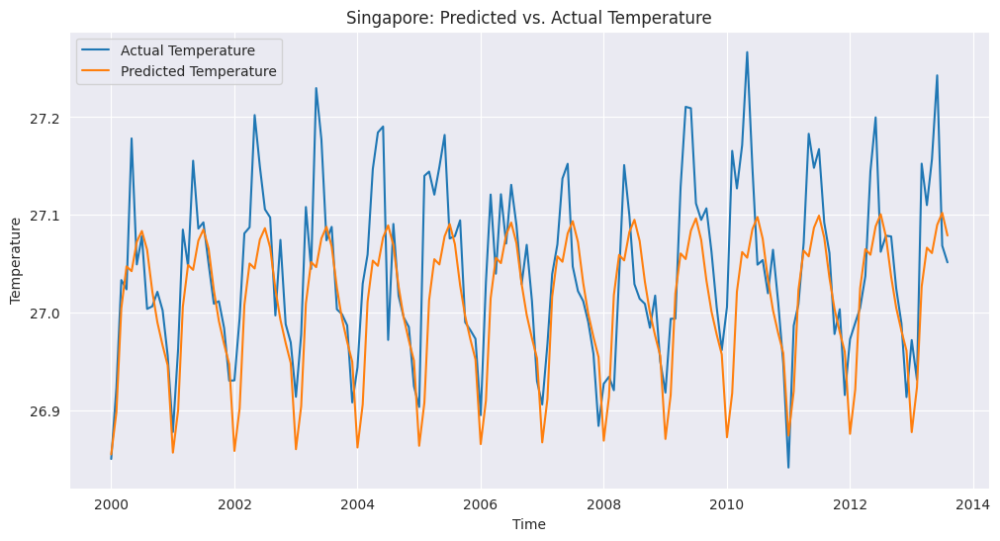

Mean Squared Error (MSE) for Singapore: 0.0050


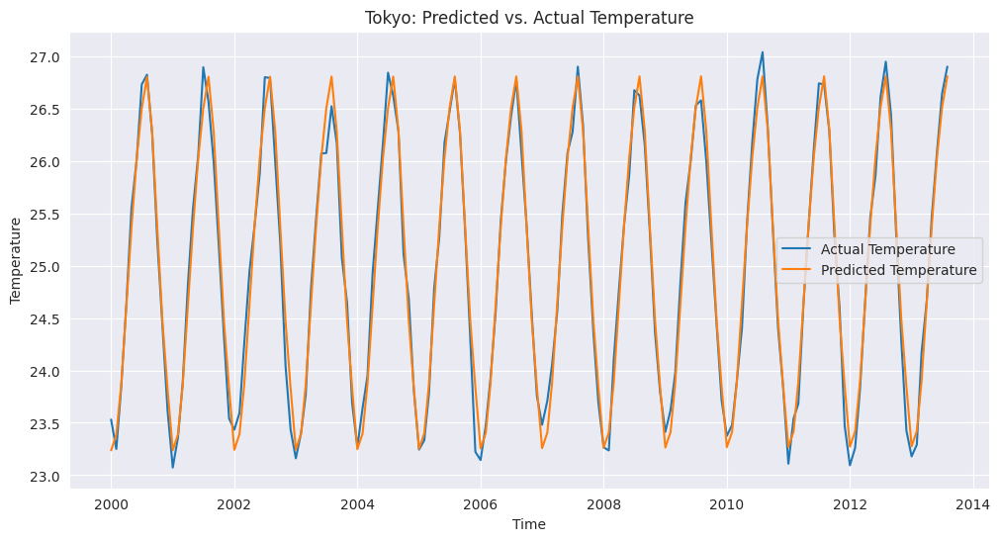

Mean Squared Error (MSE) for Tokyo: 0.0312


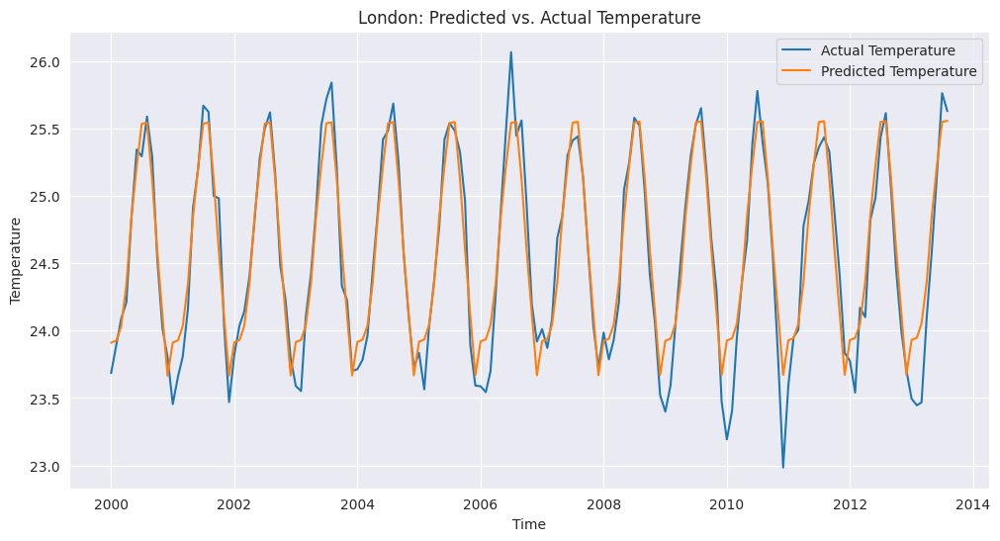

Mean Squared Error (MSE) for London: 0.0459


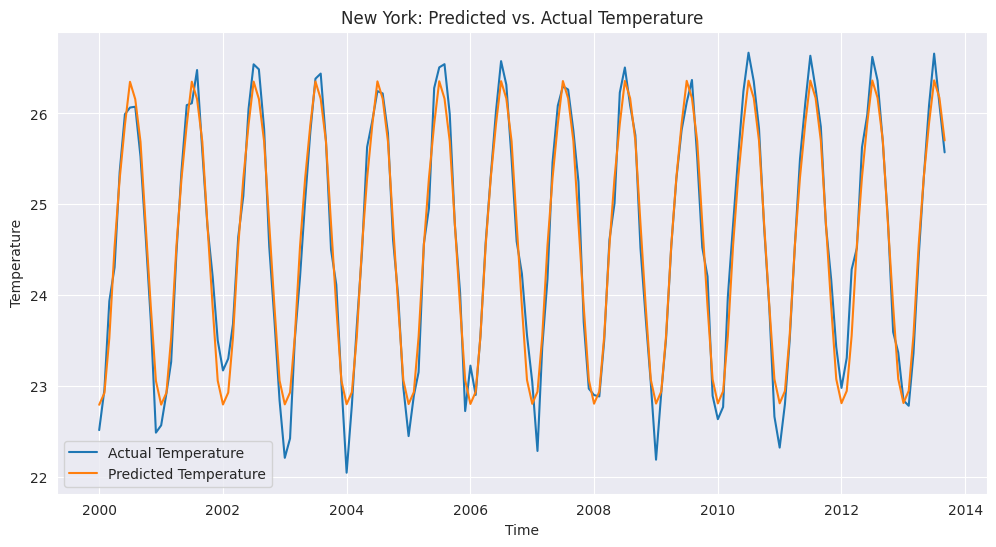

Mean Squared Error (MSE) for New York: 0.0630


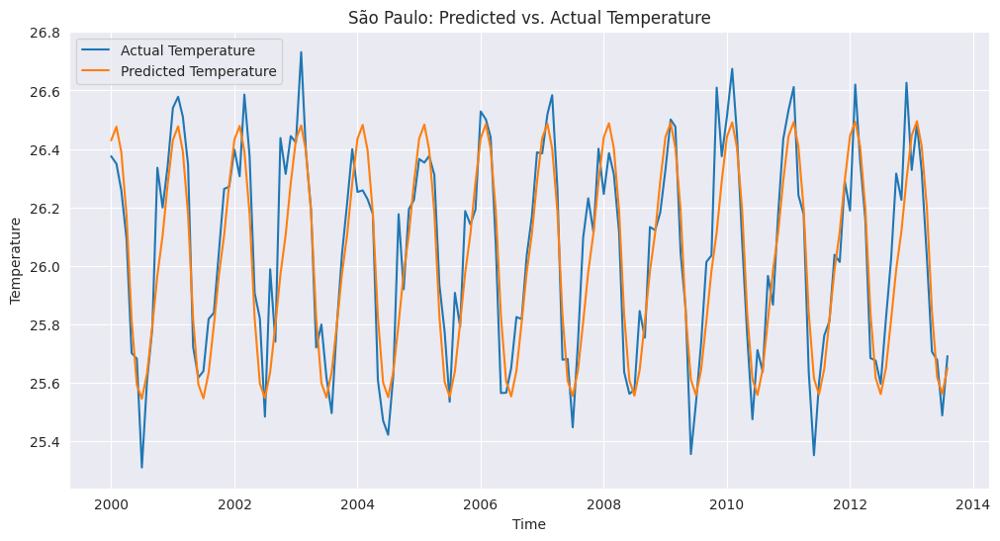

Mean Squared Error (MSE) for São Paulo: 0.0217


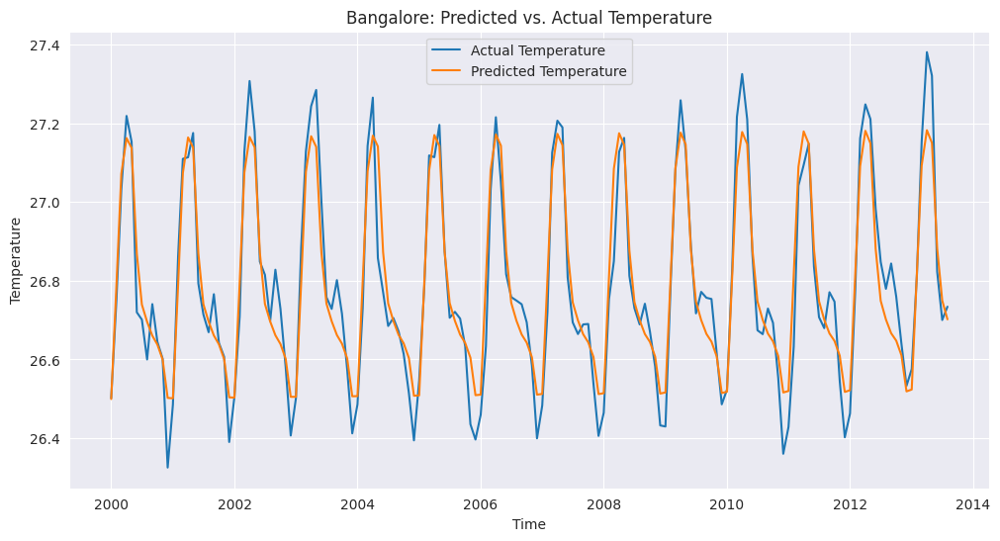

Mean Squared Error (MSE) for Bangalore: 0.0065


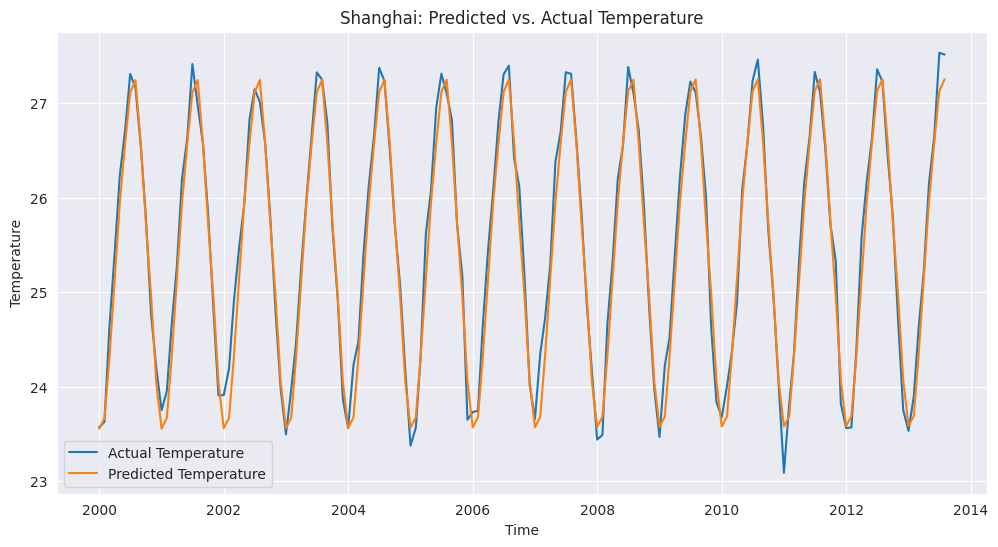

Mean Squared Error (MSE) for Shanghai: 0.0493


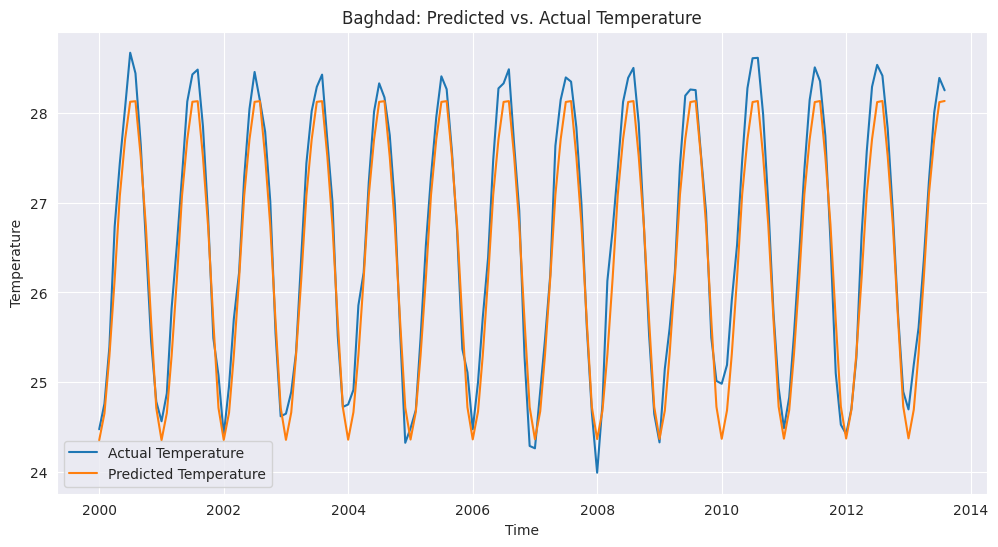

Mean Squared Error (MSE) for Baghdad: 0.0948


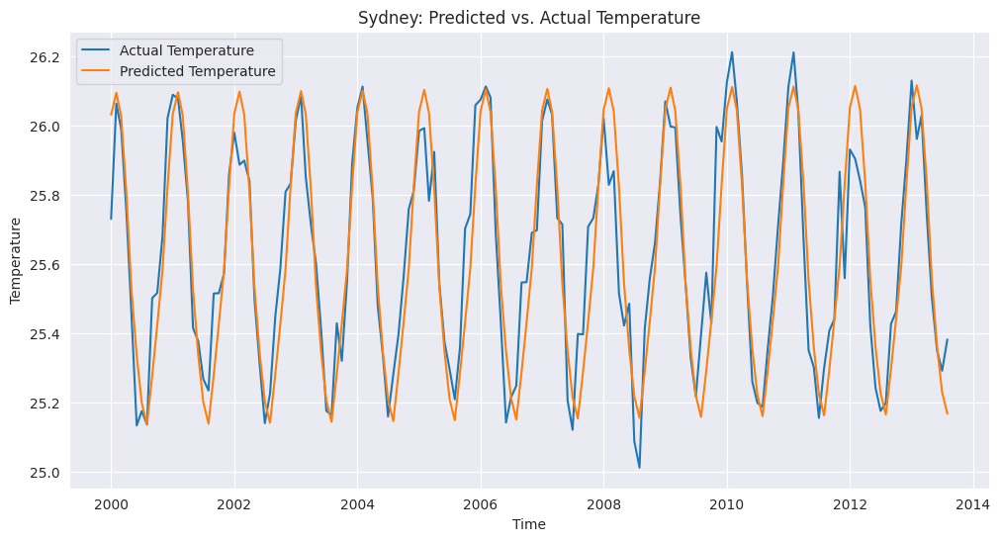

Mean Squared Error (MSE) for Sydney: 0.0161


In [ ]:
for city in plt_cities:
    plot_actual_predictions(city, model, test_df, device)

###4.5.6 Recurrent Neural Network  - RNN (LSTM) (V6) - time-series forecasting

The code below is implementing a time-series forecasting model using recurrent neural networks (RNNs), specifically LSTM and GRU. The TemperatureLSTM and TemperatureGRU classes define the RNN models with different numbers of layers and hidden units. The TemperatureDataset class prepares the data by extracting features and labels from the input data and returning them as PyTorch tensors. The training loop iterates over a specified number of epochs, calling the train and evaluate functions to compute the loss and update the model parameters. The criterion used to optimize the model is mean squared error (MSE), and the optimizer used is Adam.

In [ ]:
data = processed_data.copy()

# Split data into train and test sets based on time
split_date = pd.to_datetime('2000-01-01')
train_df = data[data['dt'] < split_date]
test_df = data[data['dt'] >= split_date]

class TemperatureDataset(Dataset):
    def __init__(self, dataframe, sequence_length):
        self.data = []
        self.sequence_length = sequence_length

        for city in dataframe['City_Encoded'].unique():
            city_data = dataframe[dataframe['City_Encoded'] == city]
            city_data = city_data[['year', 'month', 'City_Encoded', 'Latitude_Direction', 'Longitude_Direction', 'Latitude_Value', 'Longitude_Value', 'S2_Cell_0', 'S2_Cell_1', 'S2_Cell_2', 'S2_Cell_3', 'S2_Cell_4', 'S2_Cell_5', 'S2_Cell_6', 'AverageTemperature']].values.astype(np.float32)
            self.data.append(city_data)

        self.data = np.concatenate(self.data)

    def __len__(self):
        return len(self.data) - self.sequence_length

    def __getitem__(self, idx):
        features = self.data[idx:idx + self.sequence_length, :-1]
        target = self.data[idx + self.sequence_length, -1]
        X = torch.tensor(features, dtype=torch.float)
        y = torch.tensor(target, dtype=torch.float)
        return X, y


sequence_length = 12

train_dataset = TemperatureDataset(train_df, sequence_length)
test_dataset = TemperatureDataset(test_df, sequence_length)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

class TemperatureLSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(TemperatureLSTM, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        _, (hidden, _) = self.lstm(x)
        out = self.fc(hidden[-1])
        return out

class TemperatureLSTM2(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(TemperatureLSTM2, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.relu = nn.ReLU()
        self.fc1 = nn.Linear(hidden_size, 50)
        self.fc2 = nn.Linear(50, 100)
        self.fc3 = nn.Linear(100, output_size)

    def forward(self, x):
        _, (hidden, _) = self.lstm(x)
        out = self.fc1(hidden[-1])
        out = self.relu(out)
        out = self.fc2(out)
        out = self.relu(out)
        out = self.fc3(out)
        return out


class TemperatureGRU(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(TemperatureGRU, self).__init__()
        self.gru = nn.GRU(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        _, hidden = self.gru(x)
        out = self.fc(hidden[-1])
        return out

class TemperatureGRU2(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(TemperatureGRU2, self).__init__()
        self.gru = nn.GRU(input_size, hidden_size, num_layers, batch_first=True)
        self.fc1 = nn.Linear(hidden_size, 50)
        self.fc2 = nn.Linear(50, 100)
        self.fc3 = nn.Linear(100, 200)
        self.fc4 = nn.Linear(200, 100)
        self.fc5 = nn.Linear(100, 50)
        self.fc6 = nn.Linear(50, output_size)

    def forward(self, x):
        _, hidden = self.gru(x)
        out = self.fc1(hidden[-1])
        out = self.fc2(out)
        out = self.fc3(out)
        out = self.fc4(out)
        out = self.fc5(out)
        out = self.fc6(out)
        return out


k = 1
input_size = 14
hidden_size = 128 * k
num_layers = k
output_size = 1

model = TemperatureLSTM(input_size, hidden_size, num_layers, output_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device.type)
model = model.to(device)

n_epochs = 20
train_losses, test_losses = [], []

for epoch in range(n_epochs):
    train_loss = train(model, train_loader, criterion, optimizer, device)
    test_loss = evaluate(model, test_loader, criterion, device)

    train_losses.append(train_loss)
    test_losses.append(test_loss)

    print(f"Epoch: {epoch + 1}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}")


cuda
Epoch: 1, Train Loss: 0.0106, Test Loss: 0.0043
Epoch: 2, Train Loss: 0.0021, Test Loss: 0.0031
Epoch: 3, Train Loss: 0.0013, Test Loss: 0.0026
Epoch: 4, Train Loss: 0.0011, Test Loss: 0.0025
Epoch: 5, Train Loss: 0.0009, Test Loss: 0.0023
Epoch: 6, Train Loss: 0.0008, Test Loss: 0.0023
Epoch: 7, Train Loss: 0.0007, Test Loss: 0.0021
Epoch: 8, Train Loss: 0.0007, Test Loss: 0.0018
Epoch: 9, Train Loss: 0.0006, Test Loss: 0.0020
Epoch: 10, Train Loss: 0.0006, Test Loss: 0.0017
Epoch: 11, Train Loss: 0.0006, Test Loss: 0.0016
Epoch: 12, Train Loss: 0.0006, Test Loss: 0.0017
Epoch: 13, Train Loss: 0.0005, Test Loss: 0.0016
Epoch: 14, Train Loss: 0.0005, Test Loss: 0.0015
Epoch: 15, Train Loss: 0.0005, Test Loss: 0.0019
Epoch: 16, Train Loss: 0.0005, Test Loss: 0.0014
Epoch: 17, Train Loss: 0.0005, Test Loss: 0.0014
Epoch: 18, Train Loss: 0.0005, Test Loss: 0.0015
Epoch: 19, Train Loss: 0.0005, Test Loss: 0.0013
Epoch: 20, Train Loss: 0.0005, Test Loss: 0.0013


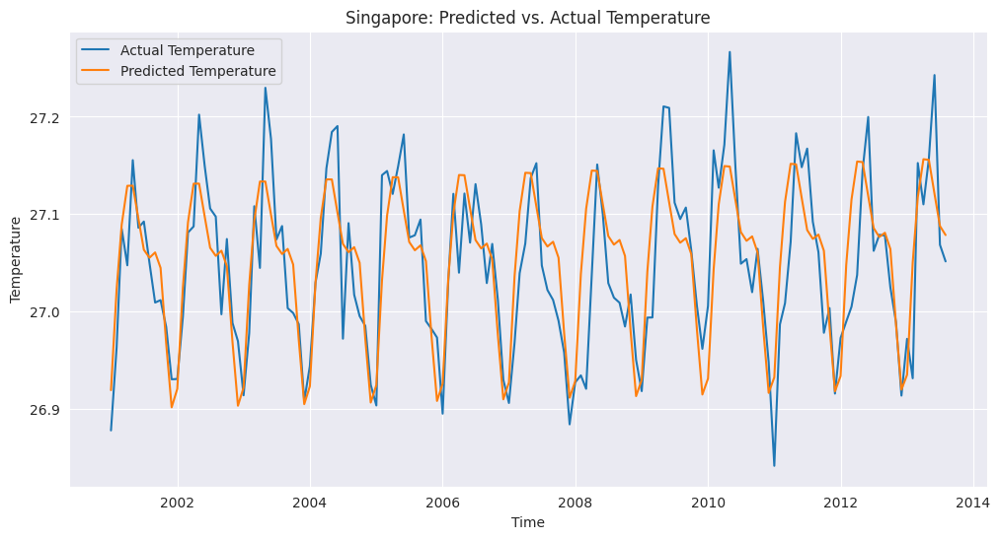

Mean Squared Error (MSE) for Singapore: 0.0030


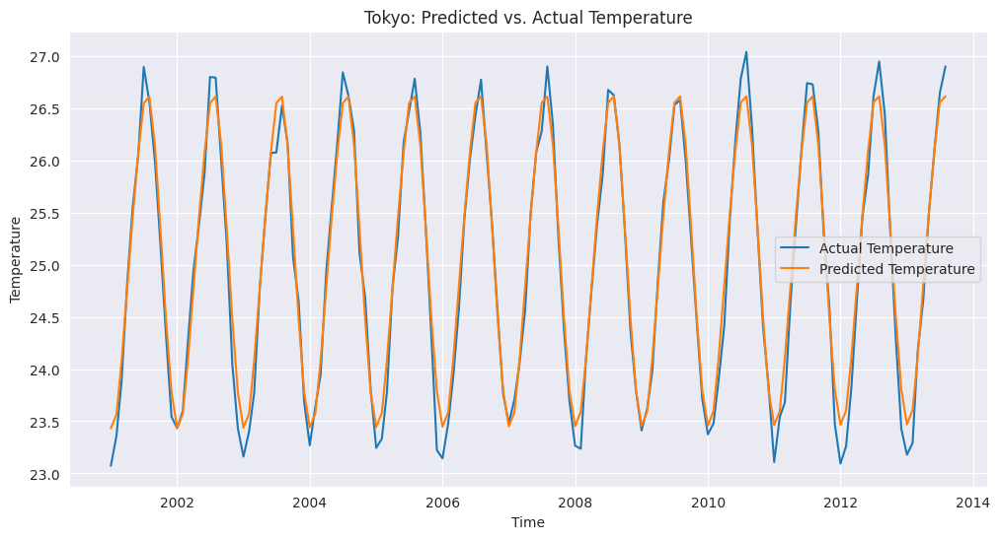

Mean Squared Error (MSE) for Tokyo: 0.0362


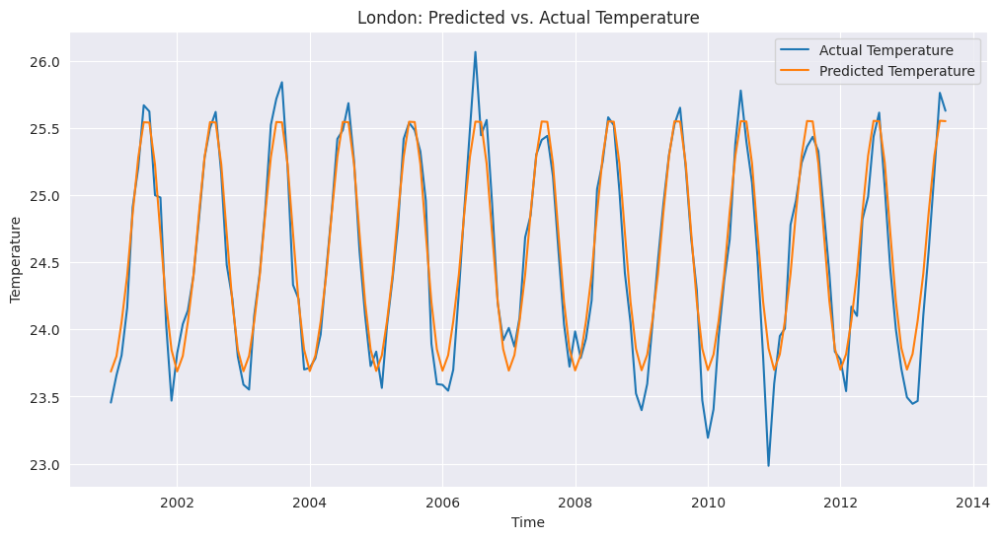

Mean Squared Error (MSE) for London: 0.0421


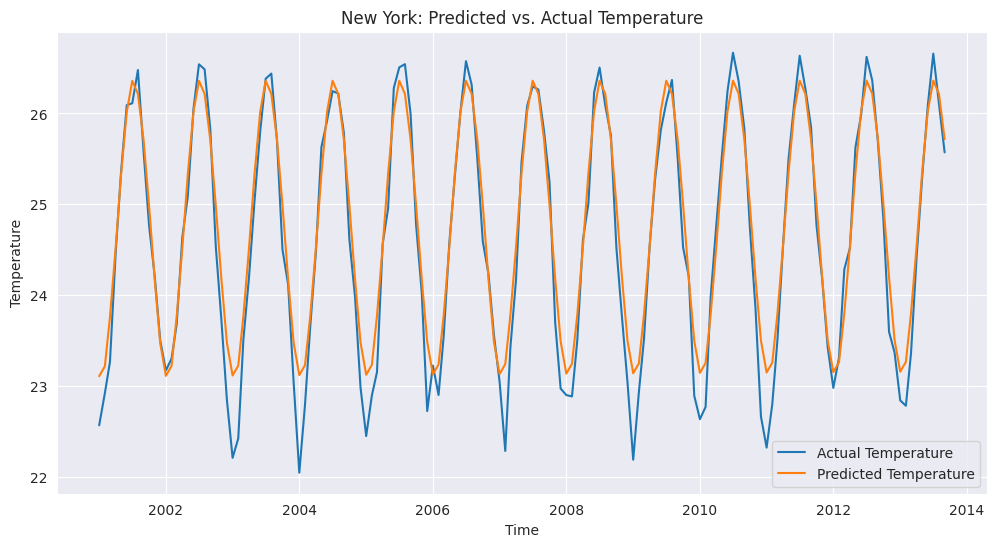

Mean Squared Error (MSE) for New York: 0.1143


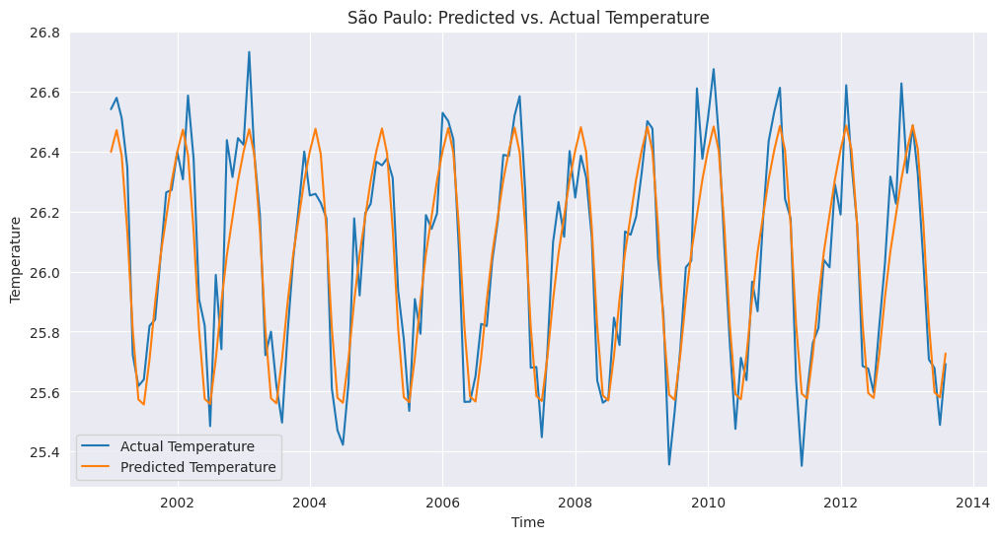

Mean Squared Error (MSE) for São Paulo: 0.0176


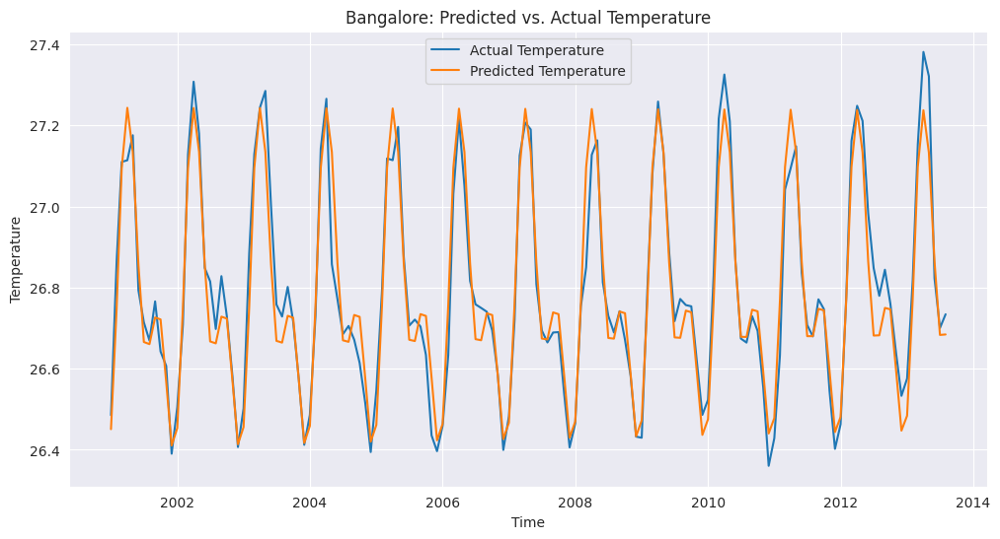

Mean Squared Error (MSE) for Bangalore: 0.0050


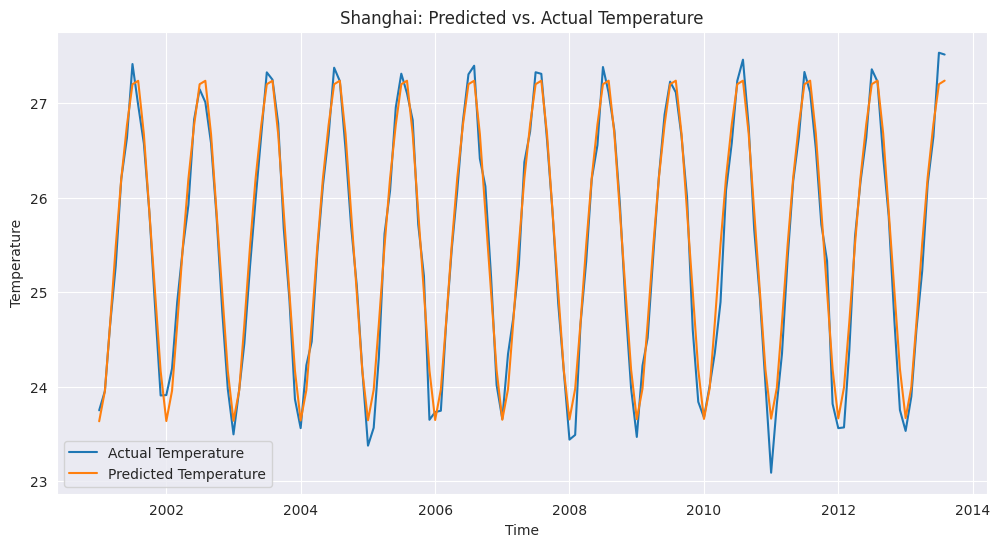

Mean Squared Error (MSE) for Shanghai: 0.0395


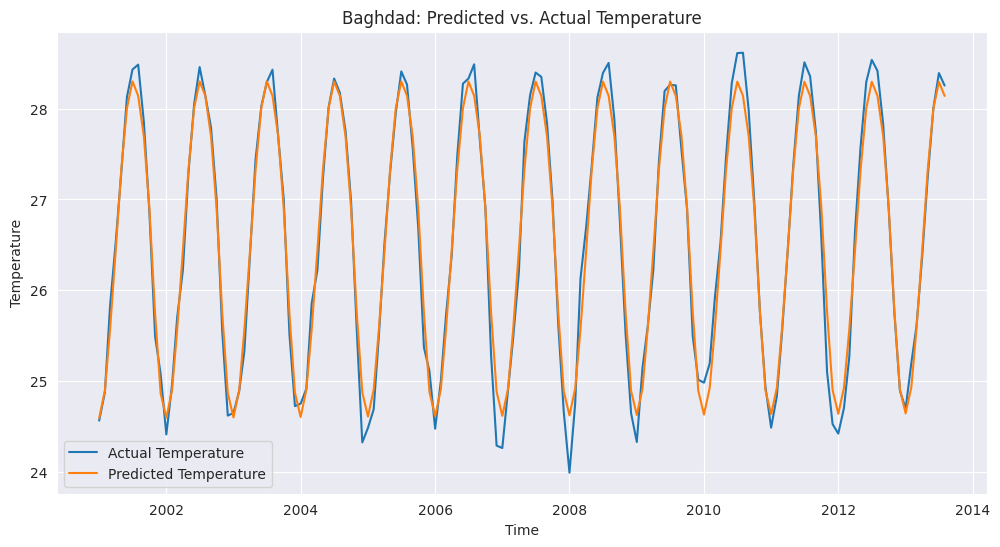

Mean Squared Error (MSE) for Baghdad: 0.0451


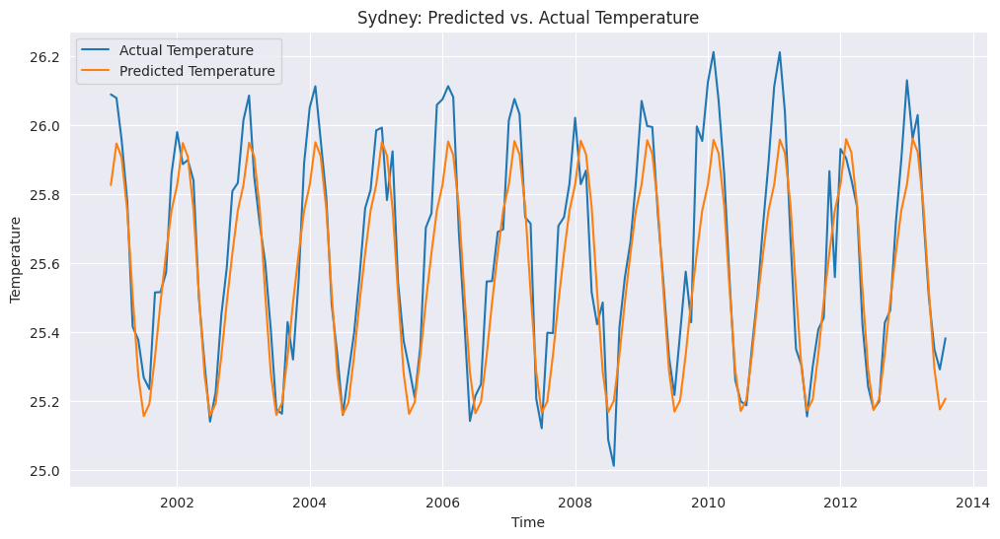

Mean Squared Error (MSE) for Sydney: 0.0167


In [ ]:
for city in plt_cities:
    plot_actual_predictions_rnn(city, model, test_df, device, sequence_length)

###4.5.7 Recurrent Neural Network (GRU) (V7)- time-series forecasting

The code below is splitting a dataset into train and test sets based on time, and then creating a custom PyTorch dataset to be used for training and evaluating a temperature forecasting model using a GRU (gated recurrent unit) neural network. The TemperatureDataset class initializes by taking a dataframe and a sequence length as inputs, and then prepares the data by selecting specific columns, concatenating data from different cities, and converting the data to PyTorch tensors. The TemperatureGRU class defines the GRU neural network architecture, and takes in the input size, hidden size, number of layers, and output size as inputs. The model is then trained using the train and test datasets, with the criterion being the mean squared error (MSE) loss and the optimizer being Adam with a learning rate of 0.001. The training and testing losses for each epoch are printed out to monitor the model's performance.

In [ ]:
data = processed_data.copy()

# Split data into train and test sets based on time
split_date = pd.to_datetime('2000-01-01')
train_df = data[data['dt'] < split_date]
test_df = data[data['dt'] >= split_date]

class TemperatureDataset(Dataset):
    def __init__(self, dataframe, sequence_length):
        self.data = []
        self.sequence_length = sequence_length

        for city in dataframe['City_Encoded'].unique():
            city_data = dataframe[dataframe['City_Encoded'] == city]
            city_data = city_data[['year', 'month', 'City_Encoded', 'Latitude_Direction', 'Longitude_Direction', 'Latitude_Value', 'Longitude_Value', 'S2_Cell_0', 'S2_Cell_1', 'S2_Cell_2', 'S2_Cell_3', 'S2_Cell_4', 'S2_Cell_5', 'S2_Cell_6', 'AverageTemperature']].values.astype(np.float32)
            self.data.append(city_data)

        self.data = np.concatenate(self.data)

    def __len__(self):
        return len(self.data) - self.sequence_length

    def __getitem__(self, idx):
        features = self.data[idx:idx + self.sequence_length, :-1]
        target = self.data[idx + self.sequence_length, -1]
        X = torch.tensor(features, dtype=torch.float)
        y = torch.tensor(target, dtype=torch.float)
        return X, y


sequence_length = 12

train_dataset = TemperatureDataset(train_df, sequence_length)
test_dataset = TemperatureDataset(test_df, sequence_length)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

class TemperatureGRU(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(TemperatureGRU, self).__init__()
        self.gru = nn.GRU(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        _, hidden = self.gru(x)
        out = self.fc(hidden[-1])
        return out

k = 1
input_size = 14
hidden_size = 128 * k
num_layers = k
output_size = 1

model = TemperatureGRU(input_size, hidden_size, num_layers, output_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device.type)
model = model.to(device)

n_epochs = 20
train_losses, test_losses = [], []

for epoch in range(n_epochs):
    train_loss = train(model, train_loader, criterion, optimizer, device)
    test_loss = evaluate(model, test_loader, criterion, device)

    train_losses.append(train_loss)
    test_losses.append(test_loss)

    print(f"Epoch: {epoch + 1}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}")


cuda
Epoch: 1, Train Loss: 0.0092, Test Loss: 0.0046
Epoch: 2, Train Loss: 0.0022, Test Loss: 0.0036
Epoch: 3, Train Loss: 0.0017, Test Loss: 0.0029
Epoch: 4, Train Loss: 0.0012, Test Loss: 0.0024
Epoch: 5, Train Loss: 0.0009, Test Loss: 0.0020
Epoch: 6, Train Loss: 0.0007, Test Loss: 0.0019
Epoch: 7, Train Loss: 0.0007, Test Loss: 0.0018
Epoch: 8, Train Loss: 0.0006, Test Loss: 0.0019
Epoch: 9, Train Loss: 0.0006, Test Loss: 0.0016
Epoch: 10, Train Loss: 0.0006, Test Loss: 0.0018
Epoch: 11, Train Loss: 0.0006, Test Loss: 0.0016
Epoch: 12, Train Loss: 0.0005, Test Loss: 0.0016
Epoch: 13, Train Loss: 0.0005, Test Loss: 0.0016
Epoch: 14, Train Loss: 0.0005, Test Loss: 0.0015
Epoch: 15, Train Loss: 0.0005, Test Loss: 0.0016
Epoch: 16, Train Loss: 0.0005, Test Loss: 0.0015
Epoch: 17, Train Loss: 0.0005, Test Loss: 0.0019
Epoch: 18, Train Loss: 0.0005, Test Loss: 0.0014
Epoch: 19, Train Loss: 0.0005, Test Loss: 0.0014
Epoch: 20, Train Loss: 0.0005, Test Loss: 0.0014


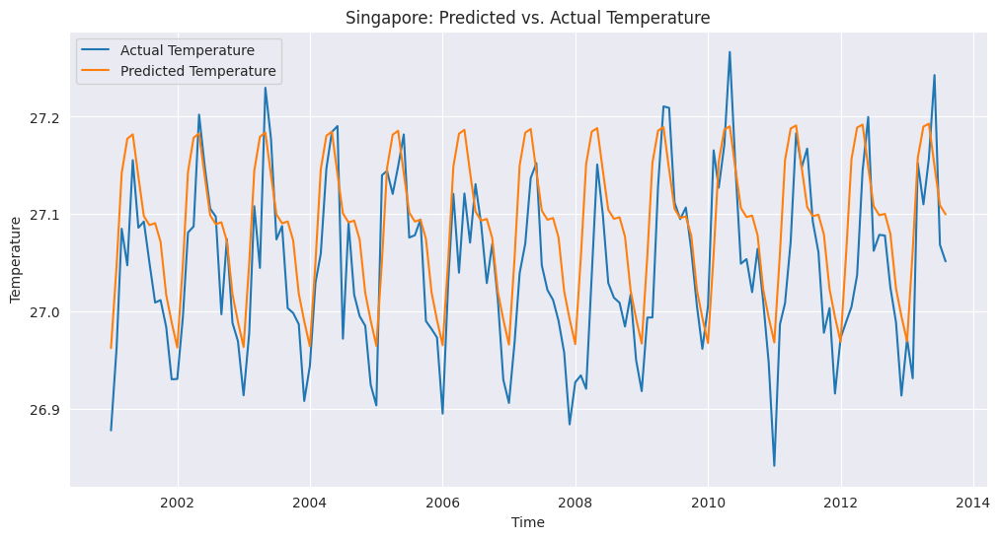

Mean Squared Error (MSE) for Singapore: 0.0047


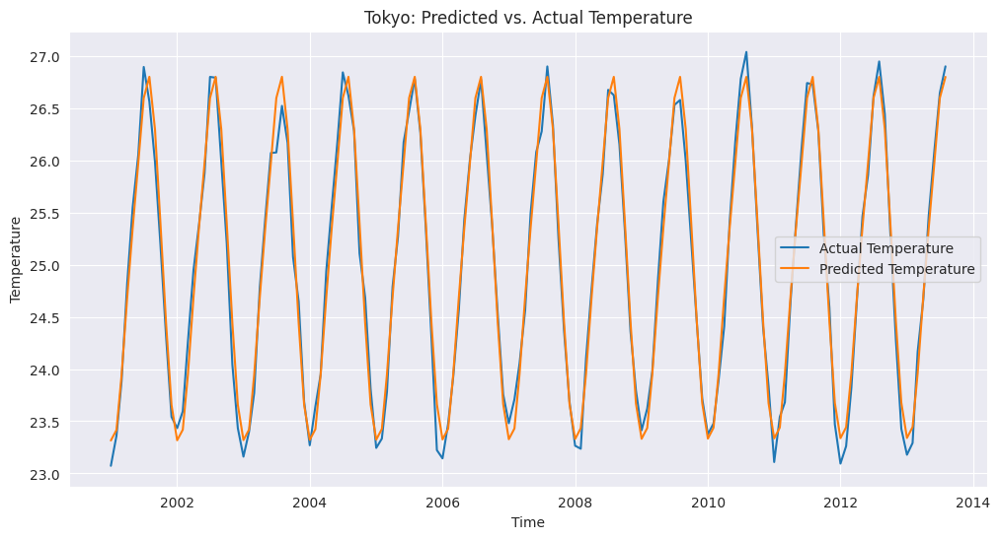

Mean Squared Error (MSE) for Tokyo: 0.0283


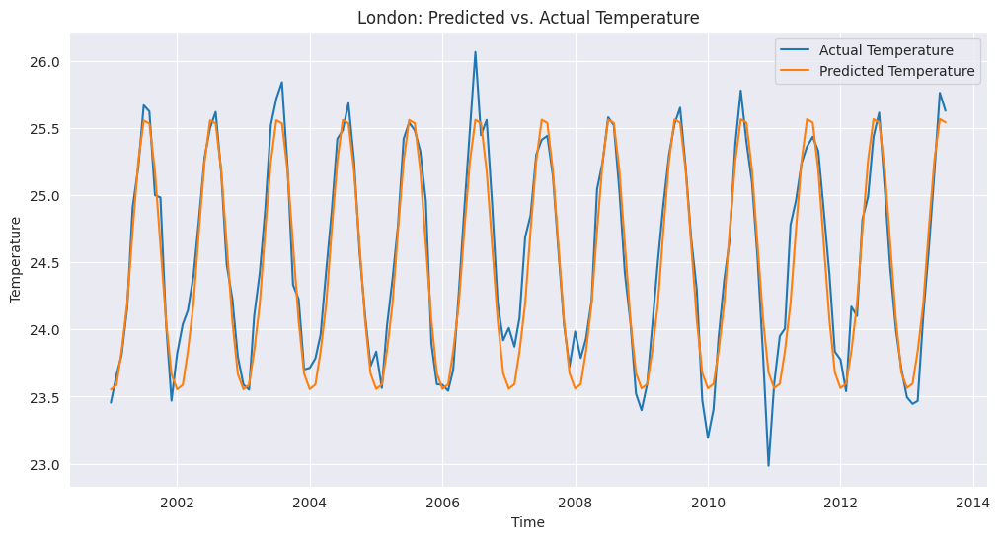

Mean Squared Error (MSE) for London: 0.0402


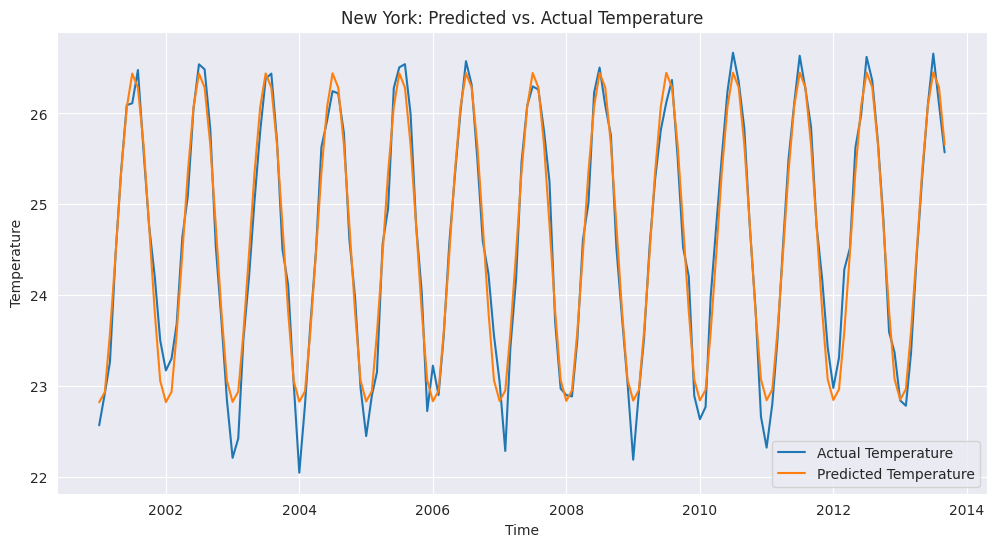

Mean Squared Error (MSE) for New York: 0.0596


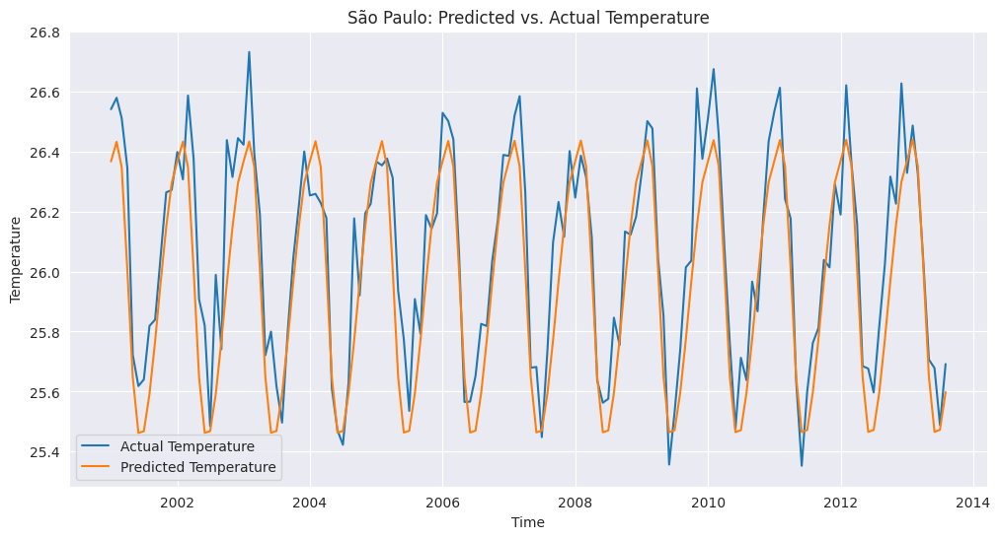

Mean Squared Error (MSE) for São Paulo: 0.0279


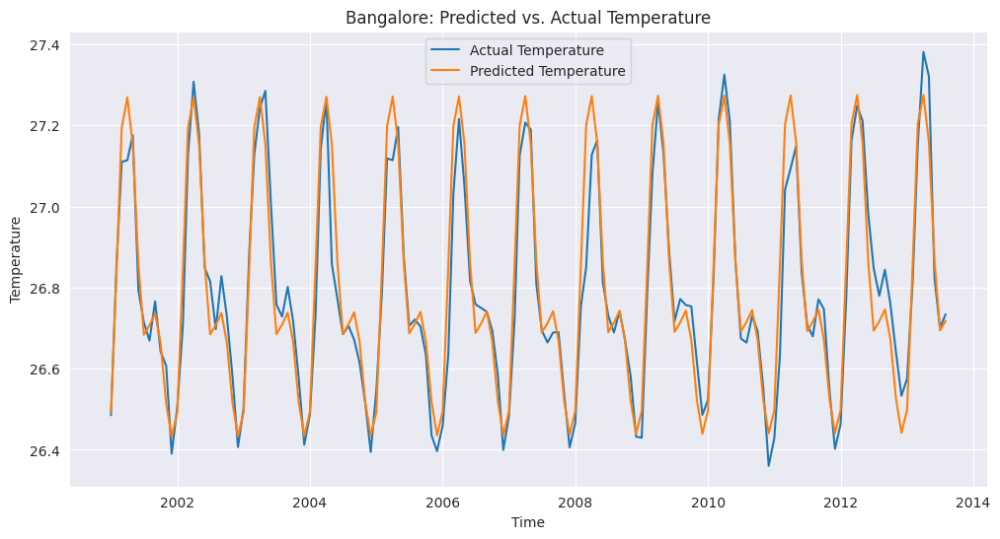

Mean Squared Error (MSE) for Bangalore: 0.0064


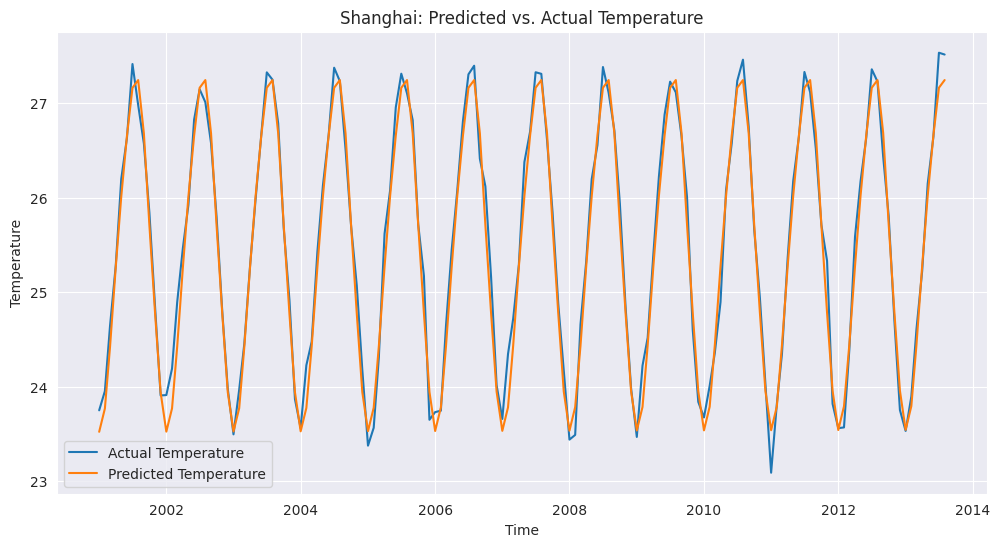

Mean Squared Error (MSE) for Shanghai: 0.0380


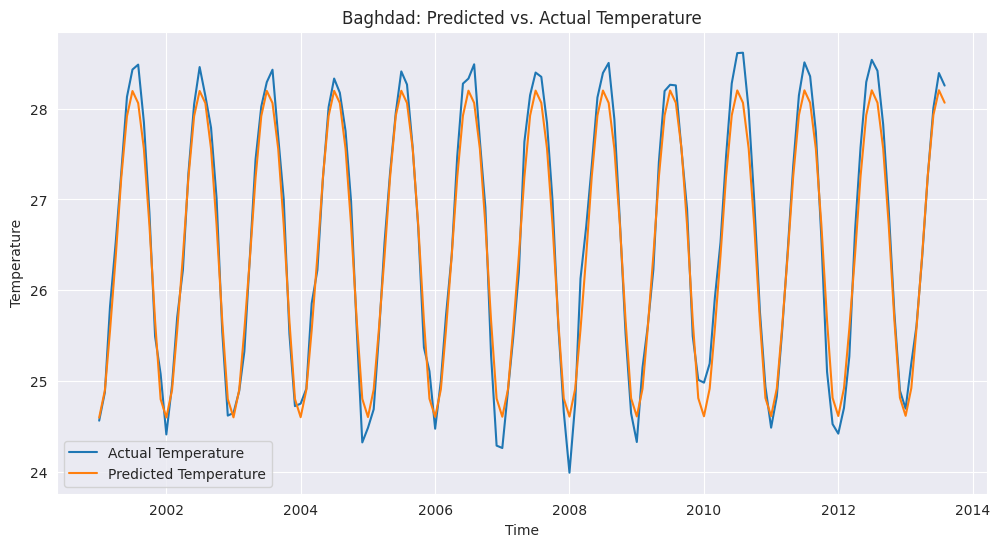

Mean Squared Error (MSE) for Baghdad: 0.0551


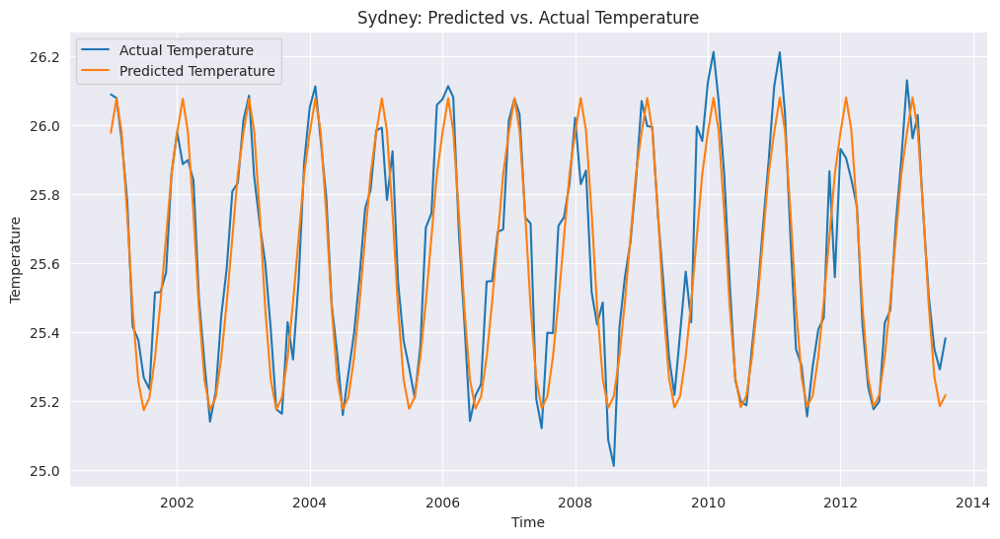

Mean Squared Error (MSE) for Sydney: 0.0114


In [ ]:
for city in plt_cities:
    plot_actual_predictions_rnn(city, model, test_df, device, sequence_length)

#5. Identifying Extremes
The peak temperature of the planet is a good indicator of the danger of climate change – while average temperatures are increasing globally, it is the increase of the hottest temperatures that cause the most damage, as they are the most outside of the range of species on Earth can adapt to or tolerate.

In this section, we'll look at the rates at which annual maximum temperatures are rising, and compare that to the overall rate of warming.

First, let's limit the global temperature data to the 1900s and onward; where the impacts of the Industrial Revolution have started to influence the normal climate of the planet.

From there, find the maximum temperature for each year, and then find a rolling average over decades to smooth out typical fluctuations from year to year. This should make the visualization a bit clearer.

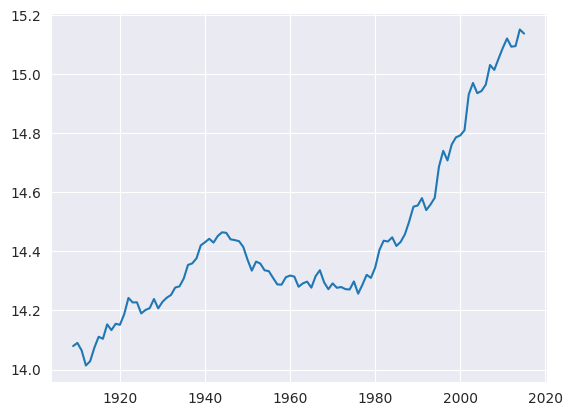

In [ ]:
# Identify the hottest tempertaure in the data for each year, globally (from 1850 onward)
max_temps = Temps[Temps['year'] >= 1900]
# find the max temperature for each year
max_temps = max_temps.groupby('year')['LandAverageTemperature'].max().reset_index()
# smooth the data using a rolling window
max_temps['LandAverageTemperature'] = max_temps['LandAverageTemperature'].rolling(10).mean()
# drop missing values
max_temps = max_temps.dropna()

# plot the data
plt.plot(max_temps['year'], max_temps['LandAverageTemperature'])

##5.1 Linear Modeling
Next, let's find a linear model for this warming, and see how well it fits the data. Is the planet warming steadily?

In [ ]:
# Identify trendline (linear) for the data
from scipy.stats import linregress
slope, intercept, r_value, p_value, std_err = linregress(max_temps['year'], max_temps['LandAverageTemperature'])

# print the equation
print(f'y = {slope:.6f}x + {intercept:.6f}')

# calculate the mean squared error
mse = mean_squared_error(max_temps['LandAverageTemperature'], max_temps['year'] * slope + intercept)
print(f'Mean Squared Error: {mse}')

# r squared value
print(f'R Squared: {r_value ** 2}')

y = 0.007723x + -0.714242
Mean Squared Error: 0.02327375411860322
R Squared: 0.7096958787346193


The linear model above doesn't appear to fit the data very well (this may have been apparent simply looking at the raw data). However the slope of the line will be useful in comparing to average temperature increases shortly.

## 5.2 Polynomial Modeling

Now, let's try a polynomial model; on visual inspection, this should prove a much more accurate model.

In [ ]:
# Identify trendline (polynomial) for the data
from scipy.optimize import curve_fit
def func(x, a, b, c, d):
    return a * x**3 + b * x**2 + c * x + d
# fit the curve
popt, pcov = curve_fit(func, max_temps['year'], max_temps['LandAverageTemperature'])

# calculate the mean squared error
mse = mean_squared_error(max_temps['LandAverageTemperature'], func(max_temps['year'], *popt))
print(f'Mean Squared Error: {mse}')

# r squared value
ss_res = np.sum((max_temps['LandAverageTemperature'] - func(max_temps['year'], *popt)) ** 2)
ss_tot = np.sum((max_temps['LandAverageTemperature'] - np.mean(max_temps['LandAverageTemperature'])) ** 2)
r_squared = 1 - (ss_res / ss_tot)
print(f'R Squared: {r_squared}')

Mean Squared Error: 0.00394006866339773
R Squared: 0.9508537314081762


Success! This model fits the data much better. We'll have a look in the next cell.

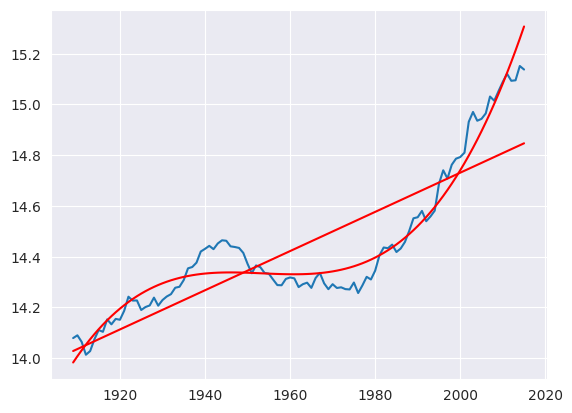

In [ ]:
# plot the trendlines
plt.plot(max_temps['year'], max_temps['LandAverageTemperature'])
plt.plot(max_temps['year'], max_temps['year'] * slope + intercept, 'r-')
plt.plot(max_temps['year'], func(max_temps['year'], *popt), 'r-')
plt.show()

Now we compare this rate of change to that of the average land temperature. Repeat the same steps as with the maximum temperatures for each year (averaged over a rolling decade).

In [ ]:
# Identify the average tempertaure in the data for each year, globally (from 1900 onward)
avg_temps = Temps[Temps['year'] >= 1900]
# smooth the data using a rolling window grouped by year
avg_temps = avg_temps.groupby('year')['LandAverageTemperature'].mean().reset_index()
# smooth the data using a rolling window
avg_temps['LandAverageTemperature'] = avg_temps['LandAverageTemperature'].rolling(10).mean()
# drop missing values
avg_temps = avg_temps.dropna()

In [ ]:
# Identify trendline (linear) for the data
from scipy.stats import linregress
slope, intercept, r_value, p_value, std_err = linregress(avg_temps['year'], avg_temps['LandAverageTemperature'])

# calculate the mean squared error
mse = mean_squared_error(avg_temps['LandAverageTemperature'], avg_temps['year'] * slope + intercept)
print(f'Mean Squared Error: {mse}')

# r squared value
print(f'R Squared: {r_value ** 2}')

Mean Squared Error: 0.022786616256020444
R Squared: 0.8194767186182427


In [ ]:
# fit the curve
popt_avg_temps, pcov_avg_temps = curve_fit(func, avg_temps['year'], avg_temps['LandAverageTemperature'])

# print the equation
print(f'y = {popt_avg_temps[0]:.6f}x^3 + {popt_avg_temps[1]:.6f}x^2 + {popt_avg_temps[2]:.6f}x + {popt_avg_temps[3]:.6f}')

# calculate the mean squared error
mse_avg_temps = mean_squared_error(avg_temps['LandAverageTemperature'], func(avg_temps['year'], *popt_avg_temps))
print(f'Mean Squared Error: {mse_avg_temps}')

# r squared value
ss_res_avg_temps = np.sum((avg_temps['LandAverageTemperature'] - func(avg_temps['year'], *popt_avg_temps)) ** 2)
ss_tot_avg_temps= np.sum((avg_temps['LandAverageTemperature'] - np.mean(avg_temps['LandAverageTemperature'])) ** 2)
r_squared_avg_temps = 1 - (ss_res_avg_temps / ss_tot_avg_temps)
print(f'R Squared: {r_squared}')

y = 0.000005x^3 + -0.028445x^2 + 55.623827x + -36250.006189
Mean Squared Error: 0.0036208932758450218
R Squared: 0.9508537314081762


Now we have some numbers to compare. From a simplistic perspective, the linear model shows that peak temperatures are increasing almost .003º/year faster than average temperatures. The polynomial coefficients are a bit more complicated to interpret, but we can see from the strongest coefficient (tied to the year cubed) that over the next century, the peak temperature would be predicted to rise nearly a fully degree more than the average. Again, when climate change mitigation goals are looking to prevent temperature rise of 2ºC (of which we've already surpassed 1.5º), seeing that peak temperatures might rise a full degree above what our targets might be oriented toward indicates that we might not be preventing the most dire impacts.

# 6. Localization of Impact

One of the insidious parts of climate change is that it isn't impacting all areas of the planet equally. From the floods in Pakistan to the wildfires in California, the effects of climate change are felt unequally by the human population causing the change. In this section, we'll examine where temperatures are rising most, and see which countries are most impacted.

## 6.1 Net Change for each country by decade

First, we'll look at the net change in temperature for each country from the beginning of the 20th century to the most recent decade. Take the average temperature for those two respective decades, and then merge them back into one dataframe where the difference in temperature can be calculated.

In [ ]:
# Identify the countries most impacted by rising temperatures
avg_temps_in_50s = TempsByCountry[(TempsByCountry['year'] >= 1910) & (TempsByCountry['year'] < 1920)]
avg_temps_in_50s = avg_temps_in_50s.groupby('Country')['AverageTemperature'].mean().reset_index()
avg_temps_in_50s = avg_temps_in_50s.dropna()

avg_temps_in_10s = TempsByCountry[(TempsByCountry['year'] >= 2010) & (TempsByCountry['year'] < 2020)]
avg_temps_in_10s = avg_temps_in_10s.groupby('Country')['AverageTemperature'].mean().reset_index()
avg_temps_in_10s = avg_temps_in_10s.dropna()

# merge the dataframes
avg_temps_by_country = pd.merge(avg_temps_in_50s, avg_temps_in_10s, on='Country', suffixes=('_50s', '_10s'))

# calculate the difference in average temperature
avg_temps_by_country['Difference'] = avg_temps_by_country['AverageTemperature_10s'] - avg_temps_by_country['AverageTemperature_50s']

avg_temps_by_country = avg_temps_by_country.sort_values(by='Difference', ascending=False)
avg_temps_by_country

,Country,AverageTemperature_50s,AverageTemperature_10s,Difference
195,Svalbard And Jan Mayen,-8.193633,-5.107318,3.086315
80,Greenland,-19.216850,-16.299841,2.917009
35,Canada,-5.473442,-2.627289,2.846153
166,Russia,-5.958725,-3.636182,2.322543
96,Iran,17.343192,19.543432,2.200240
...,...,...,...,...
225,Zimbabwe,20.932342,21.522864,0.590522
26,Botswana,21.687567,22.264318,0.576752
99,Isle Of Man,9.299525,9.784205,0.484680
54,Denmark,7.961742,8.403818,0.442077


There are many countries in this list, so let's look at the 10 most and 10 least impacted countries.

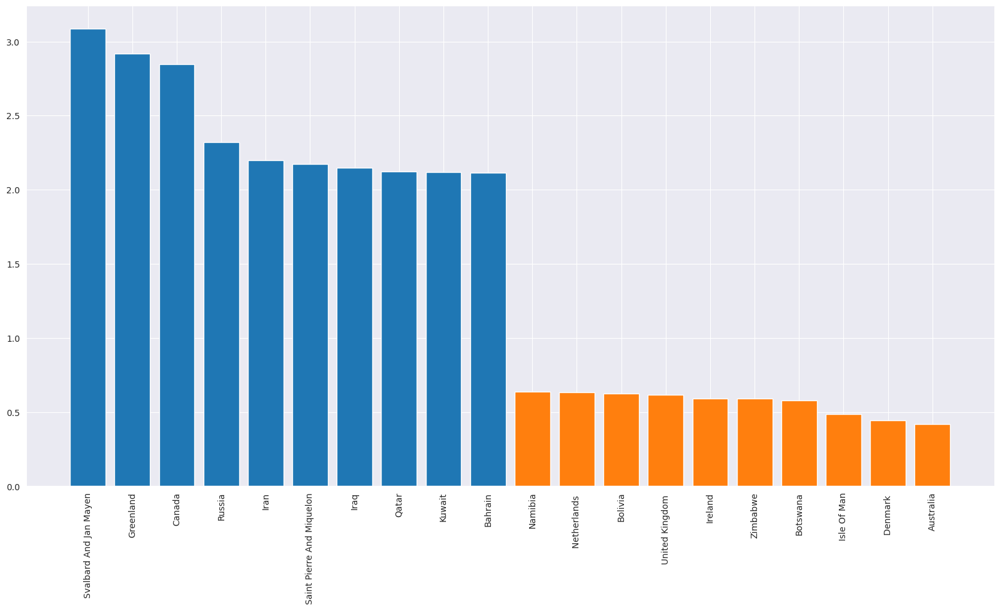

In [ ]:
# plot the top 10 countries and bottom 10 countries
plt.figure(figsize=(20, 10))
plt.bar(avg_temps_by_country['Country'].head(10), avg_temps_by_country['Difference'].head(10))
plt.bar(avg_temps_by_country['Country'].tail(10), avg_temps_by_country['Difference'].tail(10))
plt.xticks(rotation=90)
plt.show()

Geographically, where are they located?

In [ ]:
# plot on a map
import plotly.express as px

fig = px.choropleth(
    avg_temps_by_country,
    locations="Country",
    locationmode="country names",
    color="Difference",
    hover_name="Country",
    projection="natural earth",
    color_continuous_scale="tropic",
    range_color=(-5, 5),
    title="Average Temperature Difference by Country",
    width=1400, height=800
)

fig.show()

From this map we can see that temperatures appear to have risen most in the the northern latitudes. But to really understand the human impact, we should investigate the resources of the countries most impacted by the changing temperatures. Is there any correlation?

Let's load a new dataset with Gross Domestic Product data from around the globe.

In [ ]:
# load the gdp data
# for colab
GDPByCountry = pd.read_csv('/content/API_NY.GDP.MKTP.CD_DS2_en_csv_v2_4413598.csv')

# for local
# GDPByCountry = pd.read_csv('./API_NY.GDP.MKTP.CD_DS2_en_csv_v2_4413598.csv')

In [ ]:
GDPByCountry.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Aruba,ABW,GDP (current US$),NY.GDP.MKTP.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,2.615084e+09,2.727933e+09,2.791061e+09,2.963128e+09,2.983799e+09,3.092179e+09,3.202235e+09,3.310056e+09,2.496648e+09,NaN
1,Africa Eastern and Southern,AFE,GDP (current US$),NY.GDP.MKTP.CD,2.129059e+10,2.180847e+10,2.370702e+10,2.821004e+10,2.611879e+10,2.968217e+10,...,9.730430e+11,9.839370e+11,1.003680e+12,9.242530e+11,8.823550e+11,1.020650e+12,9.910220e+11,9.975340e+11,9.216460e+11,1.082100e+12
2,Afghanistan,AFG,GDP (current US$),NY.GDP.MKTP.CD,5.377778e+08,5.488889e+08,5.466667e+08,7.511112e+08,8.000000e+08,1.006667e+09,...,1.990732e+10,2.014640e+10,2.049713e+10,1.913421e+10,1.811656e+10,1.875347e+10,1.805323e+10,1.879945e+10,2.011614e+10,NaN
3,Africa Western and Central,AFW,GDP (current US$),NY.GDP.MKTP.CD,1.040414e+10,1.112789e+10,1.194319e+10,1.267633e+10,1.383837e+10,1.486223e+10,...,7.275700e+11,8.207930e+11,8.649900e+11,7.607340e+11,6.905460e+11,6.837490e+11,7.416900e+11,7.945430e+11,7.844460e+11,8.358080e+11
4,Angola,AGO,GDP (current US$),NY.GDP.MKTP.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,1.249980e+11,1.334020e+11,1.372440e+11,8.721929e+10,4.984049e+10,6.897276e+10,7.779294e+10,6.930910e+10,5.361907e+10,7.254699e+10


Here we can see a few issues with this data for our purposes.
1. The data goes back quite a ways; the world is a very different place now than it was in the 60s. In our case we only really need a single value for each country as a proxy for their resources available to combat the effects of climate change.
2. Each year is a column rather than a row; we'll need to transform this dataset in order to aggregate over a representative timeframe.
3. Not every Country Name will match identically with our existing climate data


To address issues 1 and 2, let's select only the most recent full decade and then melt the columns to rows.

In [ ]:
# Only look at 2010 to 2019
GDPByCountry = GDPByCountry[['Country Name', 'Country Code', '2010', '2011', '2012', '2013', '2014', '2015',
                                '2016', '2017', '2018', '2019']]
GDPByCountry = pd.melt(GDPByCountry, id_vars=['Country Name', 'Country Code'], var_name='year', value_name='GDP')
GDPByCountry.dropna(inplace=True)

From there we can average the GDP and recieve our single value proxy!

In [ ]:
AvgGDPByCountry = GDPByCountry.groupby('Country Name')['GDP'].mean().reset_index()
AvgGDPByCountry.head()

,Country Name,GDP
0,Afghanistan,1.870696e+10
1,Africa Eastern and Southern,9.601370e+11
2,Africa Western and Central,7.347194e+11
3,Albania,1.299679e+10
4,Algeria,1.836632e+11


Now, we can join this data with our climate data. Before joining, let's see how many countries are represented in eacah dataset so we can compare how many matches were made after joining.

In [ ]:
AvgGDPByCountry['Country Name'].count()

261

In [ ]:
avg_temps_by_country['Country'].count()

227

In [ ]:
# join with the temperature difference data 
AvgGDPByCountryPlusGDP = pd.merge(AvgGDPByCountry, avg_temps_by_country, left_on='Country Name', right_on='Country')

In [ ]:
AvgGDPByCountryPlusGDP['Country Name'].count()

161

Not terrible - we lost about a third of the countries, but still have a sizable representative sample that should help us get an understanding of the distribution of climate impact.

## 6.2 Scatter plot - distribution of climate impact

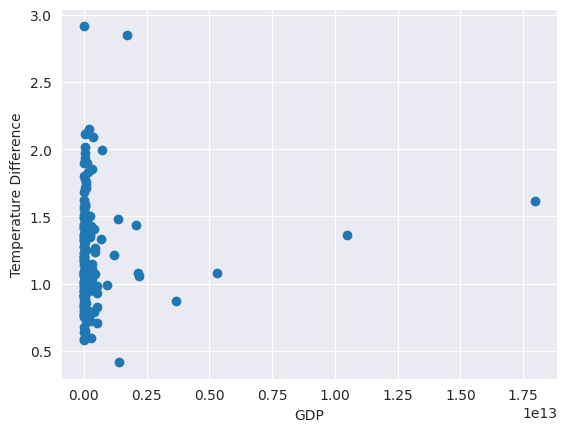

In [ ]:
# plot the data
plt.scatter(AvgGDPByCountryPlusGDP['GDP'], AvgGDPByCountryPlusGDP['Difference'])
plt.xlabel('GDP')
plt.ylabel('Temperature Difference')
plt.show()

Clearly there's not much correlation between the absolute temperature change over the last century and the current GDP of a country – this is expected since climate change doesn't only impact areas that produce the most emissions; it's a truly global issue. However, this chart does display something revealing. A significant number of countries with small GDPs already have experienced temperature changes of greater than 1.5ºC over the last century.

In [ ]:
# Count the number of countries with a greater than 1.5 degree increase in temperature and less than 100 billion GDP
AvgGDPByCountryPlusGDP[(AvgGDPByCountryPlusGDP['Difference'] > 1.5) & (AvgGDPByCountryPlusGDP['GDP'] < 100000000000)]['Country Name'].count()

20

20 countries have experienced enough temperature change over the last century to significantly impact their climiate, while having less than 100 billion in annual GDP with which to address the environmental impacts of such change. 
Global targets and goals have been oriented around keeping temperatures below 1.5ºC above pre-industrial temperatures, and yet these countries are already above this margin and likely lack the ability to rigorously respond to the impacts this change will bring.

#7. Conclusions, Challenges, and Future Directions

In the last two sections - Identifying Extremes and Localization of Impact - we spoke to some of the affects and interpretations of our analysis of this climate dataset. Temperatures have risen overall since 1750 AD - this is indisputable. What this means, however, requires sophisticated correlative study and further in-depth analysis of impact and rate of progression. 

The changing climate is cause for significant concern. Some of our models visualize a more dire circumstance than others - but each shows a meaningful trend toward a growing climate crisis. Further study might indicate which countries are doing meaningful work in these areas in relation to shifting temperatures, and which countries are lagging behind. 

Data visualization, in particular, has a bigger impact on populations than raw datasets do - they help us better understand complex information by presenting it in an easily digestible format. We are more likely to pay attention and retain information when visualizations like what we have implemented above are used. Data becomes more relatable - and hopefully, as a result, more effective in changing minds and influencing action. But, with great power comes great responsibility - in working to find the best models for our analysis, we hope we have done enough to create accuracy and consistency.

One of the challenges evident in this analysis is that, while the dataset is comprehensive and detailed, it is only one snippet in time in comparison to the duration of existence of the earth and humans on it - we have meaningful records of temperature from 1750 on, but not before that, so further historical analysis is not possible to deepen the understanding of the temperature trends over time. Even if we had the data, scaling the analysis requires additional resources to handle the datasets efficiently. 

Another challenge in our work is one of domain expertise - none of the group members are climate scientists - we chose this data set because we are deeply interested in the topic, and care about the work done to mitigate the changes to our climate that are resulting in increases in weather events like hurricanes, flooding, and particular to our home of Northern California, wildfires. This desire for solutions and interest in the topic does not make us experts, however, and interpreting data and deriving meaningful insight requires understanding and domain expertise beyond what we currently possess. 

Additional further study in correlative analysis would allow us to bring additional datasets into our work - perhaps an analysis of temperature changes over time and number of natural disasters by state, country, and globally could give us meaningful insight. A comparison of birth and death rates over time and temperature over time could give us information about population-level impact. Countless other pairings and groupings might allow us to come to different, deeper, or more thorough conclusions. We are hopeful and optimistic that this sort of research and analysis is being done, and will have a meaningful impact on our planet and those who live here with us. 


